In [1]:
%load_ext autoreload
%autoreload 2

from glob import glob
import matplotlib.pyplot as plt 
import os
import pandas as pd

from mocca.user_interaction.campaign import HplcDadCampaign
from mocca.campaign.process_funcs import process_compound_experiments
from mocca.user_interaction.settings import Settings
from mocca.user_interaction.user_objects import HplcInput
from mocca.user_interaction.user_objects import Compound
from mocca.user_interaction.user_objects import InternalStandard
from mocca.user_interaction.user_objects import Gradient

from mocca.dad_data.models import CompoundData, GradientData

from mocca.peak.models import CorrectedPeak
from mocca.decomposition.parafac_funcs import parafac
from mocca.peak.resolve_impure import get_parafac_peaks

from mocca.report.hplc_input import report_hplc_input
from mocca.report.peaks import report_peaks
from mocca.report.quali_comps import report_quali_comps
from mocca.report.quant_comps import report_quant_comps
from mocca.report.gradient import report_gradient
from mocca.report.chroms import report_chroms
from mocca.report.parafac import report_parafac
from mocca.report.results import report_runs

In [ ]:
report_path = r"/Users/haascp/Desktop/test_report"
report_hplc_input(campaign.hplc_runs, report_path)
report_peaks(campaign.peak_db, report_path)
report_quali_comps(campaign.quali_comp_db, report_path)
report_quant_comps(campaign.quant_comp_db, report_path)
#report_gradient(campaign.gradient, report_path)
report_chroms(campaign.chroms, campaign.settings, report_path)
report_parafac(campaign.chroms, report_path)
report_runs(campaign.chroms, campaign.quali_comp_db, campaign.quant_comp_db, report_path)

In [ ]:
report_path = r"/Users/haascp/Desktop/test_report"
report_experiments(campaign.experiments, report_path)

In [101]:
campaign.chroms

In [102]:
# get the folders matching flag in directory
flag = '.txt'

###
# Add the path to the provided data folder
test_data_path = '/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data' # directory of test data
###

folders = glob(test_data_path + '/*' + flag + '*') #find all matching flag
folders = sorted(folders, key=lambda x: int(x.split('_')[-1][:-4]))

In [103]:
istd_folder = [folder for folder in folders if folder.split('_')[-1][:-4] == '96']

#product_indices =['92', '93', '94', '95']
product_indices =['92', '93']
product_folders = [folder for folder in folders if folder.split('_')[-1][:-4] in product_indices]

#substrate_indices =['88', '89', '90', '91']
substrate_indices =['88', '89']
substrate_folders = [folder for folder in folders if folder.split('_')[-1][:-4] in substrate_indices]

# obviously, we used a blank injection as the gradient run
gradient_folder = [folder for folder in folders if folder.split('_')[-1][:-4] == '97']

In [104]:
# remove some data which was gathered due to repeated start of the campaigns
bad_indices =['0', '1', '2', '3', '92', '93', '94', '95', '88', '89', '90', '91']
bad_folders = [folder for folder in folders if folder.split('_')[-1][:-4] in bad_indices]

cnsource_indices =['98', '99']
cnsource_folders = [folder for folder in folders if folder.split('_')[-1][:-4] in cnsource_indices]

remove_folders = bad_folders + istd_folder + product_folders + substrate_folders + gradient_folder + cnsource_folders

reaction_folders = [folder for folder in folders if folder not in remove_folders]

In [105]:
reaction_folders

['/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_4.txt',
 '/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_5.txt',
 '/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_6.txt',
 '/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_7.txt',
 '/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_8.txt',
 '/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_9.txt',
 '/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_10.txt',
 '/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample

In [106]:
gradient = Gradient(gradient_folder[0])

In [107]:
campaign = HplcDadCampaign()

In [108]:
#ArCl_concs = [0.0603, 0.04422, 0.03015, 0.01407]
#ArCN_concs = [0.05955, 0.04367, 0.029775, 0.013895]
ArCl_concs = [0.0603, 0.04422]
ArCN_concs = [0.05955, 0.04367]
istd_conc = 0.06094

In [109]:
istd_experiment = HplcInput(istd_folder[0], gradient, compound=Compound('tetralin', is_istd=True))

In [110]:
internal_standard = InternalStandard('tetralin', istd_conc)

In [111]:
substrate_runs = []
for i, conc in enumerate(ArCl_concs):
    folder = substrate_folders[i]
    compound = Compound('2-chlorotoluene', conc)
    exp = HplcInput(folder, gradient, compound=compound, istd=internal_standard)
    substrate_runs.append(exp)

In [112]:
product_runs = []
for i, conc in enumerate(ArCN_concs):
    folder = product_folders[i]
    compound = Compound('o-tolunitrile', conc)
    exp = HplcInput(folder, gradient, compound=compound, istd=internal_standard)
    product_runs.append(exp)

In [113]:
parafac_dev_folder = reaction_folders[78]
parafac_debug_folder = reaction_folders[70]
parafac_impure_istd = reaction_folders[35]

In [114]:
parafac_dev_folder

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_82.txt'

In [115]:
#reaction_runs = [HplcInput(folder, gradient, istd=internal_standard) for folder in reaction_folders]
reaction_runs = [HplcInput(parafac_dev_folder, gradient, istd=internal_standard)]
#reaction_runs = [HplcInput(parafac_debug_folder, gradient, istd=internal_standard)]
#reaction_runs = [HplcInput(parafac_impure_istd, gradient, istd=internal_standard)]

In [116]:
campaign.add_hplc_input(istd_experiment)
for exp in substrate_runs:
    campaign.add_hplc_input(exp)
for exp in product_runs:
    campaign.add_hplc_input(exp)
for exp in reaction_runs:
    campaign.add_hplc_input(exp)

In [117]:
settings = Settings('labsolutions',
                    absorbance_threshold = 300, wl_high_pass = 215, 
                    peaks_high_pass = 1, peaks_low_pass = 5,
                    spectrum_correl_thresh=0.99, relative_distance_thresh=0.01)

In [ ]:
campaign.process_all_hplc_input(settings)

In [119]:
impure_peak = next(peak for peak in campaign.chroms[-1] if not peak.pure)

In [120]:
from mocca.decomposition.iterative_parafac import get_all_non_comp_sum, get_all_comp_sum, get_total_integral_sum, get_impure_integral_sum

In [ ]:
show_parafac_analytics = True
non_comp_sums = []
comp_sums = []
total_integral_sums = []
impure_peak_sums = []
offsets = [i - 10 for i in list(range(21))]
for iter_offset in offsets:
    parafac_factors, boundaries, comp_tensor_shape, y_offset =\
        parafac(impure_peak, campaign.quali_comp_db, iter_offset, show_parafac_analytics)
    non_comp_sum = get_all_non_comp_sum(parafac_factors, comp_tensor_shape, show_parafac_analytics)
    non_comp_sums.append(non_comp_sum)

    comp_sum = get_all_comp_sum(parafac_factors, comp_tensor_shape, show_parafac_analytics)
    comp_sums.append(comp_sum)

    total_integral_sum = get_total_integral_sum(parafac_factors, show_parafac_analytics)
    total_integral_sums.append(total_integral_sum)
    
    impure_peak_sum = get_impure_integral_sum(parafac_factors, show_parafac_analytics)
    impure_peak_sums.append(impure_peak_sum)

In [125]:
impure_peak_sums_old = impure_peak_sums
impure_peak_sums = impure_peak_sums[-21:]

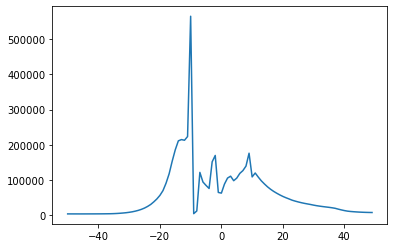

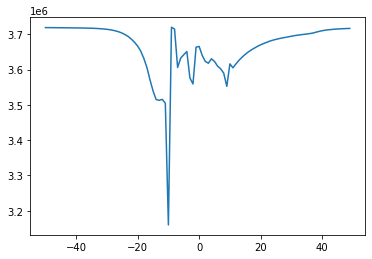

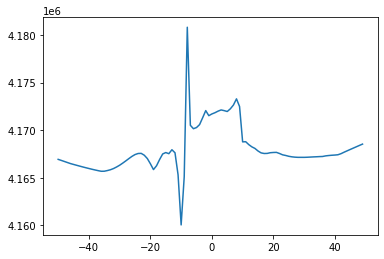

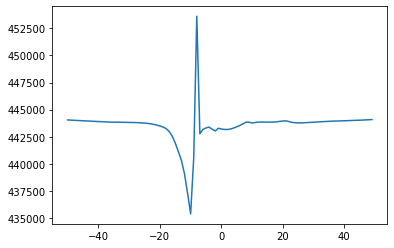

In [25]:
plt.plot(offsets, non_comp_sums)
plt.show()
plt.plot(offsets, comp_sums)
plt.show()
plt.plot(offsets, total_integral_sums)
plt.show()
plt.plot(offsets, impure_peak_sums)
plt.show()

# Knoevenagel PARAFAC dev

In [2]:
# add the path to the test data folder
knoev_data_path = "/Users/haascp/Documents/GitHub/mocca/notebooks/mix_knoevenagel_data"

# find all folders containing Agilent HPLC data (.D file extension)
folders = glob(knoev_data_path + '/*' + '.D') 
folders = sorted(folders)

In [3]:
folders

['/Users/haascp/Documents/GitHub/mocca/notebooks/mix_knoevenagel_data/2022-01-26_17-13-23_gradient.D',
 '/Users/haascp/Documents/GitHub/mocca/notebooks/mix_knoevenagel_data/2022-01-26_17-21-29_ba_1.D',
 '/Users/haascp/Documents/GitHub/mocca/notebooks/mix_knoevenagel_data/2022-01-26_17-30-02_ba_0.75.D',
 '/Users/haascp/Documents/GitHub/mocca/notebooks/mix_knoevenagel_data/2022-01-26_17-38-33_ba_0.5.D',
 '/Users/haascp/Documents/GitHub/mocca/notebooks/mix_knoevenagel_data/2022-01-26_17-47-02_ba_0,25.D',
 '/Users/haascp/Documents/GitHub/mocca/notebooks/mix_knoevenagel_data/2022-01-26_17-55-37_cl_1.D',
 '/Users/haascp/Documents/GitHub/mocca/notebooks/mix_knoevenagel_data/2022-01-26_18-04-10_cl_0.75.D',
 '/Users/haascp/Documents/GitHub/mocca/notebooks/mix_knoevenagel_data/2022-01-26_18-12-42_cl_0.5.D',
 '/Users/haascp/Documents/GitHub/mocca/notebooks/mix_knoevenagel_data/2022-01-26_18-21-11_cl_0,25.D',
 '/Users/haascp/Documents/GitHub/mocca/notebooks/mix_knoevenagel_data/2022-01-26_18-29-43

In [4]:
knoev_campaign_2 = HplcDadCampaign()

In [5]:
ba_concs = [0.965, 0.761, 0.482, 0.231]
cl_concs = [1.01, 0.744, 0.478, 0.234]
ome_concs = [0.990, 0.723, 0.455, 0.231]
nme2_concs = [0.982, 0.719, 0.468, 0.229]

In [6]:
folders[-4]

'/Users/haascp/Documents/GitHub/mocca/notebooks/mix_knoevenagel_data/2022-01-28_16-39-32_mix.D'

In [7]:
gradient_calib_2 = Gradient(folders[17])

In [8]:
for i, folder in enumerate(folders[18:22]):
    compound = Compound('benzaldehyde', ba_concs[i])
    exp = HplcInput(folder, gradient_calib_2, compound=compound)
    knoev_campaign_2.add_hplc_input(exp)

for i, folder in enumerate(folders[22:26]):
    compound = Compound('4-chlorobenzaldehyde', cl_concs[i])
    exp = HplcInput(folder, gradient_calib_2, compound=compound)
    knoev_campaign_2.add_hplc_input(exp)

for i, folder in enumerate(folders[26:30]):
    compound = Compound('4-methoxybenzaldehyde', ome_concs[i])
    exp = HplcInput(folder, gradient_calib_2, compound=compound)
    knoev_campaign_2.add_hplc_input(exp)

for i, folder in enumerate(folders[30:34]):
    compound = Compound('4-dimethylaminobenzaldehyde', nme2_concs[i])
    exp = HplcInput(folder, gradient_calib_2, compound=compound)
    knoev_campaign_2.add_hplc_input(exp)

In [9]:
gradient_react = Gradient(folders[-2])

In [10]:
exp = HplcInput(folders[-4], gradient_react)
knoev_campaign_2.add_hplc_input(exp)

In [11]:
settings = Settings('chemstation',
                    absorbance_threshold = 300, wl_high_pass = 215, 
                    peaks_high_pass = 1, peaks_low_pass = 3.2,
                    spectrum_correl_thresh=0.99, relative_distance_thresh=0.004)

----- new PARAFAC decomposition with iteration offset -9 -----
QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_compound=True), ProcessedPeak(left=1469, right=1565, maximum=1495, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=819554.4732573801, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.719, is_compound=True), ProcessedPeak(left=1476, right=1555, maximum=1503, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=535979.2223910455, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.468

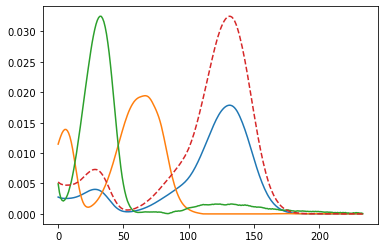

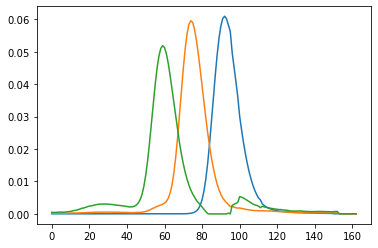

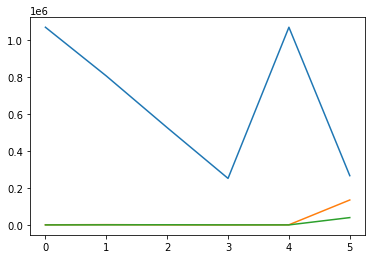

integral_array = [[1.06867113e+06 6.39403311e+02 0.00000000e+00]
 [8.05327760e+05 1.46068857e+03 3.73719513e+02]
 [5.25969409e+05 4.37159059e+02 6.93848413e+02]
 [2.51506816e+05 0.00000000e+00 1.78301938e+02]
 [1.06867113e+06 6.39403311e+02 0.00000000e+00]
 [2.66203326e+05 1.34768883e+05 3.95690530e+04]]
impure_peak_sum = 440541.26226542366
----- new PARAFAC decomposition with iteration offset -8 -----
QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_compound=True), ProcessedPeak(left=1469, right=1565, maximum=1495, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=819554.4732573801,

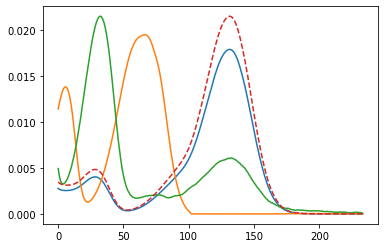

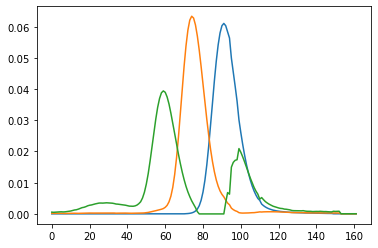

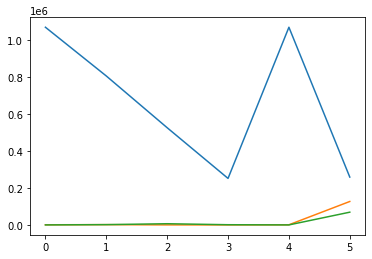

integral_array = [[1.06742635e+06 7.34488927e+02 0.00000000e+00]
 [8.04244339e+05 1.46208341e+03 1.55443569e+03]
 [5.24881926e+05 1.15787067e+02 6.40689885e+03]
 [2.51152432e+05 0.00000000e+00 1.05116386e+03]
 [1.06742635e+06 7.34488927e+02 0.00000000e+00]
 [2.58297745e+05 1.26540695e+05 6.87799802e+04]]
impure_peak_sum = 453618.42012774246
----- new PARAFAC decomposition with iteration offset -7 -----
QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_compound=True), ProcessedPeak(left=1469, right=1565, maximum=1495, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=819554.4732573801,

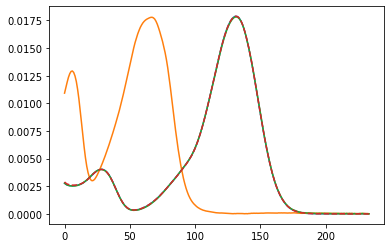

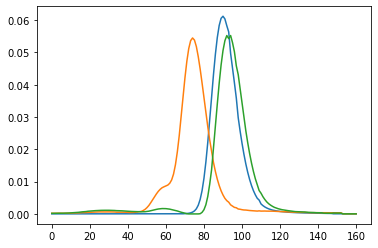

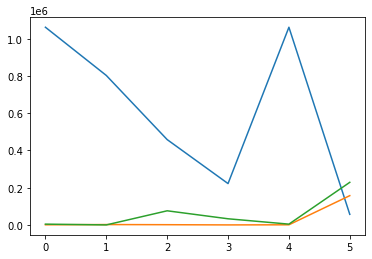

integral_array = [[1.06157640e+06 6.32682226e+02 4.20435708e+03]
 [8.02702776e+05 1.95073700e+03 0.00000000e+00]
 [4.58257130e+05 1.15695759e+03 7.58351420e+04]
 [2.22008383e+05 3.32336062e+01 3.29706972e+04]
 [1.06157640e+06 6.32682226e+02 4.20435708e+03]
 [5.68297925e+04 1.57196754e+05 2.28745061e+05]]
impure_peak_sum = 442771.60818629846
----- new PARAFAC decomposition with iteration offset -6 -----
QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_compound=True), ProcessedPeak(left=1469, right=1565, maximum=1495, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=819554.4732573801,

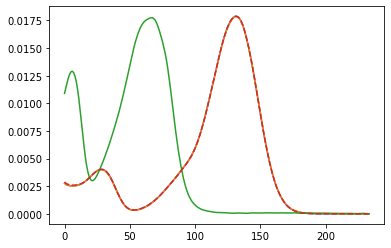

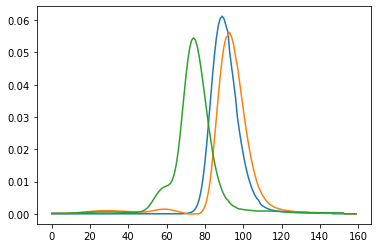

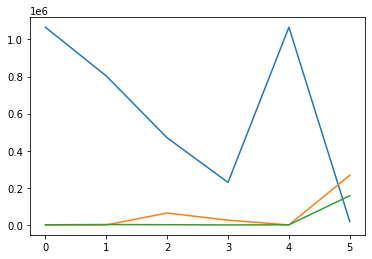

integral_array = [[1.06559885e+06 0.00000000e+00 6.31253348e+02]
 [8.02960648e+05 0.00000000e+00 2.14383360e+03]
 [4.69548543e+05 6.42326369e+04 1.12698712e+03]
 [2.28927972e+05 2.55860554e+04 0.00000000e+00]
 [1.06559885e+06 0.00000000e+00 6.31253348e+02]
 [1.78675378e+04 2.67818454e+05 1.57483119e+05]]
impure_peak_sum = 443169.11017188436
----- new PARAFAC decomposition with iteration offset -5 -----
QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_compound=True), ProcessedPeak(left=1469, right=1565, maximum=1495, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=819554.4732573801,

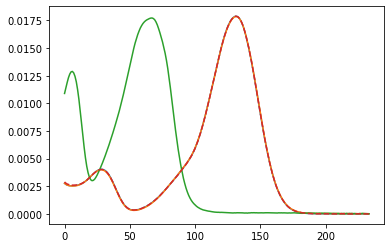

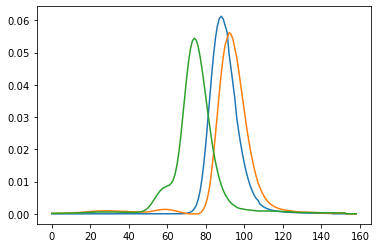

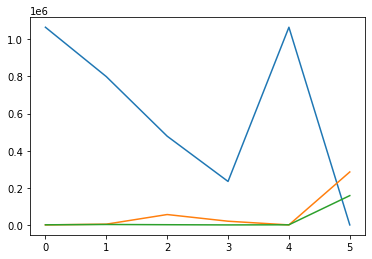

integral_array = [[1.06522438e+06 0.00000000e+00 6.33641100e+02]
 [7.99304699e+05 4.07716843e+03 2.36789326e+03]
 [4.78246939e+05 5.59339252e+04 1.07258701e+03]
 [2.34302476e+05 1.99421819e+04 0.00000000e+00]
 [1.06522438e+06 0.00000000e+00 6.33641100e+02]
 [0.00000000e+00 2.85426475e+05 1.57887520e+05]]
impure_peak_sum = 443313.9946584203
----- new PARAFAC decomposition with iteration offset -4 -----
QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_compound=True), ProcessedPeak(left=1469, right=1565, maximum=1495, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=819554.4732573801, 

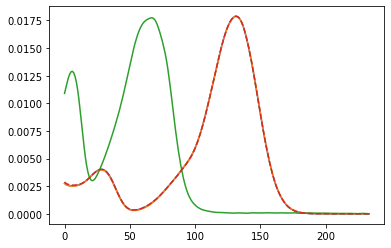

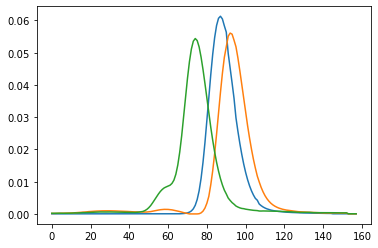

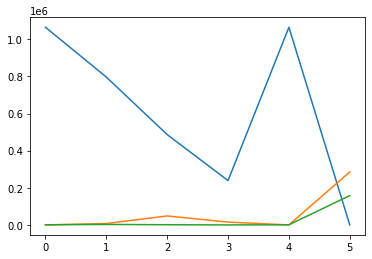

integral_array = [[1.06469738e+06 0.00000000e+00 6.56063051e+02]
 [7.96444346e+05 7.49333255e+03 2.58326438e+03]
 [4.86600524e+05 4.83582429e+04 9.88525258e+02]
 [2.38822268e+05 1.52072968e+04 0.00000000e+00]
 [1.06469738e+06 0.00000000e+00 6.56063051e+02]
 [0.00000000e+00 2.85436726e+05 1.57947321e+05]]
impure_peak_sum = 443384.0473793155
----- new PARAFAC decomposition with iteration offset -3 -----
QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_compound=True), ProcessedPeak(left=1469, right=1565, maximum=1495, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=819554.4732573801, 

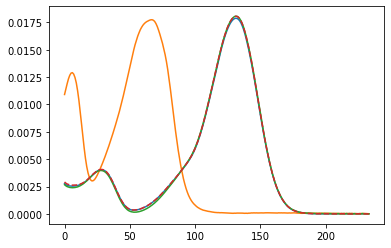

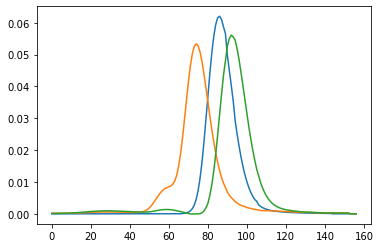

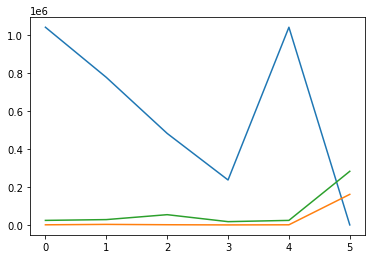

integral_array = [[1.04066168e+06 5.94586576e+02 2.38183647e+04]
 [7.76858456e+05 2.75971443e+03 2.79898100e+04]
 [4.81753076e+05 9.34124874e+02 5.39102521e+04]
 [2.36569315e+05 0.00000000e+00 1.71970428e+04]
 [1.04066168e+06 5.94586576e+02 2.38183647e+04]
 [0.00000000e+00 1.60880046e+05 2.82309302e+05]]
impure_peak_sum = 443189.34796171024
----- new PARAFAC decomposition with iteration offset -2 -----
QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_compound=True), ProcessedPeak(left=1469, right=1565, maximum=1495, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=819554.4732573801,

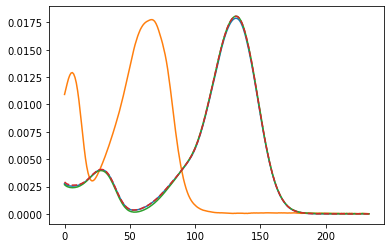

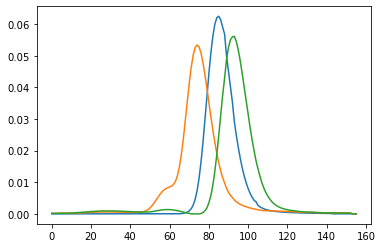

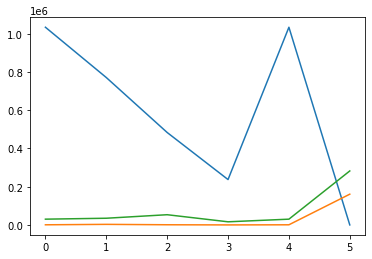

integral_array = [[1.03387049e+06 6.41533964e+02 3.00899511e+04]
 [7.70866010e+05 2.93382705e+03 3.49298733e+04]
 [4.83401578e+05 8.04862823e+02 5.33403731e+04]
 [2.37253986e+05 0.00000000e+00 1.62854400e+04]
 [1.03387049e+06 6.41533964e+02 3.00899511e+04]
 [0.00000000e+00 1.60753131e+05 2.82283700e+05]]
impure_peak_sum = 443036.8305789497
----- new PARAFAC decomposition with iteration offset -1 -----
QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_compound=True), ProcessedPeak(left=1469, right=1565, maximum=1495, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=819554.4732573801, 

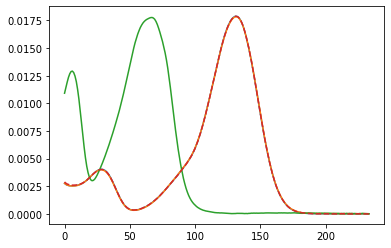

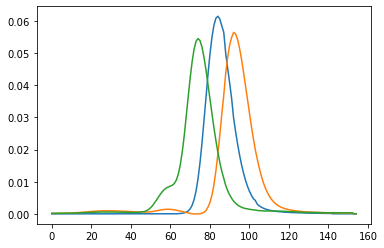

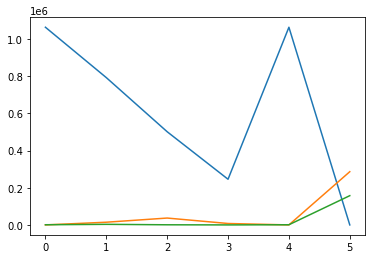

integral_array = [[1.06260469e+06 0.00000000e+00 9.07892210e+02]
 [7.91911565e+05 1.45099500e+04 3.13561528e+03]
 [5.00922198e+05 3.69037397e+04 6.74262621e+02]
 [2.45530528e+05 7.63501501e+03 0.00000000e+00]
 [1.06260469e+06 0.00000000e+00 9.07892210e+02]
 [0.00000000e+00 2.86066878e+05 1.57210328e+05]]
impure_peak_sum = 443277.20537932083
----- new PARAFAC decomposition with iteration offset 0 -----
QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_compound=True), ProcessedPeak(left=1469, right=1565, maximum=1495, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=819554.4732573801, 

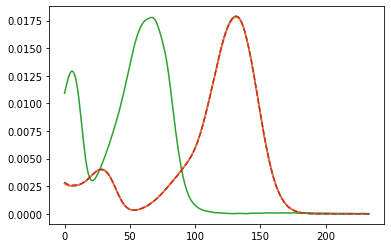

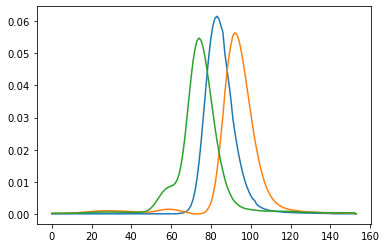

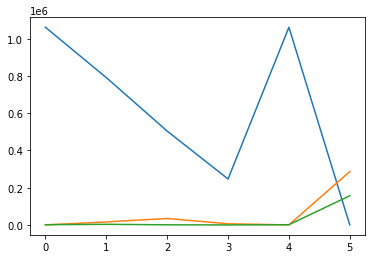

integral_array = [[1.06182875e+06 0.00000000e+00 1.08646808e+03]
 [7.91413392e+05 1.59814714e+04 3.25054530e+03]
 [5.04064722e+05 3.46044221e+04 5.73565070e+02]
 [2.46611158e+05 6.16671026e+03 0.00000000e+00]
 [1.06182875e+06 0.00000000e+00 1.08646808e+03]
 [0.00000000e+00 2.86596595e+05 1.56613134e+05]]
impure_peak_sum = 443209.7287496588
----- new PARAFAC decomposition with iteration offset 1 -----
QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_compound=True), ProcessedPeak(left=1469, right=1565, maximum=1495, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=819554.4732573801, i

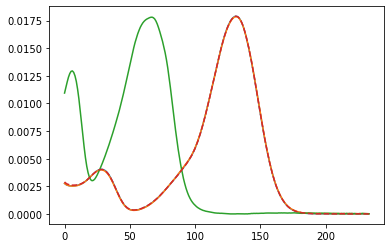

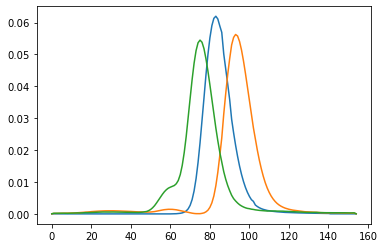

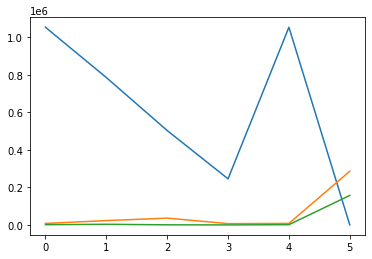

integral_array = [[1.05319058e+06 7.95081476e+03 1.31271742e+03]
 [7.85394288e+05 2.29454265e+04 3.31312969e+03]
 [5.02986879e+05 3.62578632e+04 5.17597923e+02]
 [2.45548518e+05 6.79276646e+03 0.00000000e+00]
 [1.05319058e+06 7.95081476e+03 1.31271742e+03]
 [0.00000000e+00 2.86076595e+05 1.57093559e+05]]
impure_peak_sum = 443170.15382692637
----- new PARAFAC decomposition with iteration offset 2 -----
QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_compound=True), ProcessedPeak(left=1469, right=1565, maximum=1495, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=819554.4732573801, 

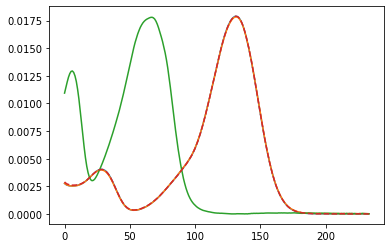

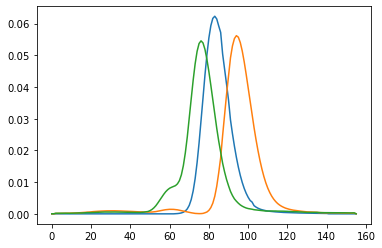

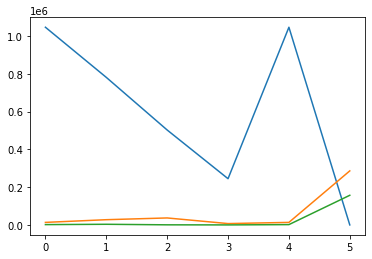

integral_array = [[1.04710387e+06 1.33930512e+04 1.62654311e+03]
 [7.81554998e+05 2.76287966e+04 3.36100580e+03]
 [5.02752983e+05 3.68954526e+04 4.91400865e+02]
 [2.44833405e+05 7.06843415e+03 0.00000000e+00]
 [1.04710387e+06 1.33930512e+04 1.62654311e+03]
 [0.00000000e+00 2.86223007e+05 1.56942991e+05]]
impure_peak_sum = 443165.9977213098
----- new PARAFAC decomposition with iteration offset 3 -----
QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_compound=True), ProcessedPeak(left=1469, right=1565, maximum=1495, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=819554.4732573801, i

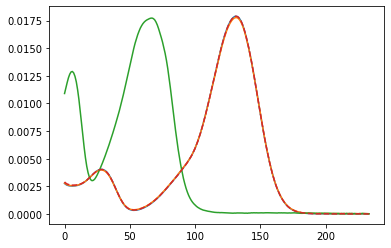

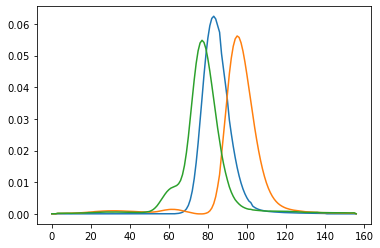

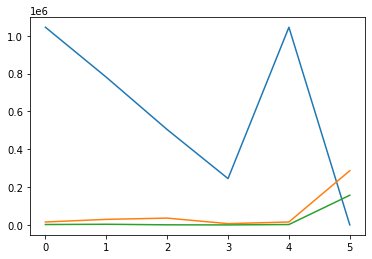

integral_array = [[1.04448025e+06 1.54047380e+04 2.05957217e+03]
 [7.80491876e+05 2.93146608e+04 3.44802622e+03]
 [5.03880862e+05 3.59013618e+04 5.25544626e+02]
 [2.44747409e+05 6.71696538e+03 0.00000000e+00]
 [1.04448025e+06 1.54047380e+04 2.05957217e+03]
 [0.00000000e+00 2.86511016e+05 1.56699733e+05]]
impure_peak_sum = 443210.7487955857
----- new PARAFAC decomposition with iteration offset 4 -----
QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_compound=True), ProcessedPeak(left=1469, right=1565, maximum=1495, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=819554.4732573801, i

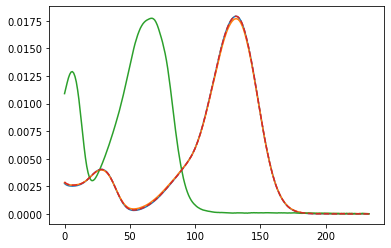

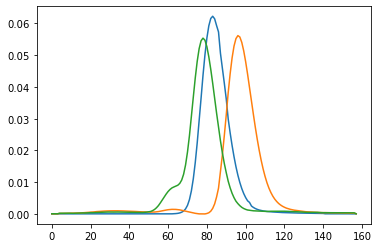

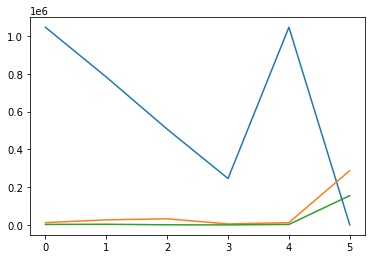

integral_array = [[1.04715458e+06 1.21145617e+04 2.61638602e+03]
 [7.83448666e+05 2.67447493e+04 3.49426435e+03]
 [5.07218296e+05 3.23967927e+04 6.62110674e+02]
 [2.45770332e+05 5.24331359e+03 0.00000000e+00]
 [1.04715458e+06 1.21145617e+04 2.61638602e+03]
 [0.00000000e+00 2.88021161e+05 1.55283970e+05]]
impure_peak_sum = 443305.13106916996
----- new PARAFAC decomposition with iteration offset 5 -----
QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_compound=True), ProcessedPeak(left=1469, right=1565, maximum=1495, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=819554.4732573801, 

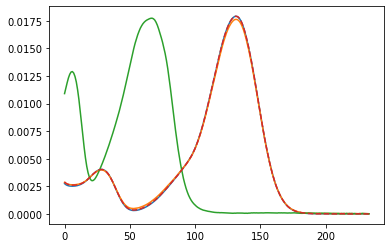

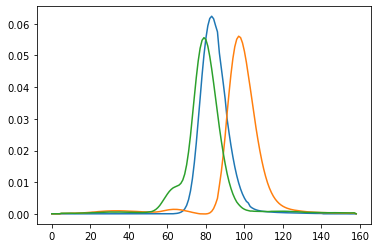

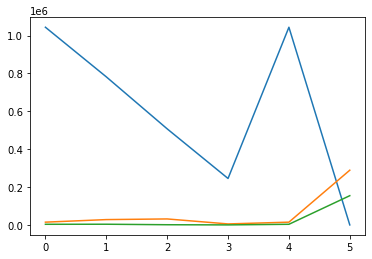

integral_array = [[1.04411343e+06 1.45788276e+04 3.34623188e+03]
 [7.82129930e+05 2.80985081e+04 3.62438686e+03]
 [5.07469532e+05 3.15533022e+04 9.60565272e+02]
 [2.45339325e+05 5.22592050e+03 6.93897477e+01]
 [1.04411343e+06 1.45788276e+04 3.34623188e+03]
 [0.00000000e+00 2.89009964e+05 1.54404119e+05]]
impure_peak_sum = 443414.08328233764
----- new PARAFAC decomposition with iteration offset 6 -----
QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_compound=True), ProcessedPeak(left=1469, right=1565, maximum=1495, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=819554.4732573801, 

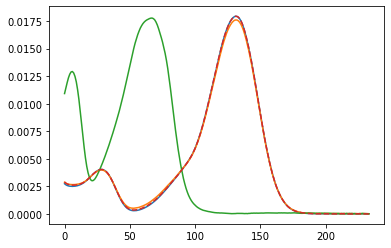

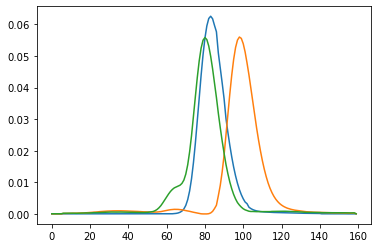

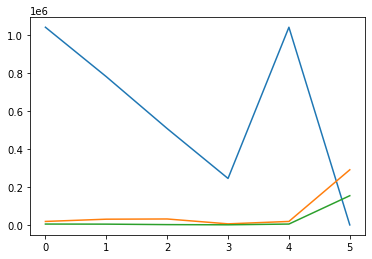

integral_array = [[1.03957558e+06 1.82923732e+04 4.53587536e+03]
 [7.79630491e+05 3.00774414e+04 4.08895403e+03]
 [5.06685798e+05 3.12459758e+04 1.56408508e+03]
 [2.44426060e+05 5.60888339e+03 5.65157617e+02]
 [1.03957558e+06 1.82923732e+04 4.53587536e+03]
 [0.00000000e+00 2.89929210e+05 1.53613463e+05]]
impure_peak_sum = 443542.67271333485
----- new PARAFAC decomposition with iteration offset 7 -----
QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_compound=True), ProcessedPeak(left=1469, right=1565, maximum=1495, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=819554.4732573801, 

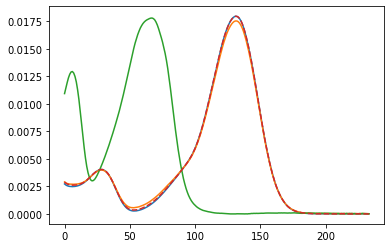

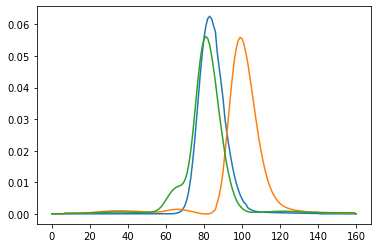

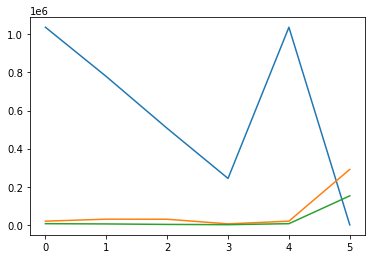

integral_array = [[1036798.41483894   19653.40312163    6472.39050265]
 [ 778352.43527153   30073.65267902    5144.31247138]
 [ 506480.55328462   29783.20573774    2614.24200699]
 [ 243859.36641574    5541.99734798    1251.28778557]
 [1036798.41483894   19653.40312163    6472.39050265]
 [      0.          291289.8086542   152399.78622763]]
impure_peak_sum = 443689.59488183144
----- new PARAFAC decomposition with iteration offset 8 -----
QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_compound=True), ProcessedPeak(left=1469, right=1565, maximum=1495, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pur

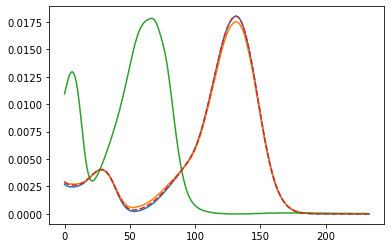

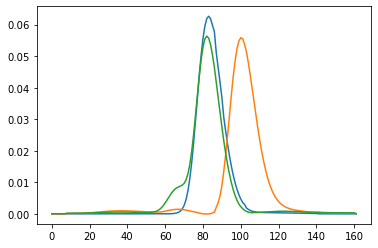

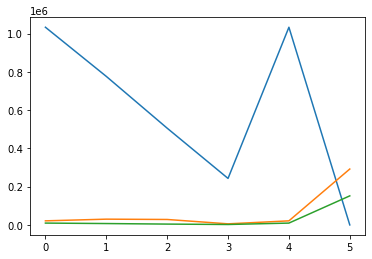

integral_array = [[1032779.76233996   21274.26325658    9570.58326332]
 [ 776023.96187863   30075.5668357     7146.76424506]
 [ 505423.82385871   28420.8024376     4318.95592979]
 [ 242954.47968392    5631.92198402    2208.77079542]
 [1032779.76233996   21274.26325658    9570.58326332]
 [      0.          292033.83919314  151802.00681449]]
impure_peak_sum = 443835.8460076334
----- new PARAFAC decomposition with iteration offset 9 -----
QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_compound=True), ProcessedPeak(left=1469, right=1565, maximum=1495, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure

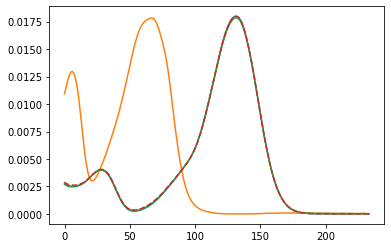

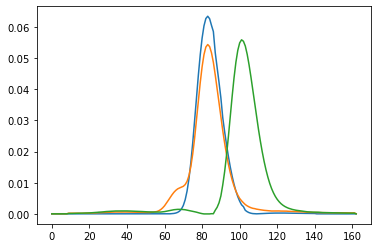

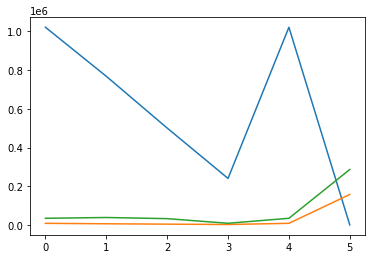

integral_array = [[1021655.36243856    8201.3721606    34255.57510049]
 [ 768215.65755187    5913.3248013    38312.68786798]
 [ 500657.38883023    3971.517804     32402.05236612]
 [ 240346.38950777    2132.43982148    8462.402502  ]
 [1021655.36243856    8201.3721606    34255.57510049]
 [      0.          157331.7440396   286516.39973703]]
impure_peak_sum = 443848.14377663226
----- new PARAFAC decomposition with iteration offset -9 -----
QualiComponent(compound_id='4-chlorobenzaldehyde', left=1592, right=1663, maximum=1618, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1598, right=1666, maximum=1617, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=494440.6935449565, istd=[], compound_id='4-chlorobenzaldehyde', concentration=1.01, is_compound=True), ProcessedPeak(left=1588, right=1668, maximum=1618, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integra

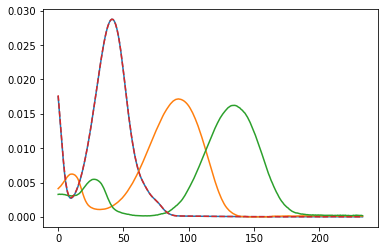

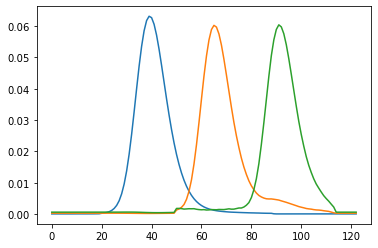

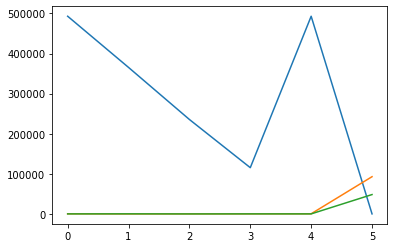

integral_array = [[4.92838221e+05 7.73789139e+02 4.86299238e+02]
 [3.65326659e+05 4.45187475e+02 6.30533868e+02]
 [2.35658130e+05 5.37982930e+02 4.28126197e+02]
 [1.15633508e+05 6.08111603e+02 5.44263233e+02]
 [4.92838221e+05 7.73789139e+02 4.86299238e+02]
 [5.03796876e+02 9.31637228e+04 4.86328440e+04]]
impure_peak_sum = 142300.36368489114
----- new PARAFAC decomposition with iteration offset -8 -----
QualiComponent(compound_id='4-chlorobenzaldehyde', left=1592, right=1663, maximum=1618, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1598, right=1666, maximum=1617, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=494440.6935449565, istd=[], compound_id='4-chlorobenzaldehyde', concentration=1.01, is_compound=True), ProcessedPeak(left=1588, right=1668, maximum=1618, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=369377.9600084522, istd=[], compou

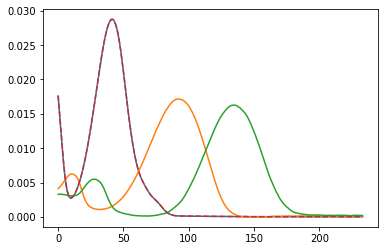

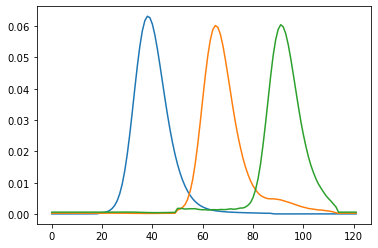

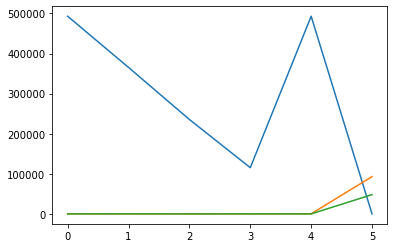

integral_array = [[4.92830788e+05 7.38312716e+02 4.73741134e+02]
 [3.65320584e+05 5.04971073e+02 6.03903529e+02]
 [2.35654451e+05 5.57506064e+02 4.35947234e+02]
 [1.15631924e+05 6.25975649e+02 5.50920396e+02]
 [4.92830788e+05 7.38312716e+02 4.73741134e+02]
 [4.65992719e+02 9.32662483e+04 4.84955758e+04]]
impure_peak_sum = 142227.8167871286
----- new PARAFAC decomposition with iteration offset -7 -----
QualiComponent(compound_id='4-chlorobenzaldehyde', left=1592, right=1663, maximum=1618, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1598, right=1666, maximum=1617, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=494440.6935449565, istd=[], compound_id='4-chlorobenzaldehyde', concentration=1.01, is_compound=True), ProcessedPeak(left=1588, right=1668, maximum=1618, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=369377.9600084522, istd=[], compoun

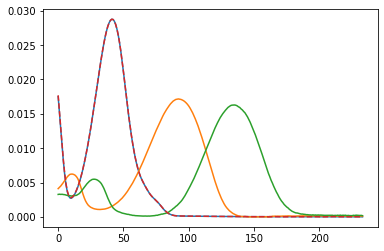

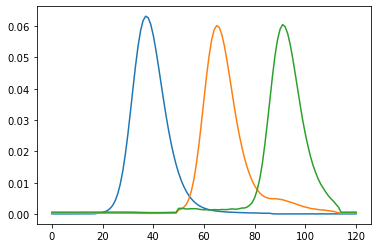

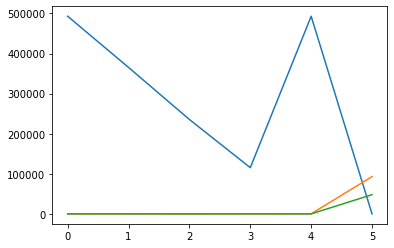

integral_array = [[4.92822501e+05 7.07015605e+02 4.63681335e+02]
 [3.65314074e+05 5.52924613e+02 5.79670784e+02]
 [2.35650422e+05 5.72695045e+02 4.44300302e+02]
 [1.15630148e+05 6.37875918e+02 5.57184192e+02]
 [4.92822501e+05 7.07015605e+02 4.63681335e+02]
 [4.34271670e+02 9.33164847e+04 4.84075932e+04]]
impure_peak_sum = 142158.34958581853
----- new PARAFAC decomposition with iteration offset -6 -----
QualiComponent(compound_id='4-chlorobenzaldehyde', left=1592, right=1663, maximum=1618, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1598, right=1666, maximum=1617, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=494440.6935449565, istd=[], compound_id='4-chlorobenzaldehyde', concentration=1.01, is_compound=True), ProcessedPeak(left=1588, right=1668, maximum=1618, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=369377.9600084522, istd=[], compou

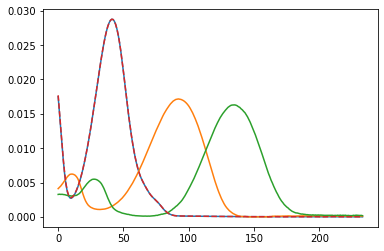

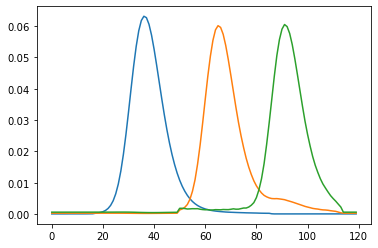

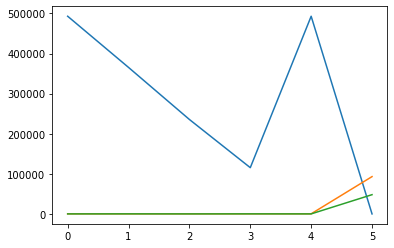

integral_array = [[4.92813405e+05 6.79932743e+02 4.55880837e+02]
 [3.65307096e+05 5.91210725e+02 5.58628855e+02]
 [2.35646044e+05 5.84223882e+02 4.52061525e+02]
 [1.15628180e+05 6.44639251e+02 5.62482723e+02]
 [4.92813405e+05 6.79932743e+02 4.55880837e+02]
 [4.07902935e+02 9.33432175e+04 4.83405310e+04]]
impure_peak_sum = 142091.65147472243
----- new PARAFAC decomposition with iteration offset -5 -----
QualiComponent(compound_id='4-chlorobenzaldehyde', left=1592, right=1663, maximum=1618, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1598, right=1666, maximum=1617, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=494440.6935449565, istd=[], compound_id='4-chlorobenzaldehyde', concentration=1.01, is_compound=True), ProcessedPeak(left=1588, right=1668, maximum=1618, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=369377.9600084522, istd=[], compou

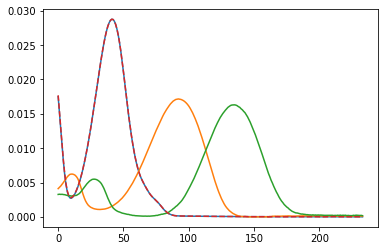

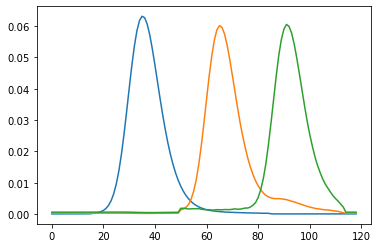

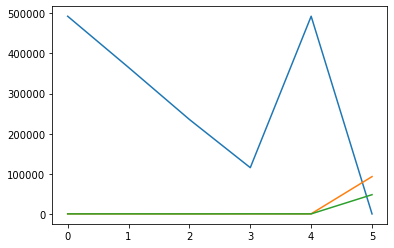

integral_array = [[4.92803626e+05 6.56630979e+02 4.49894356e+02]
 [3.65299697e+05 6.21411075e+02 5.41422467e+02]
 [2.35641367e+05 5.92336111e+02 4.58762363e+02]
 [1.15626044e+05 6.46615492e+02 5.66652580e+02]
 [4.92803626e+05 6.56630979e+02 4.49894356e+02]
 [3.86132145e+02 9.33490450e+04 4.82921650e+04]]
impure_peak_sum = 142027.34216247156
----- new PARAFAC decomposition with iteration offset -4 -----
QualiComponent(compound_id='4-chlorobenzaldehyde', left=1592, right=1663, maximum=1618, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1598, right=1666, maximum=1617, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=494440.6935449565, istd=[], compound_id='4-chlorobenzaldehyde', concentration=1.01, is_compound=True), ProcessedPeak(left=1588, right=1668, maximum=1618, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=369377.9600084522, istd=[], compou

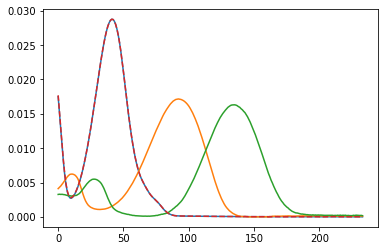

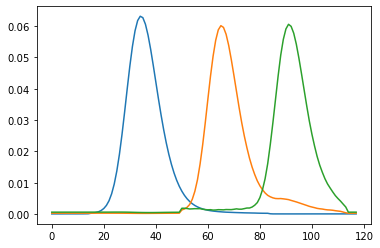

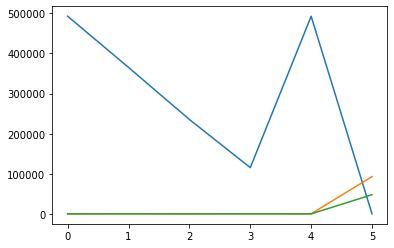

integral_array = [[4.92793281e+05 6.36926124e+02 4.45160111e+02]
 [3.65291936e+05 6.45108094e+02 5.27610438e+02]
 [2.35636437e+05 5.97306656e+02 4.64168634e+02]
 [1.15623767e+05 6.44329916e+02 5.69542427e+02]
 [4.92793281e+05 6.36926124e+02 4.45160111e+02]
 [3.68242728e+02 9.33498704e+04 4.82469034e+04]]
impure_peak_sum = 141965.01650235915
----- new PARAFAC decomposition with iteration offset -3 -----
QualiComponent(compound_id='4-chlorobenzaldehyde', left=1592, right=1663, maximum=1618, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1598, right=1666, maximum=1617, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=494440.6935449565, istd=[], compound_id='4-chlorobenzaldehyde', concentration=1.01, is_compound=True), ProcessedPeak(left=1588, right=1668, maximum=1618, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=369377.9600084522, istd=[], compou

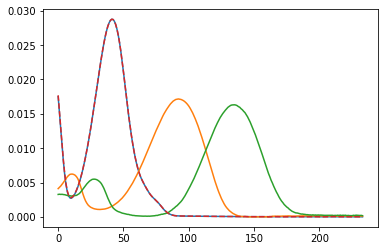

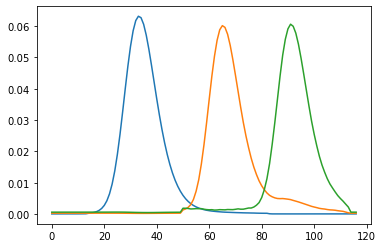

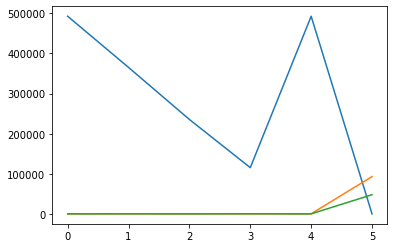

integral_array = [[4.92782422e+05 6.20430637e+02 4.41765752e+02]
 [3.65283830e+05 6.63687572e+02 5.17276536e+02]
 [2.35631277e+05 5.98646377e+02 4.68198460e+02]
 [1.15621359e+05 6.38024279e+02 5.71846335e+02]
 [4.92782422e+05 6.20430637e+02 4.41765752e+02]
 [3.53638529e+02 9.33321359e+04 4.82186441e+04]]
impure_peak_sum = 141904.41853675744
----- new PARAFAC decomposition with iteration offset -2 -----
QualiComponent(compound_id='4-chlorobenzaldehyde', left=1592, right=1663, maximum=1618, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1598, right=1666, maximum=1617, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=494440.6935449565, istd=[], compound_id='4-chlorobenzaldehyde', concentration=1.01, is_compound=True), ProcessedPeak(left=1588, right=1668, maximum=1618, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=369377.9600084522, istd=[], compou

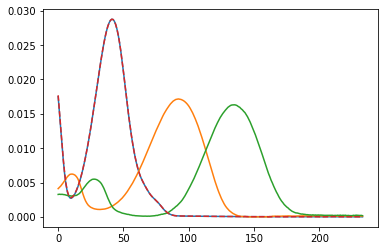

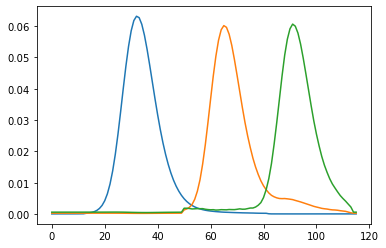

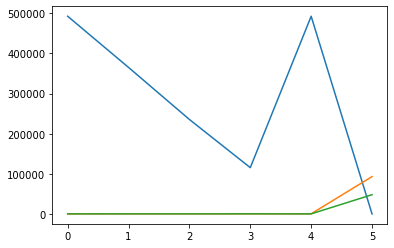

integral_array = [[4.92771102e+05 6.07051747e+02 4.39386602e+02]
 [3.65275406e+05 6.78596358e+02 5.09990845e+02]
 [2.35625909e+05 5.96335477e+02 4.70852416e+02]
 [1.15618834e+05 6.27963127e+02 5.73762489e+02]
 [4.92771102e+05 6.07051747e+02 4.39386602e+02]
 [3.41815966e+02 9.33066032e+04 4.81968824e+04]]
impure_peak_sum = 141845.30154517642
----- new PARAFAC decomposition with iteration offset -1 -----
QualiComponent(compound_id='4-chlorobenzaldehyde', left=1592, right=1663, maximum=1618, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1598, right=1666, maximum=1617, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=494440.6935449565, istd=[], compound_id='4-chlorobenzaldehyde', concentration=1.01, is_compound=True), ProcessedPeak(left=1588, right=1668, maximum=1618, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=369377.9600084522, istd=[], compou

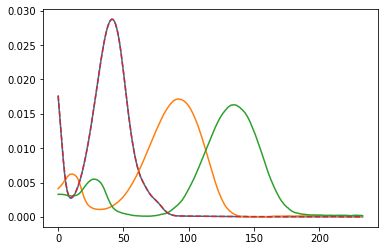

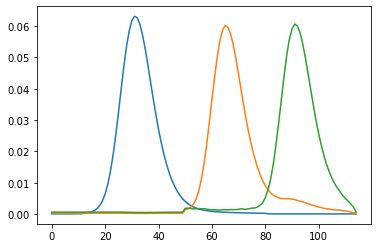

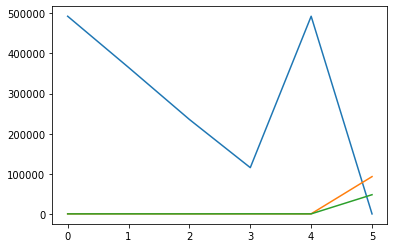

integral_array = [[4.92759409e+05 5.96452966e+02 4.37681638e+02]
 [3.65266719e+05 6.90966808e+02 5.04922835e+02]
 [2.35620370e+05 5.90626091e+02 4.72711060e+02]
 [1.15616215e+05 6.14339189e+02 5.75255228e+02]
 [4.92759409e+05 5.96452966e+02 4.37681638e+02]
 [3.32313997e+02 9.32813095e+04 4.81737956e+04]]
impure_peak_sum = 141787.41912431605
----- new PARAFAC decomposition with iteration offset 0 -----
QualiComponent(compound_id='4-chlorobenzaldehyde', left=1592, right=1663, maximum=1618, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1598, right=1666, maximum=1617, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=494440.6935449565, istd=[], compound_id='4-chlorobenzaldehyde', concentration=1.01, is_compound=True), ProcessedPeak(left=1588, right=1668, maximum=1618, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=369377.9600084522, istd=[], compoun

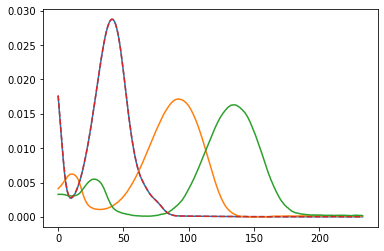

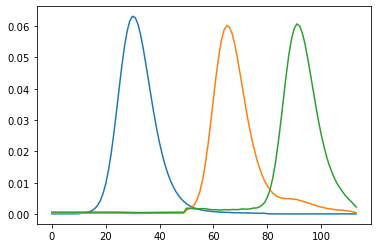

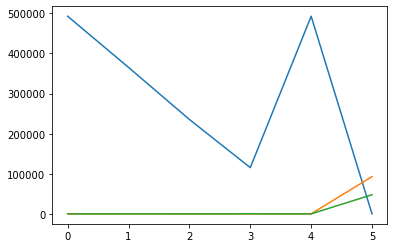

integral_array = [[4.92747435e+05 5.87981673e+02 4.36763413e+02]
 [3.65257835e+05 7.01256460e+02 5.01661308e+02]
 [2.35614704e+05 5.81238040e+02 4.74165733e+02]
 [1.15613525e+05 5.97065811e+02 5.76661145e+02]
 [4.92747435e+05 5.87981673e+02 4.36763413e+02]
 [3.24717772e+02 9.32399474e+04 4.81658902e+04]]
impure_peak_sum = 141730.55533548477
----- new PARAFAC decomposition with iteration offset 1 -----
QualiComponent(compound_id='4-chlorobenzaldehyde', left=1592, right=1663, maximum=1618, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1598, right=1666, maximum=1617, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=494440.6935449565, istd=[], compound_id='4-chlorobenzaldehyde', concentration=1.01, is_compound=True), ProcessedPeak(left=1588, right=1668, maximum=1618, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=369377.9600084522, istd=[], compoun

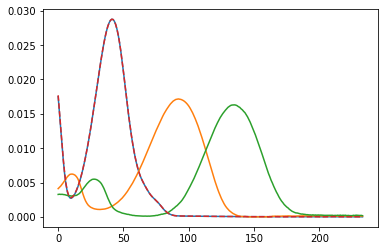

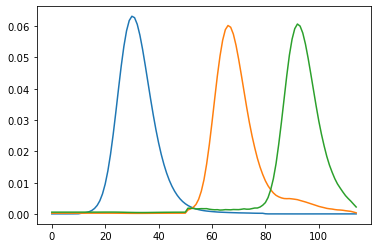

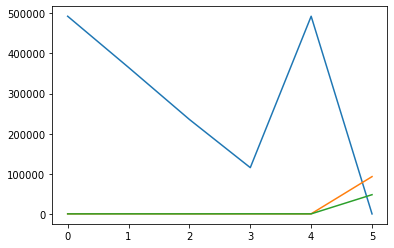

integral_array = [[4.92762811e+05 5.81832603e+02 4.36964795e+02]
 [3.65269233e+05 7.10951006e+02 5.00668745e+02]
 [2.35622128e+05 5.68933820e+02 4.75979727e+02]
 [1.15617258e+05 5.77602243e+02 5.79060432e+02]
 [4.92762811e+05 5.81832603e+02 4.36964795e+02]
 [3.18695828e+02 9.32552224e+04 4.82050525e+04]]
impure_peak_sum = 141778.97069835677
----- new PARAFAC decomposition with iteration offset 2 -----
QualiComponent(compound_id='4-chlorobenzaldehyde', left=1592, right=1663, maximum=1618, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1598, right=1666, maximum=1617, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=494440.6935449565, istd=[], compound_id='4-chlorobenzaldehyde', concentration=1.01, is_compound=True), ProcessedPeak(left=1588, right=1668, maximum=1618, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=369377.9600084522, istd=[], compoun

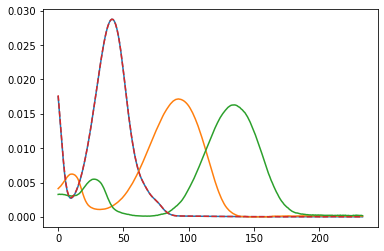

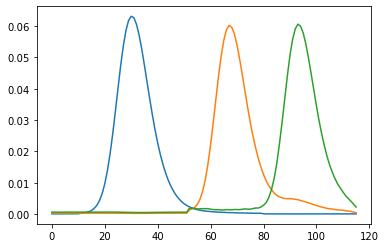

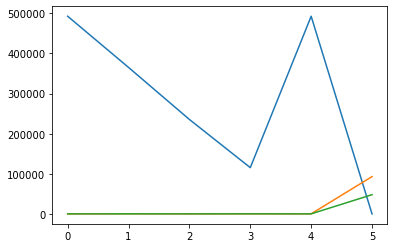

integral_array = [[4.92778124e+05 5.76653567e+02 4.37155623e+02]
 [3.65280587e+05 7.19549543e+02 5.00992235e+02]
 [2.35629525e+05 5.53257681e+02 4.77680483e+02]
 [1.15620971e+05 5.55812243e+02 5.81448232e+02]
 [4.92778124e+05 5.76653567e+02 4.37155623e+02]
 [3.13911465e+02 9.32590332e+04 4.82550614e+04]]
impure_peak_sum = 141828.00605579885
----- new PARAFAC decomposition with iteration offset 3 -----
QualiComponent(compound_id='4-chlorobenzaldehyde', left=1592, right=1663, maximum=1618, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1598, right=1666, maximum=1617, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=494440.6935449565, istd=[], compound_id='4-chlorobenzaldehyde', concentration=1.01, is_compound=True), ProcessedPeak(left=1588, right=1668, maximum=1618, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=369377.9600084522, istd=[], compoun

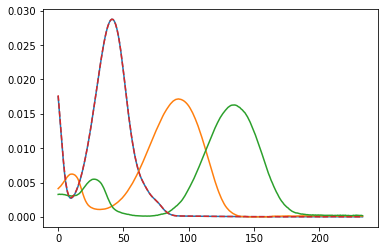

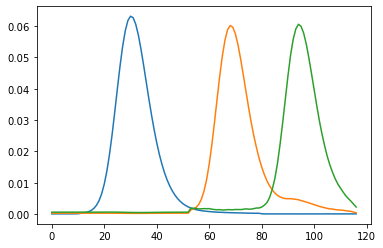

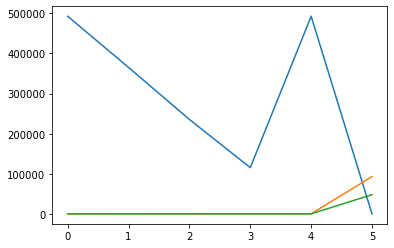

integral_array = [[4.92793428e+05 5.72085824e+02 4.37569609e+02]
 [3.65291940e+05 7.26548503e+02 5.01619417e+02]
 [2.35636919e+05 5.34821429e+02 4.79662150e+02]
 [1.15624673e+05 5.32728267e+02 5.83838714e+02]
 [4.92793428e+05 5.72085824e+02 4.37569609e+02]
 [3.10105737e+02 9.32515516e+04 4.83158659e+04]]
impure_peak_sum = 141877.52331026198
----- new PARAFAC decomposition with iteration offset 4 -----
QualiComponent(compound_id='4-chlorobenzaldehyde', left=1592, right=1663, maximum=1618, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1598, right=1666, maximum=1617, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=494440.6935449565, istd=[], compound_id='4-chlorobenzaldehyde', concentration=1.01, is_compound=True), ProcessedPeak(left=1588, right=1668, maximum=1618, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=369377.9600084522, istd=[], compoun

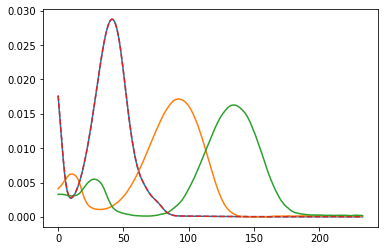

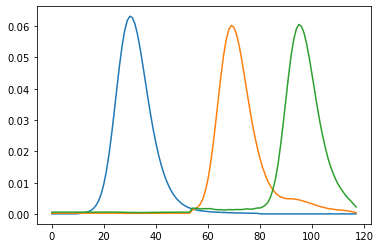

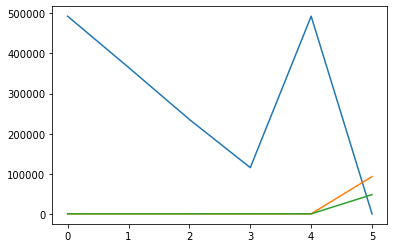

integral_array = [[4.92808793e+05 5.67705899e+02 4.37852069e+02]
 [3.65303339e+05 7.32196915e+02 5.02336790e+02]
 [2.35644340e+05 5.14452160e+02 4.81822339e+02]
 [1.15628382e+05 5.09659298e+02 5.85829229e+02]
 [4.92808793e+05 5.67705899e+02 4.37852069e+02]
 [3.07086517e+02 9.32511001e+04 4.83692257e+04]]
impure_peak_sum = 141927.4122967994
----- new PARAFAC decomposition with iteration offset 5 -----
QualiComponent(compound_id='4-chlorobenzaldehyde', left=1592, right=1663, maximum=1618, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1598, right=1666, maximum=1617, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=494440.6935449565, istd=[], compound_id='4-chlorobenzaldehyde', concentration=1.01, is_compound=True), ProcessedPeak(left=1588, right=1668, maximum=1618, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=369377.9600084522, istd=[], compound

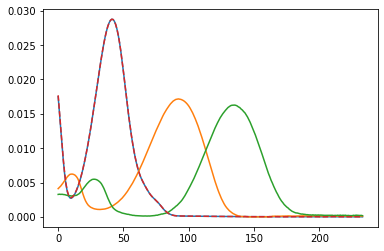

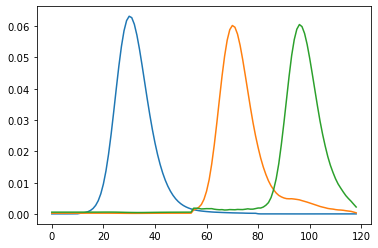

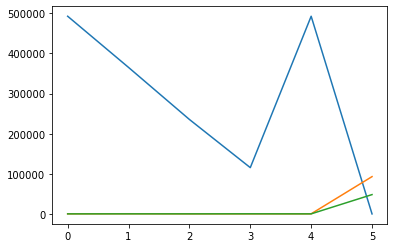

integral_array = [[4.92824262e+05 5.62937277e+02 4.38218099e+02]
 [3.65314820e+05 7.35904697e+02 5.03183468e+02]
 [2.35651809e+05 4.92476860e+02 4.84138675e+02]
 [1.15632103e+05 4.87845129e+02 5.87963945e+02]
 [4.92824262e+05 5.62937277e+02 4.38218099e+02]
 [3.04687782e+02 9.32414818e+04 4.84314556e+04]]
impure_peak_sum = 141977.62525116946
----- new PARAFAC decomposition with iteration offset 6 -----
QualiComponent(compound_id='4-chlorobenzaldehyde', left=1592, right=1663, maximum=1618, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1598, right=1666, maximum=1617, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=494440.6935449565, istd=[], compound_id='4-chlorobenzaldehyde', concentration=1.01, is_compound=True), ProcessedPeak(left=1588, right=1668, maximum=1618, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=369377.9600084522, istd=[], compoun

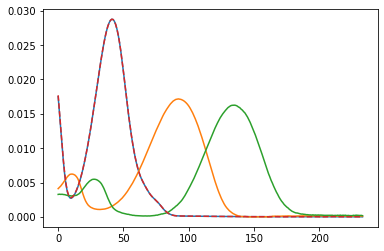

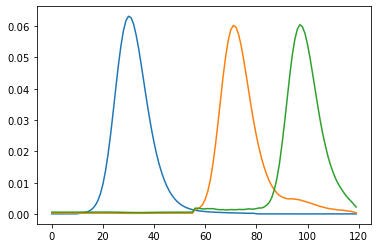

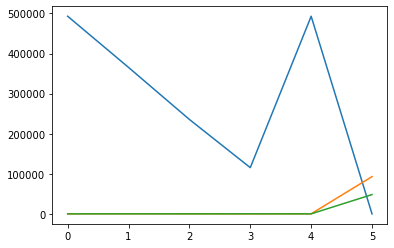

integral_array = [[4.92839832e+05 5.57441467e+02 4.38982928e+02]
 [3.65326380e+05 7.37374885e+02 5.03994567e+02]
 [2.35659323e+05 4.69729676e+02 4.86524282e+02]
 [1.15635836e+05 4.68531300e+02 5.90287744e+02]
 [4.92839832e+05 5.57441467e+02 4.38982928e+02]
 [3.02793136e+02 9.32224832e+04 4.85028567e+04]]
impure_peak_sum = 142028.13311486648
----- new PARAFAC decomposition with iteration offset 7 -----
QualiComponent(compound_id='4-chlorobenzaldehyde', left=1592, right=1663, maximum=1618, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1598, right=1666, maximum=1617, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=494440.6935449565, istd=[], compound_id='4-chlorobenzaldehyde', concentration=1.01, is_compound=True), ProcessedPeak(left=1588, right=1668, maximum=1618, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=369377.9600084522, istd=[], compoun

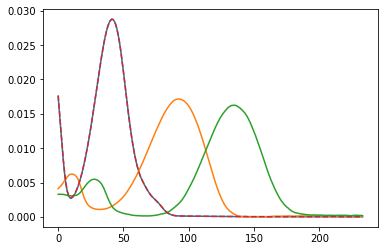

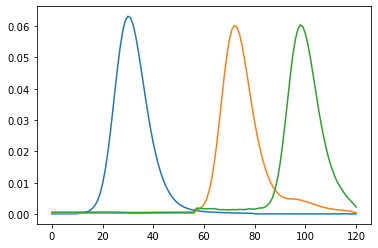

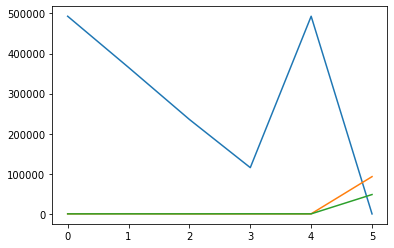

integral_array = [[4.92855509e+05 5.51023195e+02 4.40056499e+02]
 [3.65338021e+05 7.36790561e+02 5.04780336e+02]
 [2.35666882e+05 4.47168322e+02 4.88466674e+02]
 [1.15639579e+05 4.52839806e+02 5.92497570e+02]
 [4.92855509e+05 5.51023195e+02 4.40056499e+02]
 [3.01316814e+02 9.32113619e+04 4.85662294e+04]]
impure_peak_sum = 142078.9081103646
----- new PARAFAC decomposition with iteration offset 8 -----
QualiComponent(compound_id='4-chlorobenzaldehyde', left=1592, right=1663, maximum=1618, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1598, right=1666, maximum=1617, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=494440.6935449565, istd=[], compound_id='4-chlorobenzaldehyde', concentration=1.01, is_compound=True), ProcessedPeak(left=1588, right=1668, maximum=1618, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=369377.9600084522, istd=[], compound

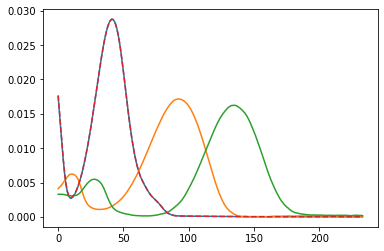

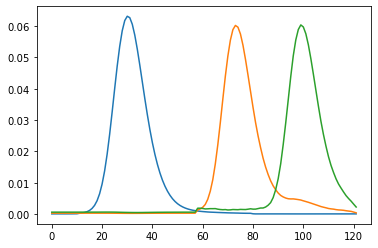

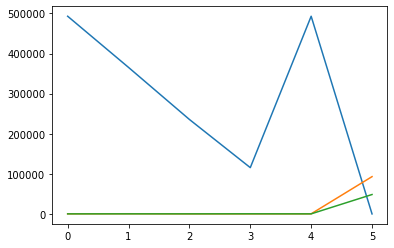

integral_array = [[4.92871368e+05 5.43139424e+02 4.41139912e+02]
 [3.65349800e+05 7.33804641e+02 5.05694305e+02]
 [2.35674522e+05 4.25652988e+02 4.90206239e+02]
 [1.15643353e+05 4.41182482e+02 5.94291154e+02]
 [4.92871368e+05 5.43139424e+02 4.41139912e+02]
 [3.00130399e+02 9.32017381e+04 4.86279715e+04]]
impure_peak_sum = 142129.8400758127
----- new PARAFAC decomposition with iteration offset 9 -----
QualiComponent(compound_id='4-chlorobenzaldehyde', left=1592, right=1663, maximum=1618, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1598, right=1666, maximum=1617, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=494440.6935449565, istd=[], compound_id='4-chlorobenzaldehyde', concentration=1.01, is_compound=True), ProcessedPeak(left=1588, right=1668, maximum=1618, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=369377.9600084522, istd=[], compound

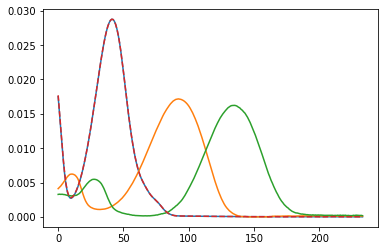

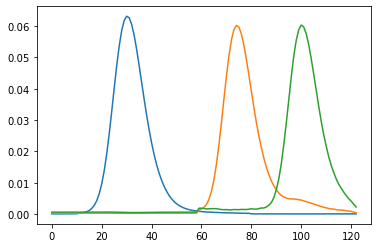

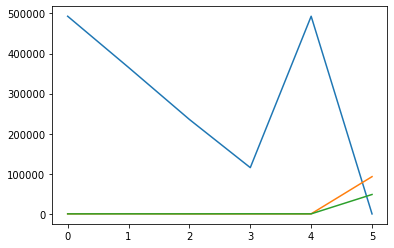

integral_array = [[4.92887371e+05 5.33672991e+02 4.42251993e+02]
 [3.65361686e+05 7.28241394e+02 5.07162730e+02]
 [2.35682220e+05 4.06035399e+02 4.92158874e+02]
 [1.15647148e+05 4.33959892e+02 5.95947325e+02]
 [4.92887371e+05 5.33672991e+02 4.42251993e+02]
 [2.99175741e+02 9.31850341e+04 4.86967572e+04]]
impure_peak_sum = 142180.96700907595


In [12]:
knoev_campaign_2.process_all_hplc_input(settings)

In [13]:
knoev_report_path = r"/Users/haascp/Desktop/test_report"
report_hplc_input(knoev_campaign_2.hplc_runs, knoev_report_path)
report_chroms(knoev_campaign_2.chroms, knoev_campaign_2.settings, knoev_report_path)
report_runs(knoev_campaign_2.chroms, knoev_campaign_2.quali_comp_db, knoev_campaign_2.quant_comp_db, knoev_report_path)
report_parafac(knoev_campaign_2.chroms, knoev_report_path)
report_peaks(knoev_campaign_2.peak_db, knoev_report_path)
report_quali_comps(knoev_campaign_2.quali_comp_db, knoev_report_path)
report_quant_comps(knoev_campaign_2.quant_comp_db, knoev_report_path)

Report saved to .//Users/haascp/Desktop/test_report/report_hplc_input.html. To upload and share your report, create a free Datapane account by running `!datapane signup`.

Report saved to .//Users/haascp/Desktop/test_report/report_chroms.html. To upload and share your report, create a free Datapane account by running `!datapane signup`.

Report saved to .//Users/haascp/Desktop/test_report/report_runs.html. To upload and share your report, create a free Datapane account by running `!datapane signup`.

Report saved to .//Users/haascp/Desktop/test_report/report_parafac.html. To upload and share your report, create a free Datapane account by running `!datapane signup`.

Report saved to .//Users/haascp/Desktop/test_report/report_peak_db.html. To upload and share your report, create a free Datapane account by running `!datapane signup`.

Report saved to .//Users/haascp/Desktop/test_report/report_quali_comp_db.html. To upload and share your report, create a free Datapane account by running `!datapane signup`.

Report saved to .//Users/haascp/Desktop/test_report/report_quant_comp_db.html. To upload and share your report, create a free Datapane account by running `!datapane signup`.

In [15]:
impure_peak = next(peak for peak in knoev_campaign_2.chroms[-1] if not peak.pure)

In [16]:
impure_peak

ProcessedPeak(left=1413, right=1565, maximum=1505, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=3, saturation=False, pure=False, integral=454627.0088198436, istd=[], compound_id=None, concentration=None, is_compound=False)

In [17]:
from mocca.decomposition.iterative_parafac import get_all_non_comp_sum, get_all_comp_sum, get_total_integral_sum, get_impure_integral_sum

----- new PARAFAC decomposition with iteration offset -50 -----
new data tensor with boundaries (1413, 1616) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_compound=True), ProcessedPeak(left=1469, right=1565, maximum=1495, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=819554.4732573801, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.719, is_compound=True), ProcessedPeak(left=1476, right=1555, maximum=1503, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=535979.2223910455, 

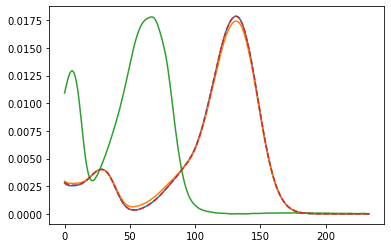

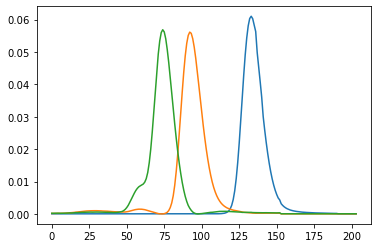

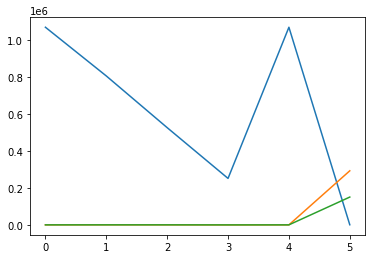

integral_array = [[1.06839105e+06 2.89573945e+02 3.80062684e+02]
 [8.05133046e+05 6.58499513e+02 4.51322066e+02]
 [5.25809858e+05 4.88191948e+02 4.86396070e+02]
 [2.51429382e+05 8.36737972e+01 2.29651853e+02]
 [1.06839105e+06 2.89573945e+02 3.80062684e+02]
 [9.22325269e+02 2.92523852e+05 1.50600325e+05]]
objective_val_non_comp = 3737.0085059915727
objective_val_comp = 3719154.381255877
objective_total_sum = 4166937.8928507874
impure_peak_sum = 444046.50308891846
----- new PARAFAC decomposition with iteration offset -49 -----
new data tensor with boundaries (1413, 1615) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is

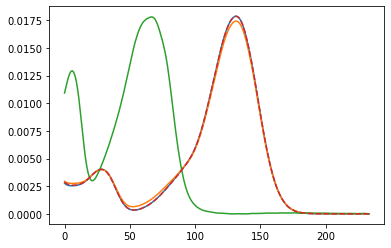

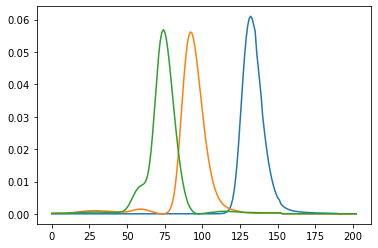

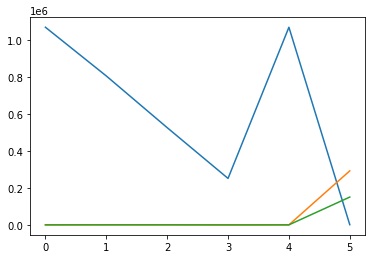

integral_array = [[1.06836762e+06 2.84452838e+02 3.79763139e+02]
 [8.05115256e+05 6.80507425e+02 4.51954982e+02]
 [5.25798407e+05 4.83216531e+02 4.86213863e+02]
 [2.51424006e+05 6.58029833e+01 2.28906125e+02]
 [1.06836762e+06 2.84452838e+02 3.79763139e+02]
 [1.21329265e+03 2.92217937e+05 1.50599914e+05]]
objective_val_non_comp = 3725.033863940985
objective_val_comp = 3719072.9042395772
objective_total_sum = 4166829.081857091
impure_peak_sum = 444031.1437535724
----- new PARAFAC decomposition with iteration offset -48 -----
new data tensor with boundaries (1413, 1614) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

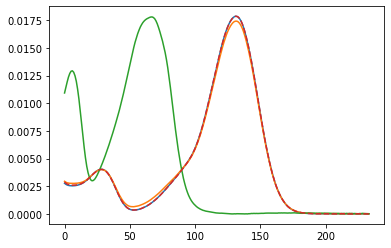

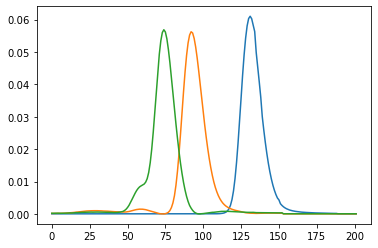

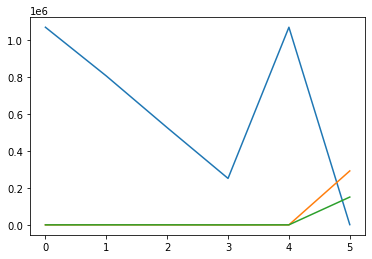

integral_array = [[1.06834414e+06 2.79490261e+02 3.79563865e+02]
 [8.05097376e+05 7.04313339e+02 4.52345430e+02]
 [5.25786914e+05 4.76045161e+02 4.85812657e+02]
 [2.51418627e+05 4.63609075e+01 2.28526763e+02]
 [1.06834414e+06 2.79490261e+02 3.79563865e+02]
 [1.49698923e+03 2.91919322e+05 1.50599473e+05]]
objective_val_non_comp = 3711.512510549155
objective_val_comp = 3718991.206419098
objective_total_sum = 4166718.5026619215
impure_peak_sum = 444015.7837322742
----- new PARAFAC decomposition with iteration offset -47 -----
new data tensor with boundaries (1413, 1613) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

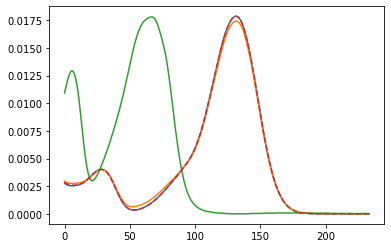

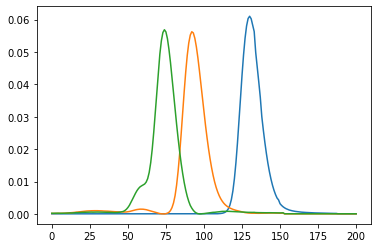

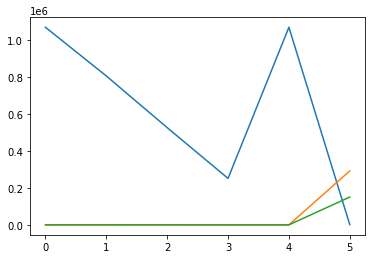

integral_array = [[1.06832040e+06 2.74320891e+02 3.79452333e+02]
 [8.05078766e+05 7.32201617e+02 4.52315404e+02]
 [5.25774982e+05 4.67486749e+02 4.85195460e+02]
 [2.51413243e+05 2.38760605e+01 2.28227380e+02]
 [1.06832040e+06 2.74320891e+02 3.79452333e+02]
 [1.53308320e+03 2.91875061e+05 1.50593544e+05]]
objective_val_non_comp = 3696.8491198804486
objective_val_comp = 3718907.7918993495
objective_total_sum = 4166606.329911432
impure_peak_sum = 444001.688892202
----- new PARAFAC decomposition with iteration offset -46 -----
new data tensor with boundaries (1413, 1612) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

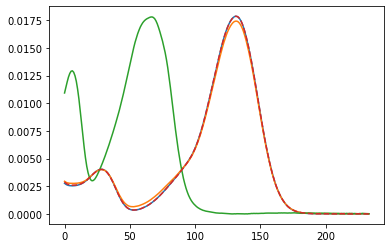

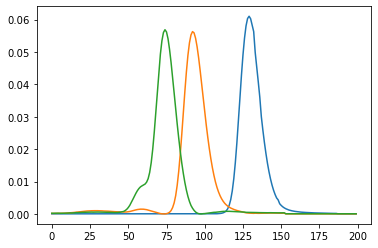

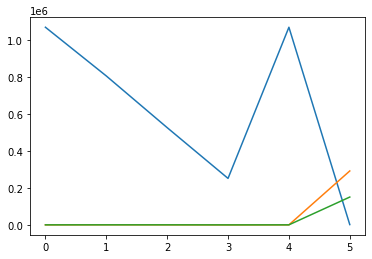

integral_array = [[1.06829659e+06 2.67073082e+02 3.79096304e+02]
 [8.05060188e+05 7.67104396e+02 4.52657004e+02]
 [5.25763149e+05 4.58417794e+02 4.84881854e+02]
 [2.51407861e+05 0.00000000e+00 2.28152376e+02]
 [1.06829659e+06 2.67073082e+02 3.79096304e+02]
 [1.72124371e+03 2.91675031e+05 1.50590960e+05]]
objective_val_non_comp = 3683.552194224608
objective_val_comp = 3718824.3748349566
objective_total_sum = 4166495.1619425234
impure_peak_sum = 443987.23491334217
----- new PARAFAC decomposition with iteration offset -45 -----
new data tensor with boundaries (1413, 1611) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is

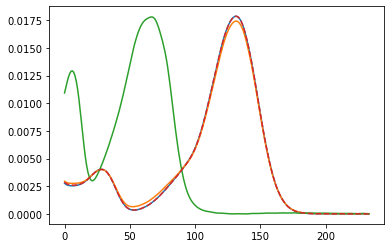

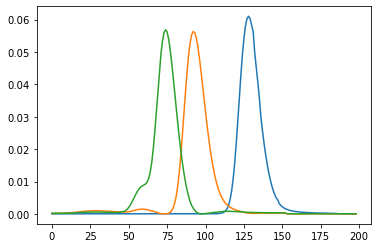

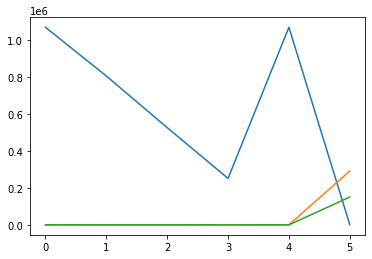

integral_array = [[1.06826963e+06 2.61594432e+02 3.78906384e+02]
 [8.05039138e+05 8.09329999e+02 4.52550893e+02]
 [5.25749793e+05 4.47854455e+02 4.84439545e+02]
 [2.51401529e+05 0.00000000e+00 2.27666222e+02]
 [1.06826963e+06 2.61594432e+02 3.78906384e+02]
 [1.95188353e+03 2.91431503e+05 1.50589047e+05]]
objective_val_non_comp = 3702.8427477307773
objective_val_comp = 3718729.716673227
objective_total_sum = 4166404.9938263926
impure_peak_sum = 443972.434405435
----- new PARAFAC decomposition with iteration offset -44 -----
new data tensor with boundaries (1413, 1610) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

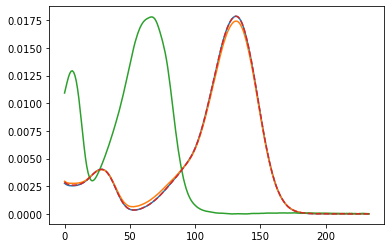

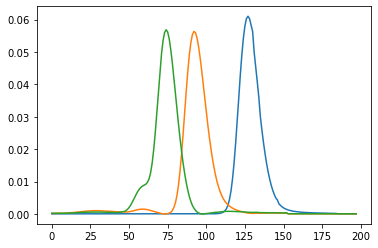

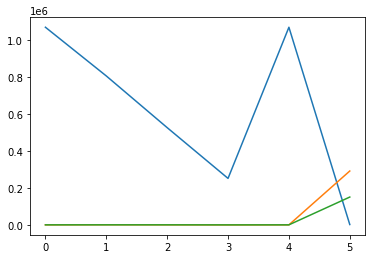

integral_array = [[1.06824187e+06 2.55734488e+02 3.78787679e+02]
 [8.05016893e+05 8.59466270e+02 4.51899782e+02]
 [5.25735863e+05 4.34327277e+02 4.83984543e+02]
 [2.51395053e+05 0.00000000e+00 2.27509611e+02]
 [1.06824187e+06 2.55734488e+02 3.78787679e+02]
 [2.02722400e+03 2.91347792e+05 1.50583561e+05]]
objective_val_non_comp = 3726.2318169477985
objective_val_comp = 3718631.556860367
objective_total_sum = 4166316.366152635
impure_peak_sum = 443958.57747532043
----- new PARAFAC decomposition with iteration offset -43 -----
new data tensor with boundaries (1413, 1609) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

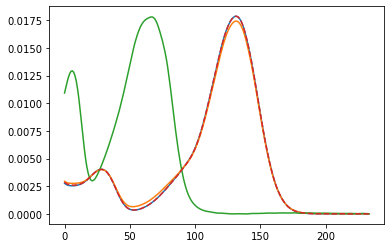

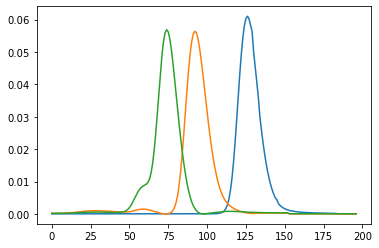

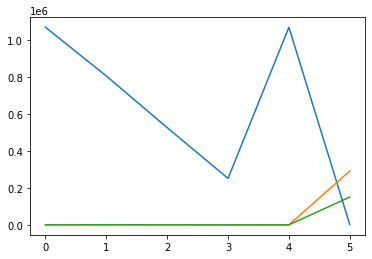

integral_array = [[1.06821404e+06 2.48365643e+02 3.78690849e+02]
 [8.04994770e+05 9.19041605e+02 4.50776738e+02]
 [5.25722136e+05 4.16624148e+02 4.83690355e+02]
 [2.51388521e+05 0.00000000e+00 2.26936445e+02]
 [1.06821404e+06 2.48365643e+02 3.78690849e+02]
 [2.34155798e+03 2.91018845e+05 1.50583405e+05]]
objective_val_non_comp = 3751.182275722861
objective_val_comp = 3718533.5108487727
objective_total_sum = 4166228.5011636093
impure_peak_sum = 443943.8080391134
----- new PARAFAC decomposition with iteration offset -42 -----
new data tensor with boundaries (1413, 1608) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

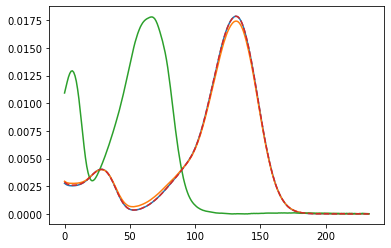

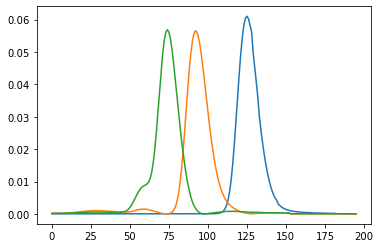

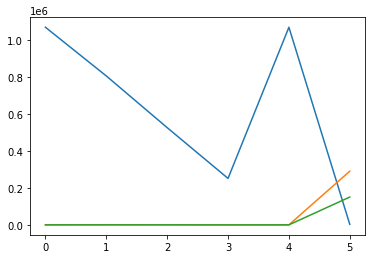

integral_array = [[1.06818602e+06 2.38562440e+02 3.78491409e+02]
 [8.04973097e+05 9.91029962e+02 4.49440757e+02]
 [5.25708661e+05 3.93936870e+02 4.83739433e+02]
 [2.51381880e+05 0.00000000e+00 2.26670086e+02]
 [1.06818602e+06 2.38562440e+02 3.78491409e+02]
 [3.03640401e+03 2.90299791e+05 1.50591330e+05]]
objective_val_non_comp = 3778.924805637168
objective_val_comp = 3718435.68713341
objective_total_sum = 4166142.1372368303
impure_peak_sum = 443927.52529778366
----- new PARAFAC decomposition with iteration offset -41 -----
new data tensor with boundaries (1413, 1607) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

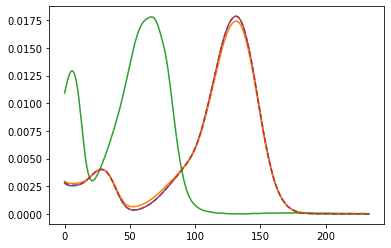

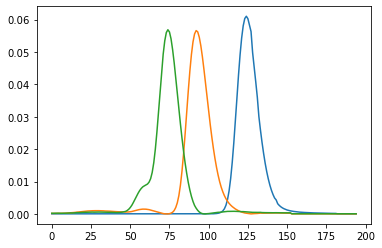

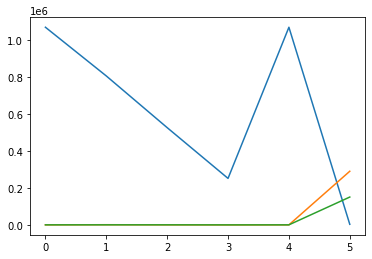

integral_array = [[1.06815743e+06 2.27578865e+02 3.78464821e+02]
 [8.04949262e+05 1.07820987e+03 4.47090889e+02]
 [5.25694510e+05 3.63821133e+02 4.83793716e+02]
 [2.51375209e+05 0.00000000e+00 2.26560200e+02]
 [1.06815743e+06 2.27578865e+02 3.78464821e+02]
 [3.29761956e+03 2.90027280e+05 1.50588798e+05]]
objective_val_non_comp = 3811.5631853175
objective_val_comp = 3718333.8499880857
objective_total_sum = 4166059.110469169
impure_peak_sum = 443913.6972957662
----- new PARAFAC decomposition with iteration offset -40 -----
new data tensor with boundaries (1413, 1606) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_com

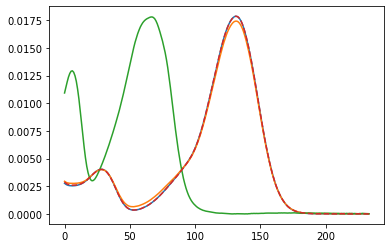

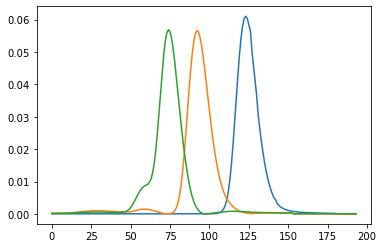

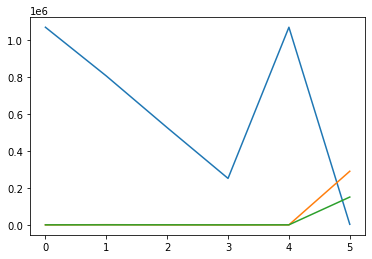

integral_array = [[1.06812589e+06 2.17251257e+02 3.78587181e+02]
 [8.04921256e+05 1.18601174e+03 4.43605611e+02]
 [5.25678797e+05 3.25061588e+02 4.83908024e+02]
 [2.51367919e+05 0.00000000e+00 2.26759719e+02]
 [1.06812589e+06 2.17251257e+02 3.78587181e+02]
 [3.27039526e+03 2.90052330e+05 1.50579016e+05]]
objective_val_non_comp = 3857.023557795973
objective_val_comp = 3718219.7585728075
objective_total_sum = 4165978.5239504967
impure_peak_sum = 443901.74181989307
----- new PARAFAC decomposition with iteration offset -39 -----
new data tensor with boundaries (1413, 1605) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is

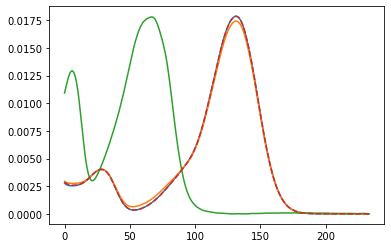

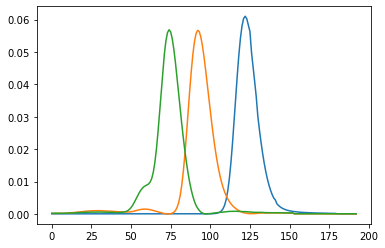

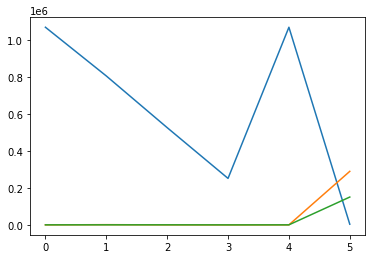

integral_array = [[1.06809144e+06 2.06124707e+02 3.78564070e+02]
 [8.04891601e+05 1.31839269e+03 4.39729346e+02]
 [5.25662251e+05 2.76038410e+02 4.84707711e+02]
 [2.51359872e+05 0.00000000e+00 2.26967792e+02]
 [1.06809144e+06 2.06124707e+02 3.78564070e+02]
 [3.79932775e+03 2.89506562e+05 1.50581685e+05]]
objective_val_non_comp = 3915.2135029785354
objective_val_comp = 3718096.608637488
objective_total_sum = 4165899.397041826
impure_peak_sum = 443887.5749013601
----- new PARAFAC decomposition with iteration offset -38 -----
new data tensor with boundaries (1413, 1604) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

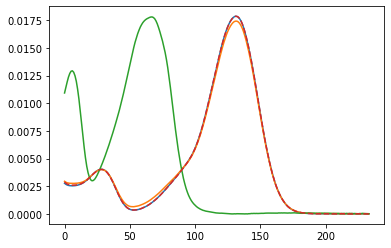

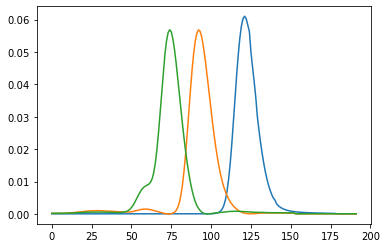

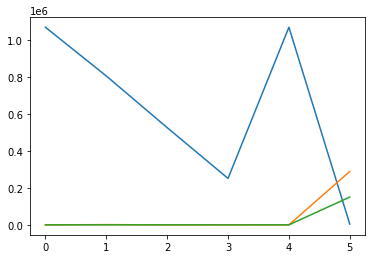

integral_array = [[1.06805395e+06 1.93924559e+02 3.78539851e+02]
 [8.04858355e+05 1.48123790e+03 4.35077185e+02]
 [5.25644513e+05 2.13915055e+02 4.86237549e+02]
 [2.51351125e+05 0.00000000e+00 2.27697552e+02]
 [1.06805395e+06 1.93924559e+02 3.78539851e+02]
 [4.42906423e+03 2.88857308e+05 1.50587188e+05]]
objective_val_non_comp = 3989.094062208946
objective_val_comp = 3717961.8832798847
objective_total_sum = 4165824.5375098847
impure_peak_sum = 443873.5601677913
----- new PARAFAC decomposition with iteration offset -37 -----
new data tensor with boundaries (1413, 1603) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

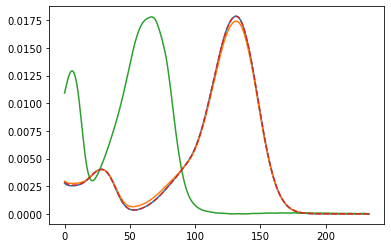

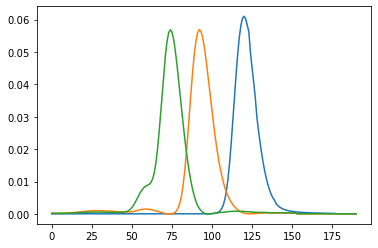

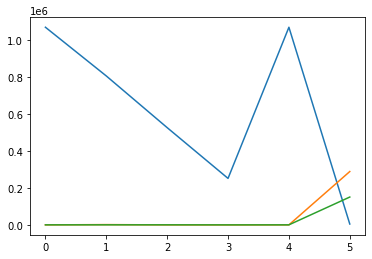

integral_array = [[1.06800408e+06 1.89982874e+02 3.78509756e+02]
 [8.04812163e+05 1.68777089e+03 4.29534631e+02]
 [5.25621129e+05 1.39168454e+02 4.88556231e+02]
 [2.51339592e+05 0.00000000e+00 2.28930344e+02]
 [1.06800408e+06 1.89982874e+02 3.78509756e+02]
 [4.83807747e+03 2.88435882e+05 1.50586930e+05]]
objective_val_non_comp = 4110.9458099180765
objective_val_comp = 3717781.042720139
objective_total_sum = 4165752.878567365
impure_peak_sum = 443860.8900373077
----- new PARAFAC decomposition with iteration offset -36 -----
new data tensor with boundaries (1413, 1602) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

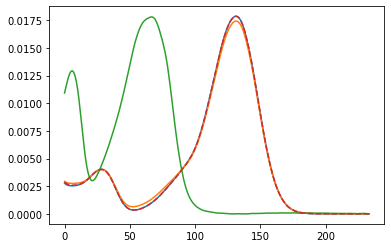

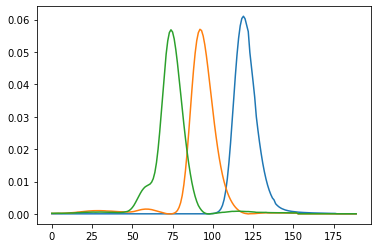

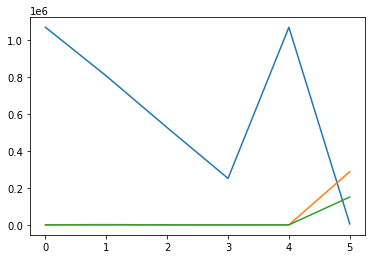

integral_array = [[1.06795563e+06 1.80502385e+02 3.78747229e+02]
 [8.04763561e+05 1.93258187e+03 4.23140362e+02]
 [5.25599440e+05 4.06785816e+01 4.91962393e+02]
 [2.51328416e+05 0.00000000e+00 2.30366707e+02]
 [1.06795563e+06 1.80502385e+02 3.78747229e+02]
 [5.33592327e+03 2.87914434e+05 1.50597467e+05]]
objective_val_non_comp = 4237.22914659914
objective_val_comp = 3717602.6798368124
objective_total_sum = 4165687.7332817614
impure_peak_sum = 443847.82429834985
----- new PARAFAC decomposition with iteration offset -35 -----
new data tensor with boundaries (1413, 1601) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

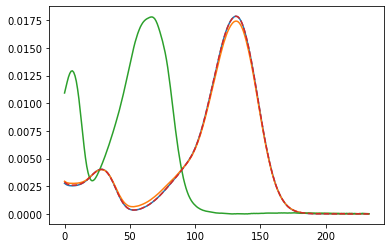

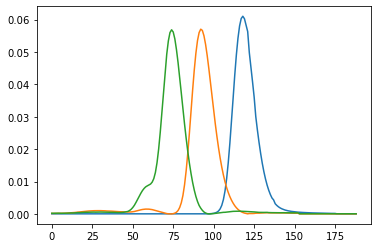

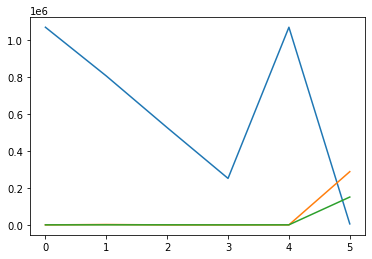

integral_array = [[1.06788069e+06 1.88327765e+02 3.78859850e+02]
 [8.04686966e+05 2.24761663e+03 4.16166732e+02]
 [5.25564239e+05 0.00000000e+00 4.95471016e+02]
 [2.51311276e+05 0.00000000e+00 2.32134144e+02]
 [1.06788069e+06 1.88327765e+02 3.78859850e+02]
 [5.54307659e+03 2.87718052e+05 1.50581500e+05]]
objective_val_non_comp = 4525.763757114946
objective_val_comp = 3717323.862114607
objective_total_sum = 4165692.25419241
impure_peak_sum = 443842.6283206884
----- new PARAFAC decomposition with iteration offset -34 -----
new data tensor with boundaries (1413, 1600) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_com

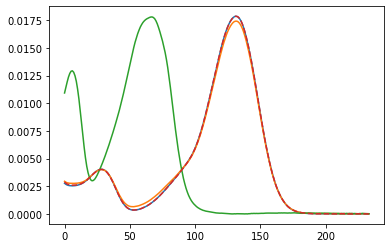

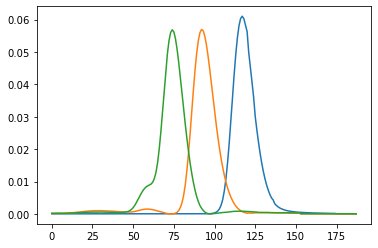

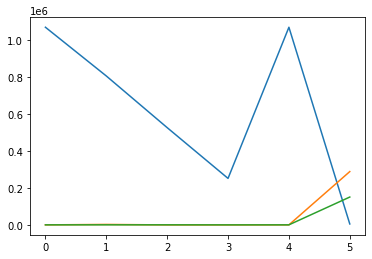

integral_array = [[1.06778771e+06 2.08285891e+02 3.79075379e+02]
 [8.04582751e+05 2.63457269e+03 4.08183002e+02]
 [5.25519810e+05 0.00000000e+00 4.99165536e+02]
 [2.51290283e+05 0.00000000e+00 2.34649942e+02]
 [1.06778771e+06 2.08285891e+02 3.79075379e+02]
 [5.18922586e+03 2.88104536e+05 1.50548490e+05]]
objective_val_non_comp = 4951.29370625585
objective_val_comp = 3716968.2686405
objective_total_sum = 4165761.814680116
impure_peak_sum = 443842.2523333598
----- new PARAFAC decomposition with iteration offset -33 -----
new data tensor with boundaries (1413, 1599) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_compo

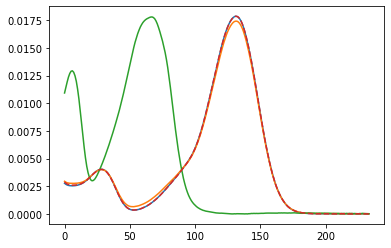

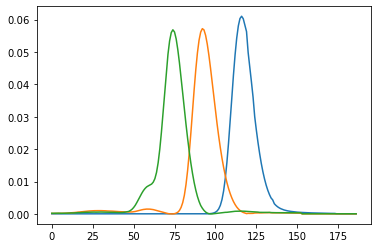

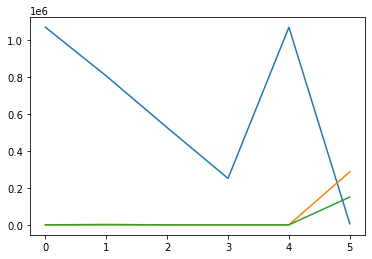

integral_array = [[1.06765781e+06 2.63512316e+02 3.79336750e+02]
 [8.04452005e+05 3.09934836e+03 3.99454512e+02]
 [5.25457815e+05 0.00000000e+00 5.04311081e+02]
 [2.51261023e+05 0.00000000e+00 2.38023747e+02]
 [1.06765781e+06 2.63512316e+02 3.79336750e+02]
 [6.42597648e+03 2.86849890e+05 1.50558377e+05]]
objective_val_non_comp = 5526.835833203156
objective_val_comp = 3716486.4628715585
objective_total_sum = 4165847.542402092
impure_peak_sum = 443834.2436973298
----- new PARAFAC decomposition with iteration offset -32 -----
new data tensor with boundaries (1413, 1598) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

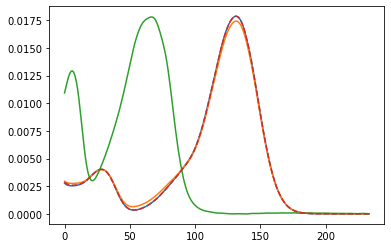

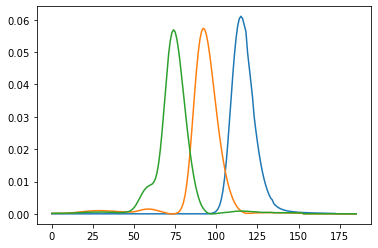

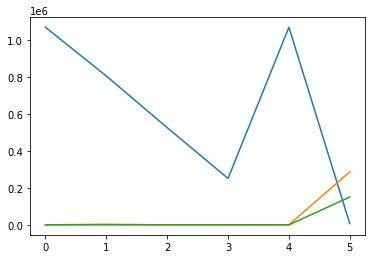

integral_array = [[1.06750413e+06 3.40285946e+02 3.79900806e+02]
 [8.04280728e+05 3.65677867e+03 3.90067742e+02]
 [5.25385750e+05 0.00000000e+00 5.10818479e+02]
 [2.51227114e+05 0.00000000e+00 2.41754687e+02]
 [1.06750413e+06 3.40285946e+02 3.79900806e+02]
 [7.02141597e+03 2.86257084e+05 1.50552496e+05]]
objective_val_non_comp = 6239.793083942741
objective_val_comp = 3715901.85956408
objective_total_sum = 4165972.6488538035
impure_peak_sum = 443830.99620578054
----- new PARAFAC decomposition with iteration offset -31 -----
new data tensor with boundaries (1413, 1597) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

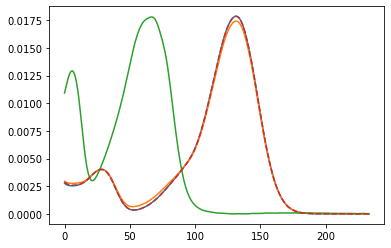

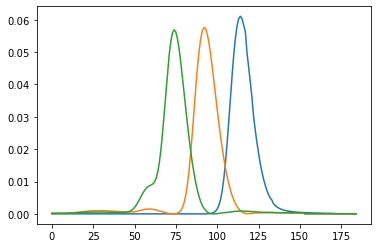

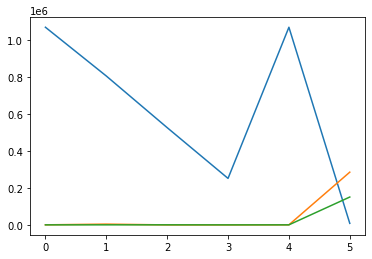

integral_array = [[1.06732355e+06 4.44486968e+02 3.80477901e+02]
 [8.04076280e+05 4.30206486e+03 3.80202564e+02]
 [5.25302109e+05 0.00000000e+00 5.19104556e+02]
 [2.51187899e+05 0.00000000e+00 2.46614613e+02]
 [1.06732355e+06 4.44486968e+02 3.80477901e+02]
 [8.41318259e+03 2.84858873e+05 1.50553402e+05]]
objective_val_non_comp = 7097.91632901284
objective_val_comp = 3715213.3787541674
objective_total_sum = 4166136.7525698594
impure_peak_sum = 443825.4574866791
----- new PARAFAC decomposition with iteration offset -30 -----
new data tensor with boundaries (1413, 1596) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

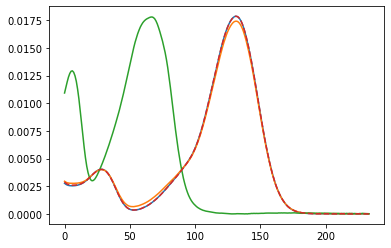

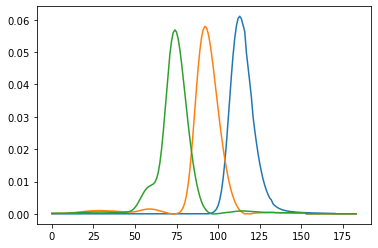

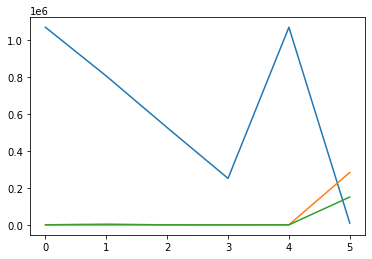

integral_array = [[1.06707236e+06 6.26057055e+02 3.81216335e+02]
 [8.03792171e+05 5.07915795e+03 3.69518592e+02]
 [5.25188378e+05 0.00000000e+00 5.29533762e+02]
 [2.51134685e+05 0.00000000e+00 2.52211147e+02]
 [1.06707236e+06 6.26057055e+02 3.81216335e+02]
 [9.96153839e+03 2.83292241e+05 1.50565049e+05]]
objective_val_non_comp = 8244.968226915207
objective_val_comp = 3714259.9432334974
objective_total_sum = 4166323.7398268
impure_peak_sum = 443818.82836638705
----- new PARAFAC decomposition with iteration offset -29 -----
new data tensor with boundaries (1413, 1595) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_co

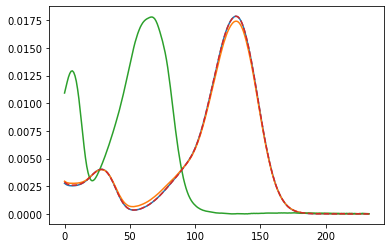

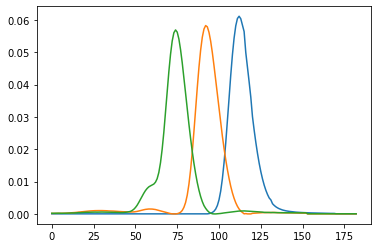

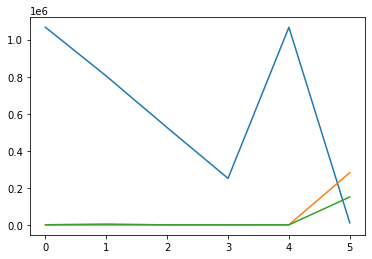

integral_array = [[1.06676110e+06 8.75123799e+02 3.82175689e+02]
 [8.03420182e+05 5.99042576e+03 3.58959263e+02]
 [5.25051982e+05 0.00000000e+00 5.42468640e+02]
 [2.51071119e+05 0.00000000e+00 2.58850848e+02]
 [1.06676110e+06 8.75123799e+02 3.82175689e+02]
 [1.13170113e+04 2.81913610e+05 1.50582155e+05]]
objective_val_non_comp = 9665.303492275956
objective_val_comp = 3713065.480834651
objective_total_sum = 4166543.560417825
impure_peak_sum = 443812.77609089826
----- new PARAFAC decomposition with iteration offset -28 -----
new data tensor with boundaries (1413, 1594) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

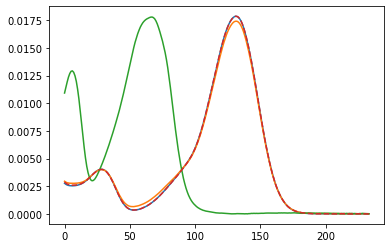

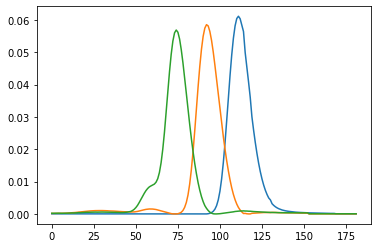

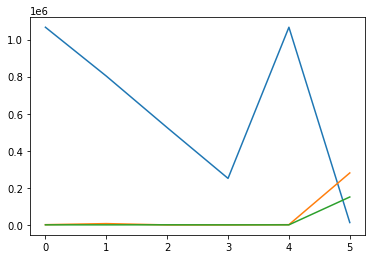

integral_array = [[1.06633588e+06 1.25579027e+03 3.82980193e+02]
 [8.02910781e+05 7.07857179e+03 3.48060490e+02]
 [5.24872657e+05 0.00000000e+00 5.58334490e+02]
 [2.50987787e+05 0.00000000e+00 2.67191820e+02]
 [1.06633588e+06 1.25579027e+03 3.82980193e+02]
 [1.27412310e+04 2.80434957e+05 1.50627973e+05]]
objective_val_non_comp = 11529.699522147812
objective_val_comp = 3711442.9890813096
objective_total_sum = 4166776.850071471
impure_peak_sum = 443804.16146801325
----- new PARAFAC decomposition with iteration offset -27 -----
new data tensor with boundaries (1413, 1593) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is

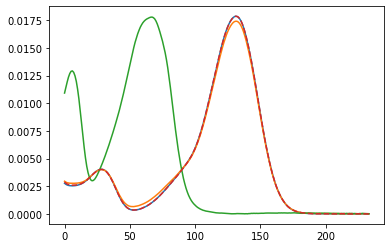

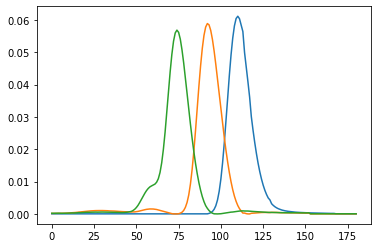

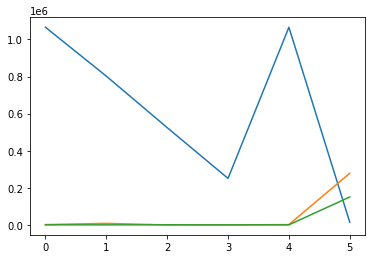

integral_array = [[1.06579736e+06 1.76746666e+03 3.83693995e+02]
 [8.02254404e+05 8.33769896e+03 3.37229154e+02]
 [5.24656117e+05 0.00000000e+00 5.77264066e+02]
 [2.50887608e+05 0.00000000e+00 2.77507568e+02]
 [1.06579736e+06 1.76746666e+03 3.83693995e+02]
 [1.44487564e+04 2.78682922e+05 1.50662760e+05]]
objective_val_non_comp = 13832.021053291082
objective_val_comp = 3709392.84304825
objective_total_sum = 4167019.302298557
impure_peak_sum = 443794.43819701567
----- new PARAFAC decomposition with iteration offset -26 -----
new data tensor with boundaries (1413, 1592) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

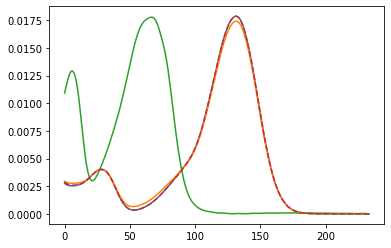

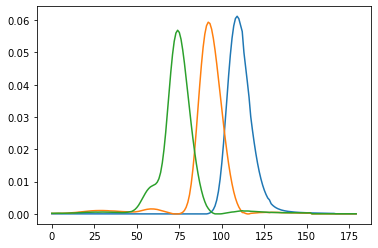

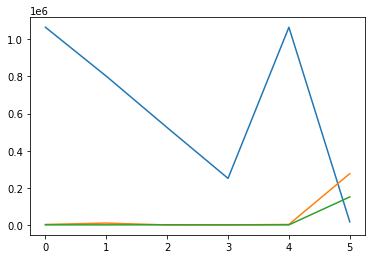

integral_array = [[1.06509827e+06 2.46662315e+03 3.84135966e+02]
 [8.01403886e+05 9.79865018e+03 3.26322035e+02]
 [5.24390232e+05 0.00000000e+00 5.99501014e+02]
 [2.50765143e+05 0.00000000e+00 2.89426642e+02]
 [1.06509827e+06 2.46662315e+03 3.84135966e+02]
 [1.65676964e+04 2.76505850e+05 1.50706320e+05]]
objective_val_non_comp = 16715.418103995813
objective_val_comp = 3706755.802450566
objective_total_sum = 4167251.087589594
impure_peak_sum = 443779.86703503225
----- new PARAFAC decomposition with iteration offset -25 -----
new data tensor with boundaries (1413, 1591) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

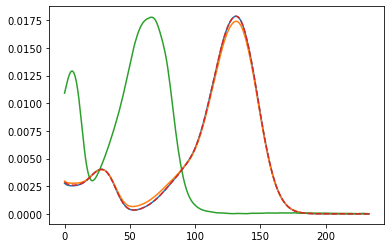

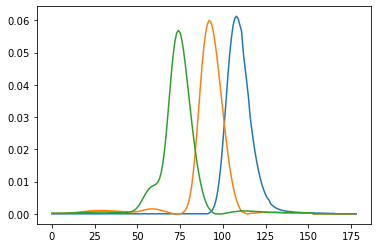

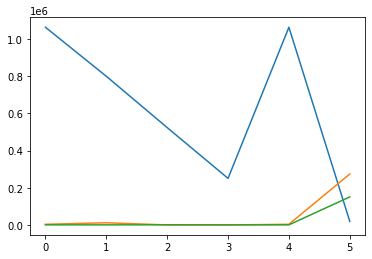

integral_array = [[1.06418203e+06 3.41188048e+03 3.84314759e+02]
 [8.00299288e+05 1.15008466e+04 3.16530424e+02]
 [5.24063645e+05 0.00000000e+00 6.26073296e+02]
 [2.50615393e+05 0.00000000e+00 3.03612981e+02]
 [1.06418203e+06 3.41188048e+03 3.84314759e+02]
 [1.90639621e+04 2.73930103e+05 1.50765516e+05]]
objective_val_non_comp = 20339.453736159237
objective_val_comp = 3703342.38918715
objective_total_sum = 4167441.4241215778
impure_peak_sum = 443759.58119826845
----- new PARAFAC decomposition with iteration offset -24 -----
new data tensor with boundaries (1413, 1590) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

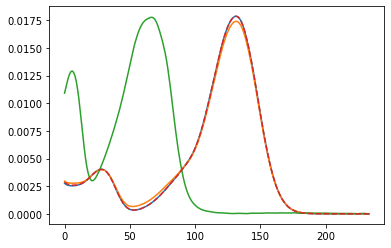

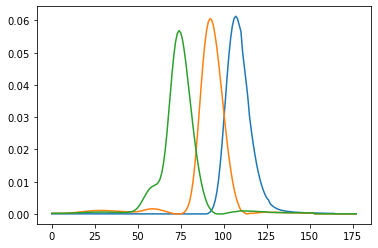

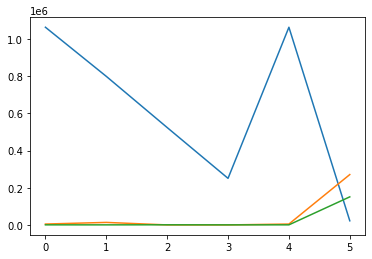

integral_array = [[1.06295945e+06 4.70010340e+03 3.83803527e+02]
 [7.98863243e+05 1.34998291e+04 3.07361477e+02]
 [5.23657962e+05 0.00000000e+00 6.57351916e+02]
 [2.50430185e+05 0.00000000e+00 3.20079774e+02]
 [1.06295945e+06 4.70010340e+03 3.83803527e+02]
 [2.21239662e+04 2.70749805e+05 1.50856559e+05]]
objective_val_non_comp = 24952.436147229404
objective_val_comp = 3698870.29226355
objective_total_sum = 4167553.0582884834
impure_peak_sum = 443730.32987770444
----- new PARAFAC decomposition with iteration offset -23 -----
new data tensor with boundaries (1413, 1589) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

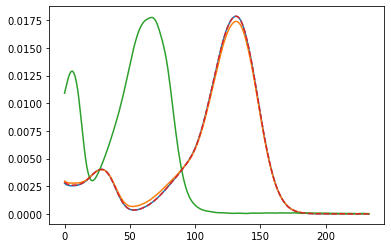

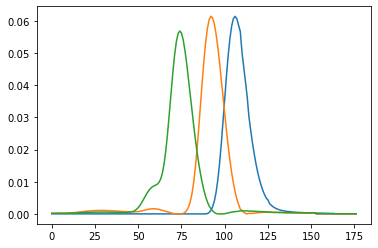

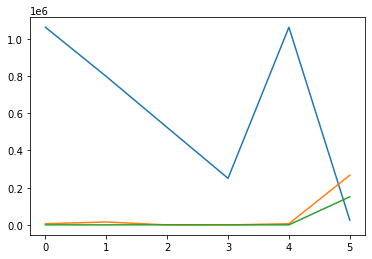

integral_array = [[1.06143558e+06 6.31456848e+03 3.83757164e+02]
 [7.97088526e+05 1.57697466e+04 3.00245721e+02]
 [5.23196315e+05 0.00000000e+00 6.93623629e+02]
 [2.50220748e+05 0.00000000e+00 3.38799481e+02]
 [1.06143558e+06 6.31456848e+03 3.83757164e+02]
 [2.58651620e+04 2.66868313e+05 1.50958010e+05]]
objective_val_non_comp = 30499.06673626874
objective_val_comp = 3693376.7551274085
objective_total_sum = 4167567.3071583686
impure_peak_sum = 443691.4852946914
----- new PARAFAC decomposition with iteration offset -22 -----
new data tensor with boundaries (1413, 1588) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

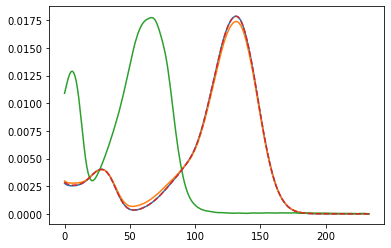

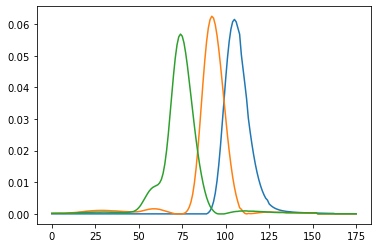

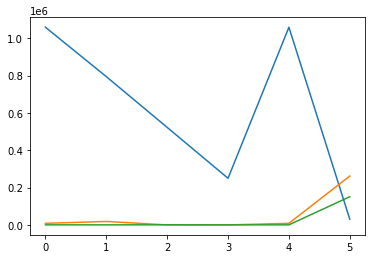

integral_array = [[1.05931905e+06 8.56043239e+03 3.81859918e+02]
 [7.94760183e+05 1.85135328e+04 2.94313946e+02]
 [5.22600168e+05 0.00000000e+00 7.36818235e+02]
 [2.49951139e+05 0.00000000e+00 3.60179364e+02]
 [1.05931905e+06 8.56043239e+03 3.81859918e+02]
 [3.06584286e+04 2.61916267e+05 1.51061529e+05]]
objective_val_non_comp = 37789.42898338813
objective_val_comp = 3685949.5955141815
objective_total_sum = 4167375.2493075067
impure_peak_sum = 443636.22480993747
----- new PARAFAC decomposition with iteration offset -21 -----
new data tensor with boundaries (1413, 1587) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is

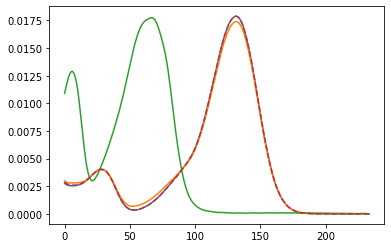

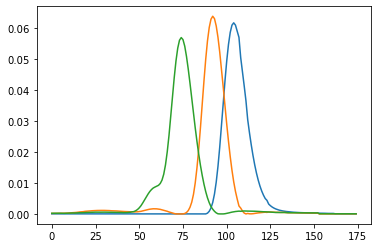

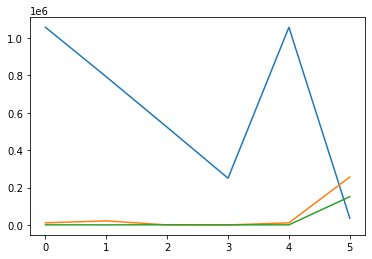

integral_array = [[1.05685154e+06 1.11504178e+04 3.82917635e+02]
 [7.92050126e+05 2.15062321e+04 2.93343054e+02]
 [5.21987436e+05 0.00000000e+00 7.85992859e+02]
 [2.49676359e+05 0.00000000e+00 3.83766720e+02]
 [1.05685154e+06 1.11504178e+04 3.82917635e+02]
 [3.64676662e+04 2.55930040e+05 1.51173767e+05]]
objective_val_non_comp = 46036.00557650533
objective_val_comp = 3677417.007435087
objective_total_sum = 4167024.4864850775
impure_peak_sum = 443571.47347348486
----- new PARAFAC decomposition with iteration offset -20 -----
new data tensor with boundaries (1413, 1586) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

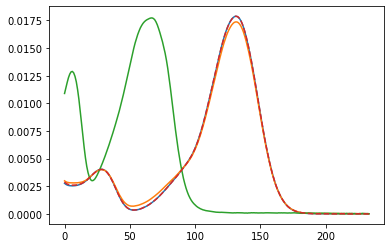

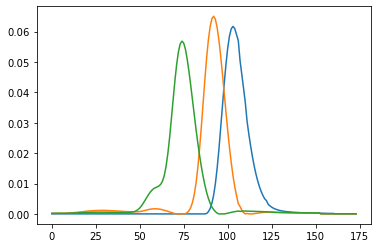

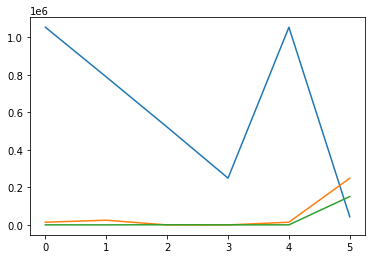

integral_array = [[1.05368385e+06 1.44649428e+04 3.83411767e+02]
 [7.88692631e+05 2.50269034e+04 2.94903616e+02]
 [5.21285701e+05 0.00000000e+00 8.42653762e+02]
 [2.49363473e+05 0.00000000e+00 4.10029624e+02]
 [1.05368385e+06 1.44649428e+04 3.83411767e+02]
 [4.33204760e+04 2.48911894e+05 1.51260528e+05]]
objective_val_non_comp = 56271.199615470476
objective_val_comp = 3666709.512420356
objective_total_sum = 4166473.6107703797
impure_peak_sum = 443492.89873455337
----- new PARAFAC decomposition with iteration offset -19 -----
new data tensor with boundaries (1413, 1585) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is

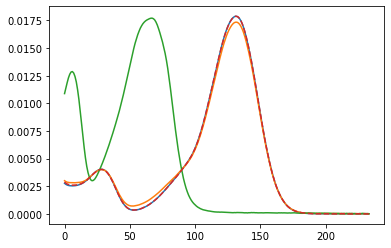

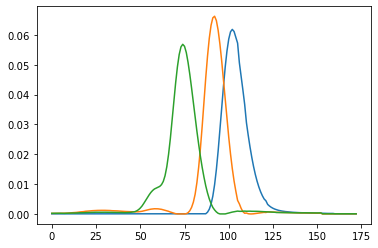

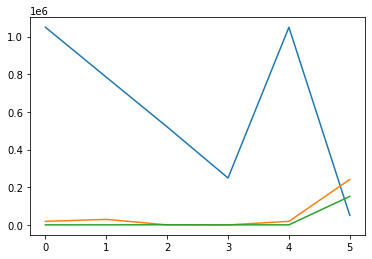

integral_array = [[1.04945533e+06 1.88725435e+04 3.83288558e+02]
 [7.84381323e+05 2.93808382e+04 3.01324506e+02]
 [5.20333734e+05 3.09456090e+02 9.04308338e+02]
 [2.48997813e+05 0.00000000e+00 4.39831741e+02]
 [1.04945533e+06 1.88725435e+04 3.83288558e+02]
 [5.06904436e+04 2.41325166e+05 1.51377974e+05]]
objective_val_non_comp = 69847.42303385674
objective_val_comp = 3652623.5255532544
objective_total_sum = 4165864.53223741
impure_peak_sum = 443393.5836502979
----- new PARAFAC decomposition with iteration offset -18 -----
new data tensor with boundaries (1413, 1584) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_co

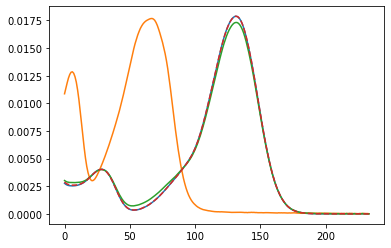

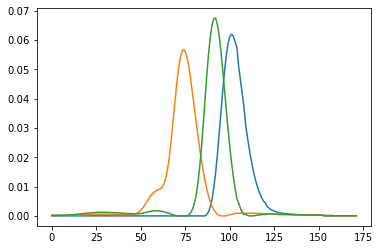

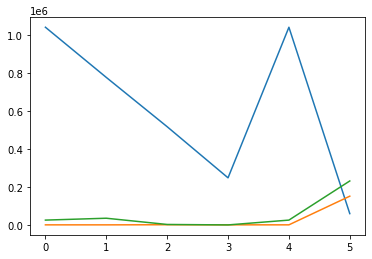

integral_array = [[1.04332280e+06 3.70274857e+02 2.54221096e+04]
 [7.78542720e+05 3.04061915e+02 3.52960075e+04]
 [5.18306163e+05 9.44834921e+02 2.38701142e+03]
 [2.48529923e+05 4.75272523e+02 0.00000000e+00]
 [1.04332280e+06 3.70274857e+02 2.54221096e+04]
 [5.96174533e+04 1.51639015e+05 2.31994136e+05]]
objective_val_non_comp = 90991.95726647951
objective_val_comp = 3632024.413938135
objective_total_sum = 4166266.9759435696
impure_peak_sum = 443250.60473895556
----- new PARAFAC decomposition with iteration offset -17 -----
new data tensor with boundaries (1413, 1583) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

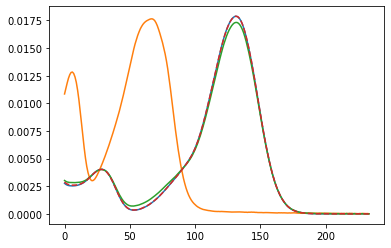

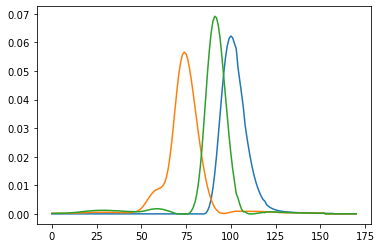

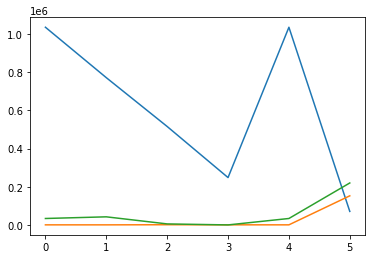

integral_array = [[1.03561838e+06 3.63036948e+02 3.36727766e+04]
 [7.71490442e+05 3.20505142e+02 4.23593330e+04]
 [5.15640101e+05 9.88275775e+02 5.26285320e+03]
 [2.48044520e+05 5.15696405e+02 0.00000000e+00]
 [1.03561838e+06 3.63036948e+02 3.36727766e+04]
 [7.07924865e+04 1.52419272e+05 2.19783883e+05]]
objective_val_non_comp = 117518.29064388628
objective_val_comp = 3606411.827043361
objective_total_sum = 4166925.759469729
impure_peak_sum = 442995.6417824818
----- new PARAFAC decomposition with iteration offset -16 -----
new data tensor with boundaries (1413, 1582) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

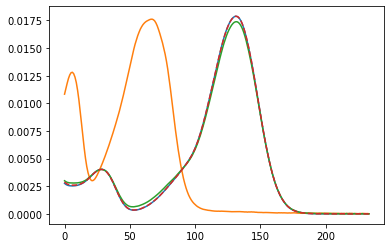

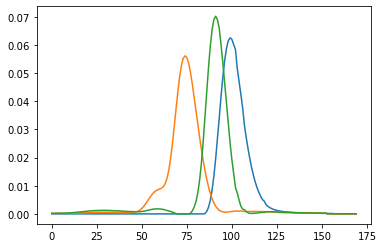

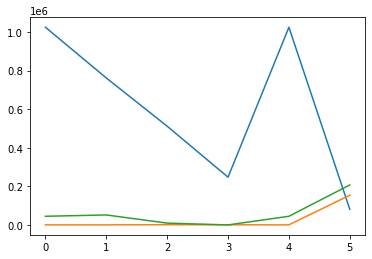

integral_array = [[1.02505337e+06 3.81918181e+02 4.48135676e+04]
 [7.62031359e+05 3.73629347e+02 5.16704401e+04]
 [5.11887432e+05 1.04088230e+03 9.36226243e+03]
 [2.47518934e+05 5.67774445e+02 0.00000000e+00]
 [1.02505337e+06 3.81918181e+02 4.48135676e+04]
 [8.11978677e+04 1.54024713e+05 2.07332501e+05]]
objective_val_non_comp = 153405.96020492303
objective_val_comp = 3571544.4636426643
objective_total_sum = 4167505.5050069457
impure_peak_sum = 442555.08115935954
----- new PARAFAC decomposition with iteration offset -15 -----
new data tensor with boundaries (1413, 1581) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, i

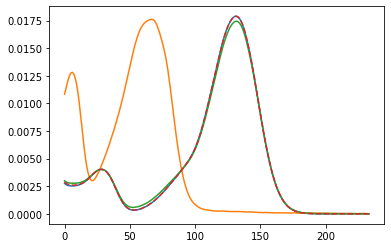

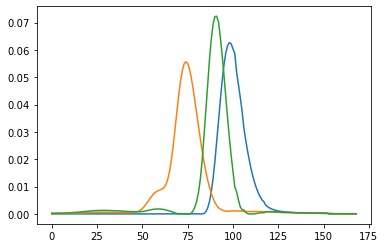

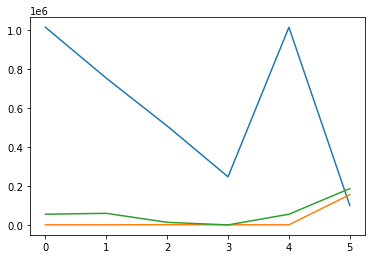

integral_array = [[1.01536411e+06 4.21689416e+02 5.49367439e+04]
 [7.53786077e+05 4.50050396e+02 5.95948573e+04]
 [5.08303346e+05 1.09615903e+03 1.33070966e+04]
 [2.47128501e+05 6.26477414e+02 0.00000000e+00]
 [1.01536411e+06 4.21689416e+02 5.49367439e+04]
 [1.00217561e+05 1.55272505e+05 1.86424760e+05]]
objective_val_non_comp = 185791.50747594106
objective_val_comp = 3539946.1525367573
objective_total_sum = 4167652.4863857487
impure_peak_sum = 441914.82637305034
----- new PARAFAC decomposition with iteration offset -14 -----
new data tensor with boundaries (1413, 1580) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, i

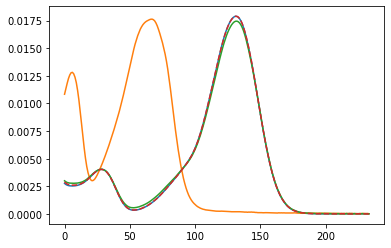

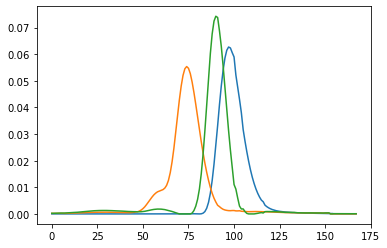

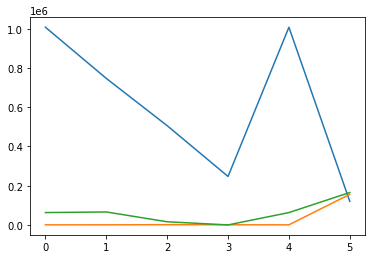

integral_array = [[1.00766302e+06 4.66503864e+02 6.29151609e+04]
 [7.46890263e+05 5.34374695e+02 6.60669094e+04]
 [5.05930653e+05 1.14678983e+03 1.59956899e+04]
 [2.47081903e+05 6.67803583e+02 0.00000000e+00]
 [1.00766302e+06 4.66503864e+02 6.29151609e+04]
 [1.19980514e+05 1.55978007e+05 1.65172682e+05]]
objective_val_non_comp = 211174.89696740743
objective_val_comp = 3515228.8666568696
objective_total_sum = 4167534.9657118977
impure_peak_sum = 441131.2020876207
----- new PARAFAC decomposition with iteration offset -13 -----
new data tensor with boundaries (1413, 1579) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is

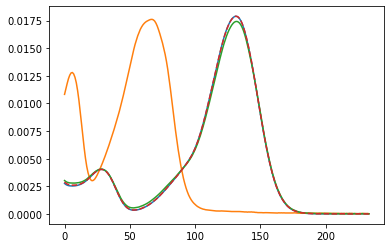

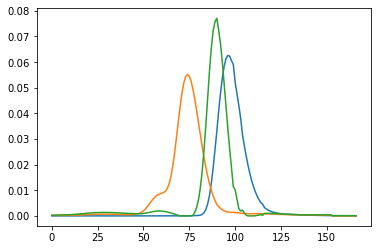

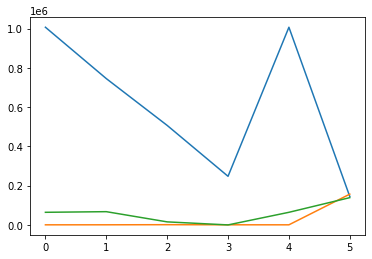

integral_array = [[1.00665240e+06 4.76807485e+02 6.42235302e+04]
 [7.45161511e+05 6.02683357e+02 6.74634762e+04]
 [5.06783619e+05 1.17218968e+03 1.54905981e+04]
 [2.47602431e+05 6.47258829e+02 0.00000000e+00]
 [1.00665240e+06 4.76807485e+02 6.42235302e+04]
 [1.44649310e+05 1.56750691e+05 1.38918332e+05]]
objective_val_non_comp = 214776.8816023736
objective_val_comp = 3512852.3715516925
objective_total_sum = 4167947.5861039483
impure_peak_sum = 440318.332949882
----- new PARAFAC decomposition with iteration offset -12 -----
new data tensor with boundaries (1413, 1578) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

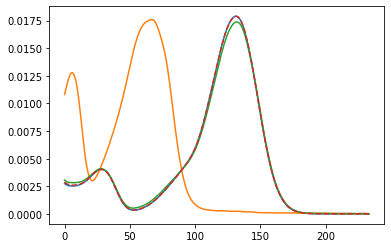

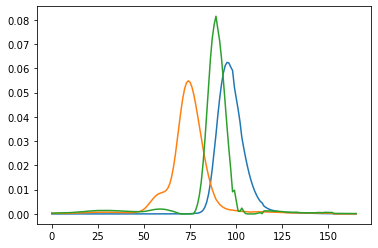

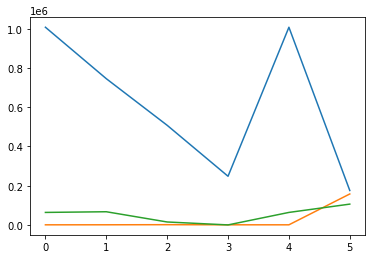

integral_array = [[1.00738227e+06 4.92166156e+02 6.36719284e+04]
 [7.45266202e+05 6.77278484e+02 6.71377848e+04]
 [5.07654836e+05 1.17690411e+03 1.49490743e+04]
 [2.47980391e+05 6.14172945e+02 0.00000000e+00]
 [1.00738227e+06 4.92166156e+02 6.36719284e+04]
 [1.75361015e+05 1.57718055e+05 1.06000289e+05]]
objective_val_non_comp = 212883.4038935633
objective_val_comp = 3515665.9622327876
objective_total_sum = 4167628.7245674464
impure_peak_sum = 439079.35844109586
----- new PARAFAC decomposition with iteration offset -11 -----
new data tensor with boundaries (1413, 1577) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is

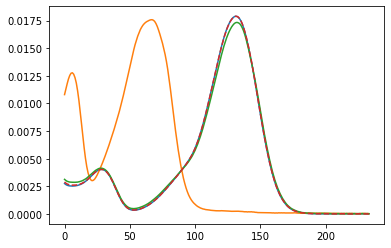

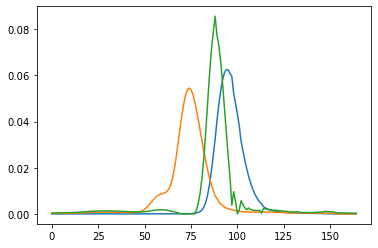

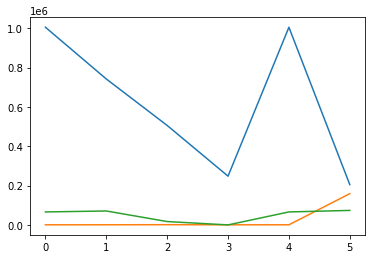

integral_array = [[1.00472559e+06 5.43460312e+02 6.59592803e+04]
 [7.41784383e+05 7.31566810e+02 7.08359933e+04]
 [5.05613422e+05 1.12417141e+03 1.71268227e+04]
 [2.47766648e+05 5.86751366e+02 0.00000000e+00]
 [1.00472559e+06 5.43460312e+02 6.59592803e+04]
 [2.04827309e+05 1.58758009e+05 7.37016457e+04]]
objective_val_non_comp = 223410.78667824675
objective_val_comp = 3504615.632071958
objective_total_sum = 4165313.382999136
impure_peak_sum = 437286.96424893115
----- new PARAFAC decomposition with iteration offset -10 -----
new data tensor with boundaries (1413, 1576) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

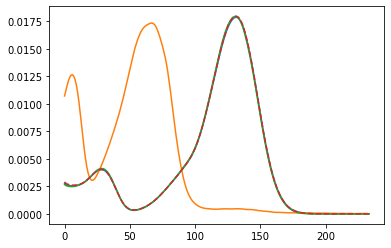

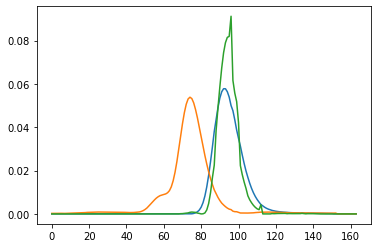

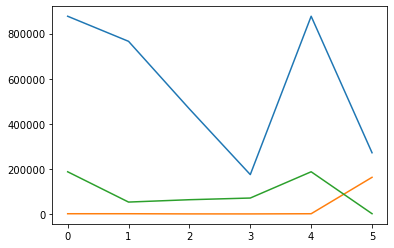

integral_array = [[8.76804727e+05 1.07625407e+03 1.87171976e+05]
 [7.65569188e+05 1.10859920e+03 5.28200115e+04]
 [4.65782857e+05 3.72562284e+02 6.32644016e+04]
 [1.74658137e+05 2.86477251e+02 7.07118949e+04]
 [8.76804727e+05 1.07625407e+03 1.87171976e+05]
 [2.71529342e+05 1.62597768e+05 1.24780143e+03]]
objective_val_non_comp = 565060.4065780411
objective_val_comp = 3159619.63530982
objective_total_sum = 4160054.9534687726
impure_peak_sum = 435374.91158091155
----- new PARAFAC decomposition with iteration offset -9 -----
new data tensor with boundaries (1413, 1575) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_co

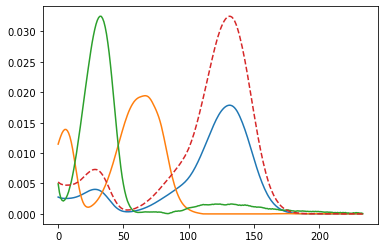

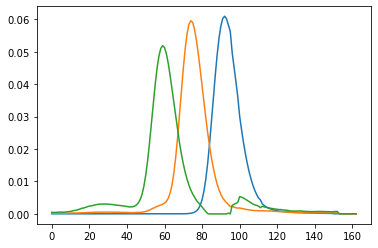

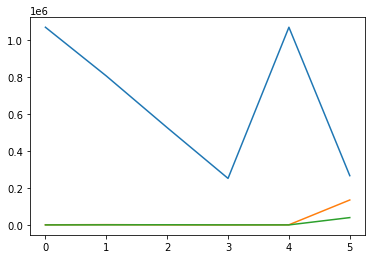

integral_array = [[1.06867113e+06 6.39403311e+02 0.00000000e+00]
 [8.05327760e+05 1.46068857e+03 3.73719513e+02]
 [5.25969409e+05 4.37159059e+02 6.93848413e+02]
 [2.51506816e+05 0.00000000e+00 1.78301938e+02]
 [1.06867113e+06 6.39403311e+02 0.00000000e+00]
 [2.66203326e+05 1.34768883e+05 3.95690530e+04]]
objective_val_non_comp = 4422.524110697686
objective_val_comp = 3720146.2414380643
objective_total_sum = 4165110.0278141857
impure_peak_sum = 440541.26226542384
----- new PARAFAC decomposition with iteration offset -8 -----
new data tensor with boundaries (1413, 1574) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

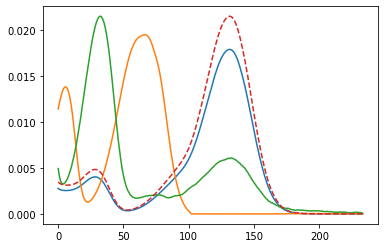

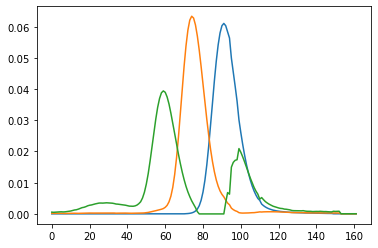

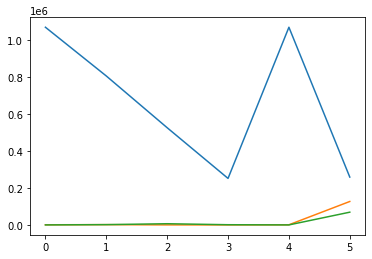

integral_array = [[1.06742635e+06 7.34488927e+02 0.00000000e+00]
 [8.04244339e+05 1.46208341e+03 1.55443569e+03]
 [5.24881926e+05 1.15787067e+02 6.40689885e+03]
 [2.51152432e+05 0.00000000e+00 1.05116386e+03]
 [1.06742635e+06 7.34488927e+02 0.00000000e+00]
 [2.58297745e+05 1.26540695e+05 6.87799802e+04]]
objective_val_non_comp = 12059.346725891573
objective_val_comp = 3715131.403049781
objective_total_sum = 4180809.1699034143
impure_peak_sum = 453618.4201277422
----- new PARAFAC decomposition with iteration offset -7 -----
new data tensor with boundaries (1413, 1573) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

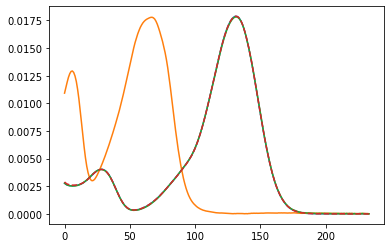

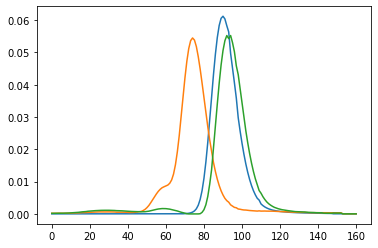

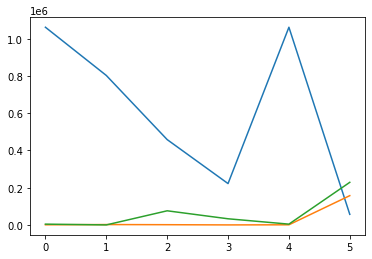

integral_array = [[1.06157640e+06 6.32682226e+02 4.20435708e+03]
 [8.02702776e+05 1.95073700e+03 0.00000000e+00]
 [4.58257130e+05 1.15695759e+03 7.58351420e+04]
 [2.22008383e+05 3.32336062e+01 3.29706972e+04]
 [1.06157640e+06 6.32682226e+02 4.20435708e+03]
 [5.68297925e+04 1.57196754e+05 2.28745061e+05]]
objective_val_non_comp = 121620.84597907336
objective_val_comp = 3606121.091637397
objective_total_sum = 4170513.5458027697
impure_peak_sum = 442771.60818629875
----- new PARAFAC decomposition with iteration offset -6 -----
new data tensor with boundaries (1413, 1572) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

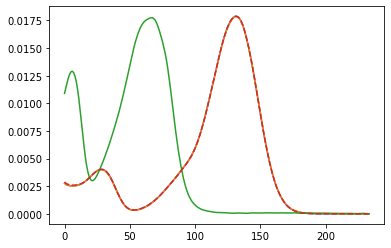

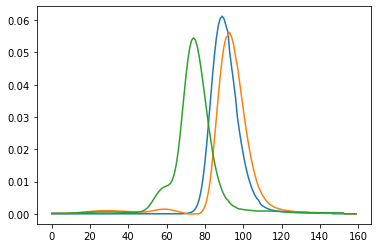

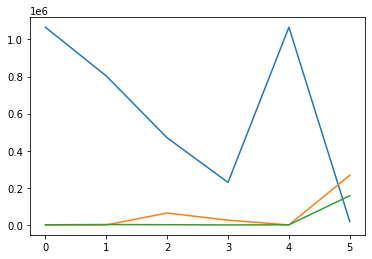

integral_array = [[1.06559885e+06 0.00000000e+00 6.31253348e+02]
 [8.02960648e+05 0.00000000e+00 2.14383360e+03]
 [4.69548543e+05 6.42326369e+04 1.12698712e+03]
 [2.28927972e+05 2.55860554e+04 0.00000000e+00]
 [1.06559885e+06 0.00000000e+00 6.31253348e+02]
 [1.78675378e+04 2.67818454e+05 1.57483119e+05]]
objective_val_non_comp = 94352.01976538537
objective_val_comp = 3632634.8589715473
objective_total_sum = 4170155.988908817
impure_peak_sum = 443169.11017188453
----- new PARAFAC decomposition with iteration offset -5 -----
new data tensor with boundaries (1413, 1571) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

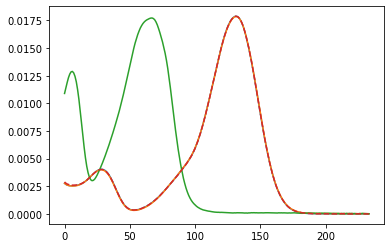

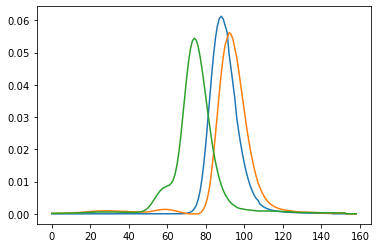

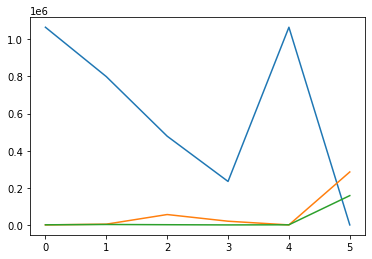

integral_array = [[1.06522438e+06 0.00000000e+00 6.33641100e+02]
 [7.99304699e+05 4.07716843e+03 2.36789326e+03]
 [4.78246939e+05 5.59339252e+04 1.07258701e+03]
 [2.34302476e+05 1.99421819e+04 0.00000000e+00]
 [1.06522438e+06 0.00000000e+00 6.33641100e+02]
 [0.00000000e+00 2.85426475e+05 1.57887520e+05]]
objective_val_non_comp = 84661.03802711995
objective_val_comp = 3642302.8692530626
objective_total_sum = 4170277.9019386023
impure_peak_sum = 443313.99465841963
----- new PARAFAC decomposition with iteration offset -4 -----
new data tensor with boundaries (1413, 1570) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

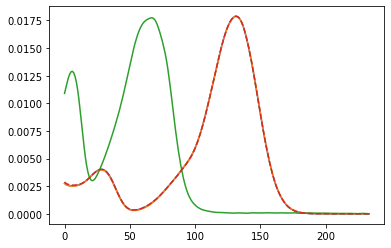

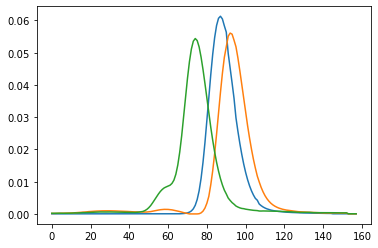

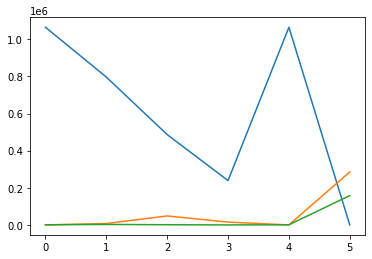

integral_array = [[1.06469738e+06 0.00000000e+00 6.56063051e+02]
 [7.96444346e+05 7.49333255e+03 2.58326438e+03]
 [4.86600524e+05 4.83582429e+04 9.88525258e+02]
 [2.38822268e+05 1.52072968e+04 0.00000000e+00]
 [1.06469738e+06 0.00000000e+00 6.56063051e+02]
 [0.00000000e+00 2.85436726e+05 1.57947321e+05]]
objective_val_non_comp = 75942.78800669983
objective_val_comp = 3651261.9049162166
objective_total_sum = 4170588.7403022307
impure_peak_sum = 443384.04737931513
----- new PARAFAC decomposition with iteration offset -3 -----
new data tensor with boundaries (1413, 1569) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

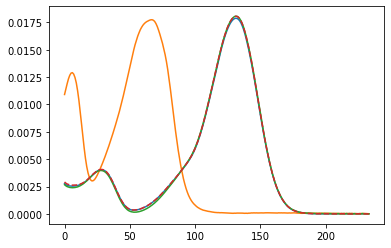

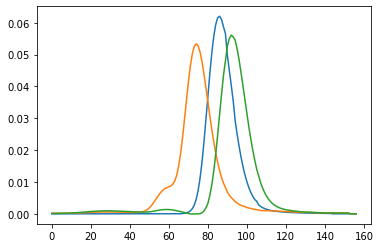

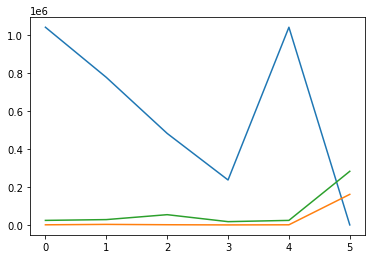

integral_array = [[1.04066168e+06 5.94586576e+02 2.38183647e+04]
 [7.76858456e+05 2.75971443e+03 2.79898100e+04]
 [4.81753076e+05 9.34124874e+02 5.39102521e+04]
 [2.36569315e+05 0.00000000e+00 1.71970428e+04]
 [1.04066168e+06 5.94586576e+02 2.38183647e+04]
 [0.00000000e+00 1.60880046e+05 2.82309302e+05]]
objective_val_non_comp = 151616.84674532703
objective_val_comp = 3576504.1971631143
objective_total_sum = 4171310.391870151
impure_peak_sum = 443189.3479617096
----- new PARAFAC decomposition with iteration offset -2 -----
new data tensor with boundaries (1413, 1568) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

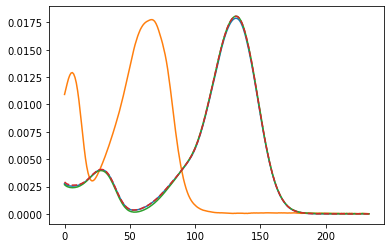

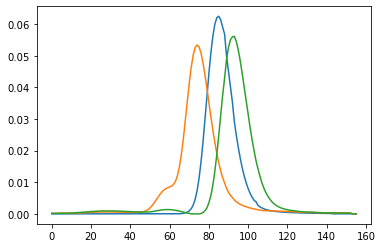

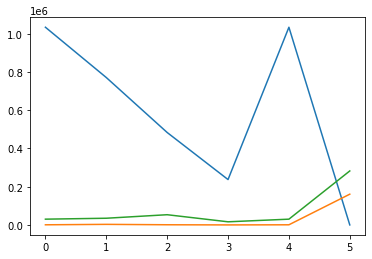

integral_array = [[1.03387049e+06 6.41533964e+02 3.00899511e+04]
 [7.70866010e+05 2.93382705e+03 3.49298733e+04]
 [4.83401578e+05 8.04862823e+02 5.33403731e+04]
 [2.37253986e+05 0.00000000e+00 1.62854400e+04]
 [1.03387049e+06 6.41533964e+02 3.00899511e+04]
 [0.00000000e+00 1.60753131e+05 2.82283700e+05]]
objective_val_non_comp = 169757.3464842683
objective_val_comp = 3559262.557330241
objective_total_sum = 4172056.7343934593
impure_peak_sum = 443036.8305789498
----- new PARAFAC decomposition with iteration offset -1 -----
new data tensor with boundaries (1413, 1567) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_co

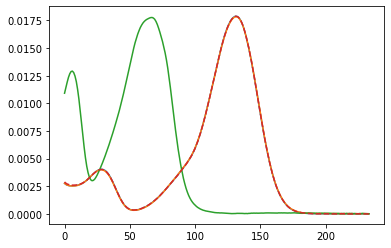

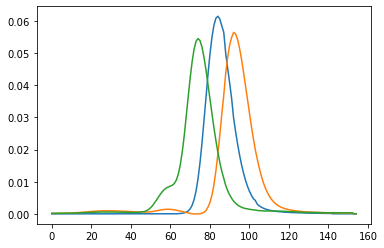

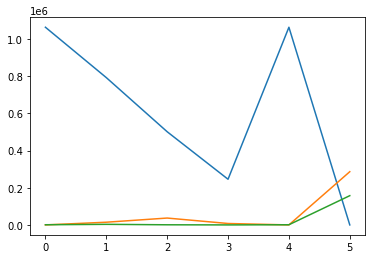

integral_array = [[1.06260469e+06 0.00000000e+00 9.07892210e+02]
 [7.91911565e+05 1.45099500e+04 3.13561528e+03]
 [5.00922198e+05 3.69037397e+04 6.74262621e+02]
 [2.45530528e+05 7.63501501e+03 0.00000000e+00]
 [1.06260469e+06 0.00000000e+00 9.07892210e+02]
 [0.00000000e+00 2.86066878e+05 1.57210328e+05]]
objective_val_non_comp = 64674.36696969817
objective_val_comp = 3663573.6650587595
objective_total_sum = 4171525.237407779
impure_peak_sum = 443277.20537932136
----- new PARAFAC decomposition with iteration offset 0 -----
new data tensor with boundaries (1413, 1566) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_co

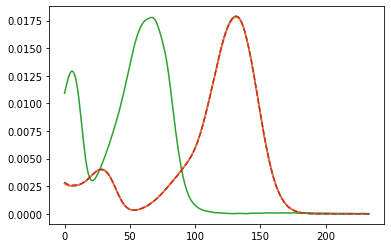

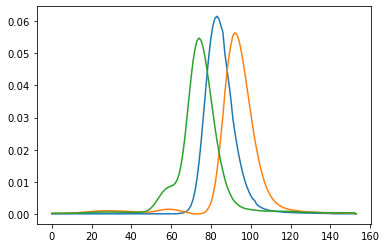

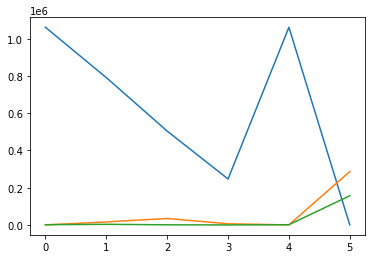

integral_array = [[1.06182875e+06 0.00000000e+00 1.08646808e+03]
 [7.91413392e+05 1.59814714e+04 3.25054530e+03]
 [5.04064722e+05 3.46044221e+04 5.73565070e+02]
 [2.46611158e+05 6.16671026e+03 0.00000000e+00]
 [1.06182875e+06 0.00000000e+00 1.08646808e+03]
 [0.00000000e+00 2.86596595e+05 1.56613134e+05]]
objective_val_non_comp = 62749.65032608913
objective_val_comp = 3665746.773754451
objective_total_sum = 4171706.152830199
impure_peak_sum = 443209.7287496588
----- new PARAFAC decomposition with iteration offset 1 -----
new data tensor with boundaries (1413, 1567) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_comp

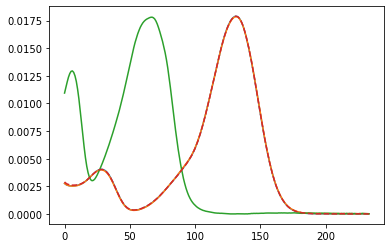

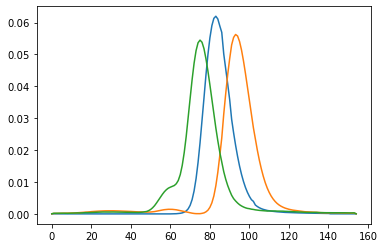

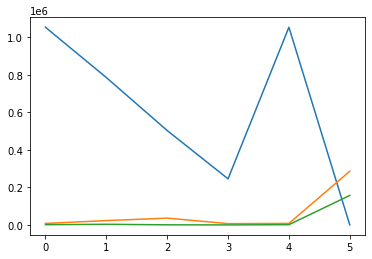

integral_array = [[1.05319058e+06 7.95081476e+03 1.31271742e+03]
 [7.85394288e+05 2.29454265e+04 3.31312969e+03]
 [5.02986879e+05 3.62578632e+04 5.17597923e+02]
 [2.45548518e+05 6.79276646e+03 0.00000000e+00]
 [1.05319058e+06 7.95081476e+03 1.31271742e+03]
 [0.00000000e+00 2.86076595e+05 1.57093559e+05]]
objective_val_non_comp = 88353.84808452308
objective_val_comp = 3640310.847539343
objective_total_sum = 4171834.849450792
impure_peak_sum = 443170.15382692625
----- new PARAFAC decomposition with iteration offset 2 -----
new data tensor with boundaries (1413, 1568) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_com

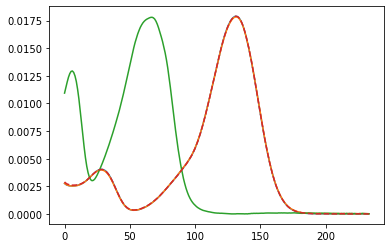

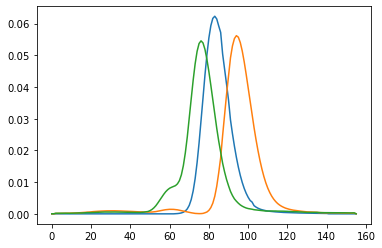

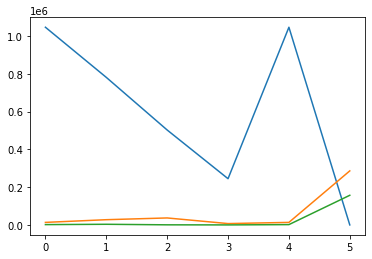

integral_array = [[1.04710387e+06 1.33930512e+04 1.62654311e+03]
 [7.81554998e+05 2.76287966e+04 3.36100580e+03]
 [5.02752983e+05 3.68954526e+04 4.91400865e+02]
 [2.44833405e+05 7.06843415e+03 0.00000000e+00]
 [1.04710387e+06 1.33930512e+04 1.62654311e+03]
 [0.00000000e+00 2.86223007e+05 1.56942991e+05]]
objective_val_non_comp = 105484.27873358894
objective_val_comp = 3623349.118872979
objective_total_sum = 4171999.3953278777
impure_peak_sum = 443165.99772130954
----- new PARAFAC decomposition with iteration offset 3 -----
new data tensor with boundaries (1413, 1569) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

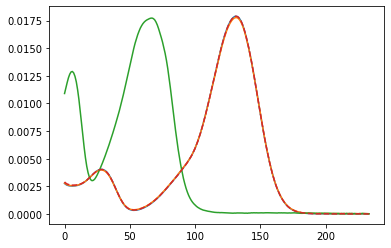

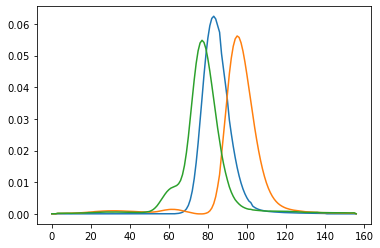

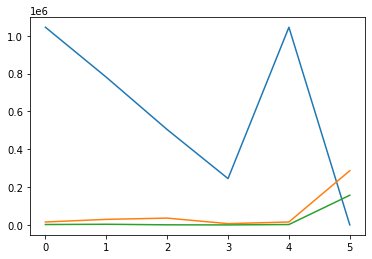

integral_array = [[1.04448025e+06 1.54047380e+04 2.05957217e+03]
 [7.80491876e+05 2.93146608e+04 3.44802622e+03]
 [5.03880862e+05 3.59013618e+04 5.25544626e+02]
 [2.44747409e+05 6.71696538e+03 0.00000000e+00]
 [1.04448025e+06 1.54047380e+04 2.05957217e+03]
 [0.00000000e+00 2.86511016e+05 1.56699733e+05]]
objective_val_non_comp = 110835.17917784146
objective_val_comp = 3618080.6506289467
objective_total_sum = 4172126.5786023745
impure_peak_sum = 443210.7487955862
----- new PARAFAC decomposition with iteration offset 4 -----
new data tensor with boundaries (1413, 1570) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

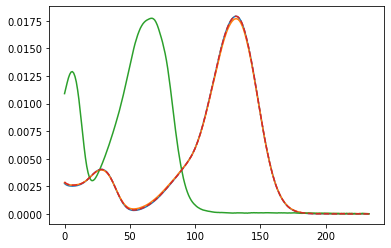

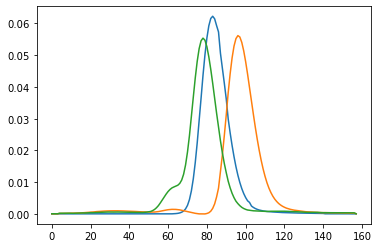

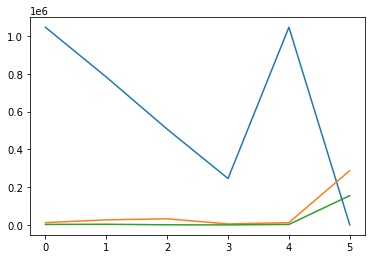

integral_array = [[1.04715458e+06 1.21145617e+04 2.61638602e+03]
 [7.83448666e+05 2.67447493e+04 3.49426435e+03]
 [5.07218296e+05 3.23967927e+04 6.62110674e+02]
 [2.45770332e+05 5.24331359e+03 0.00000000e+00]
 [1.04715458e+06 1.21145617e+04 2.61638602e+03]
 [0.00000000e+00 2.88021161e+05 1.55283970e+05]]
objective_val_non_comp = 98003.12614624304
objective_val_comp = 3630746.449522676
objective_total_sum = 4172054.7067380887
impure_peak_sum = 443305.13106916996
----- new PARAFAC decomposition with iteration offset 5 -----
new data tensor with boundaries (1413, 1571) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_co

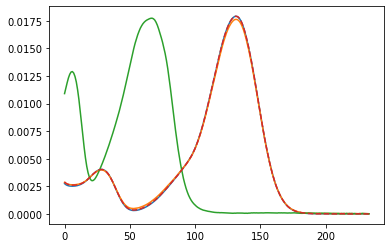

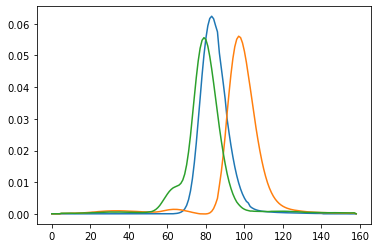

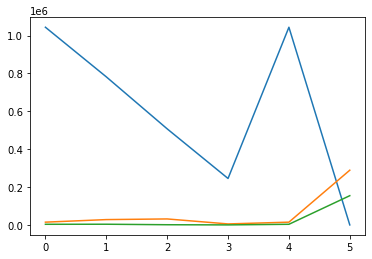

integral_array = [[1.04411343e+06 1.45788276e+04 3.34623188e+03]
 [7.82129930e+05 2.80985081e+04 3.62438686e+03]
 [5.07469532e+05 3.15533022e+04 9.60565272e+02]
 [2.45339325e+05 5.22592050e+03 6.93897477e+01]
 [1.04411343e+06 1.45788276e+04 3.34623188e+03]
 [0.00000000e+00 2.89009964e+05 1.54404119e+05]]
objective_val_non_comp = 105382.19156114275
objective_val_comp = 3623165.641278736
objective_total_sum = 4171961.916122216
impure_peak_sum = 443414.08328233776
----- new PARAFAC decomposition with iteration offset 6 -----
new data tensor with boundaries (1413, 1572) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_co

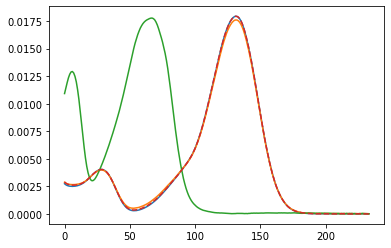

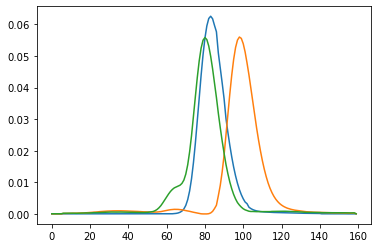

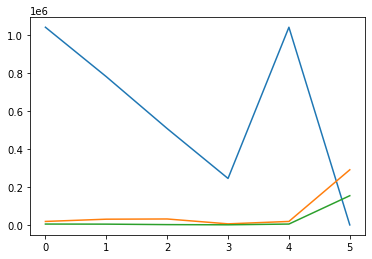

integral_array = [[1.03957558e+06 1.82923732e+04 4.53587536e+03]
 [7.79630491e+05 3.00774414e+04 4.08895403e+03]
 [5.06685798e+05 3.12459758e+04 1.56408508e+03]
 [2.44426060e+05 5.60888339e+03 5.65157617e+02]
 [1.03957558e+06 1.82923732e+04 4.53587536e+03]
 [0.00000000e+00 2.89929210e+05 1.53613463e+05]]
objective_val_non_comp = 118806.99438897046
objective_val_comp = 3609893.511049619
objective_total_sum = 4172243.1781519237
impure_peak_sum = 443542.6727133347
----- new PARAFAC decomposition with iteration offset 7 -----
new data tensor with boundaries (1413, 1573) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_co

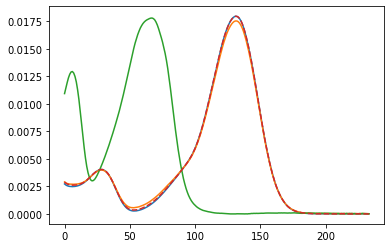

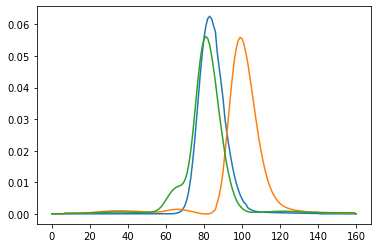

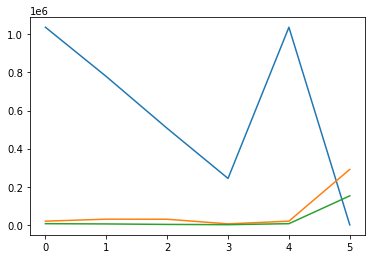

integral_array = [[1036798.41483894   19653.40312163    6472.39050265]
 [ 778352.43527153   30073.65267902    5144.31247138]
 [ 506480.55328462   29783.20573774    2614.24200699]
 [ 243859.36641574    5541.99734798    1251.28778557]
 [1036798.41483894   19653.40312163    6472.39050265]
 [      0.          291289.8086542   152399.78622763]]
objective_val_non_comp = 126660.28527723966
objective_val_comp = 3602289.184649766
objective_total_sum = 4172639.064808837
impure_peak_sum = 443689.5948818314
----- new PARAFAC decomposition with iteration offset 8 -----
new data tensor with boundaries (1413, 1574) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzal

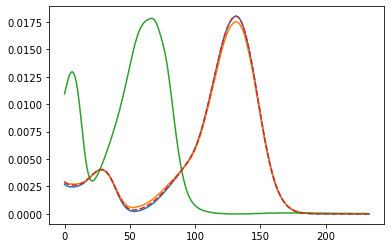

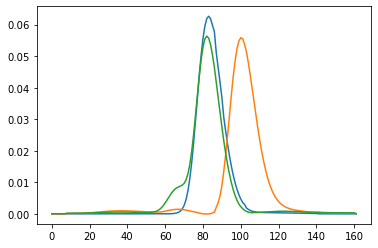

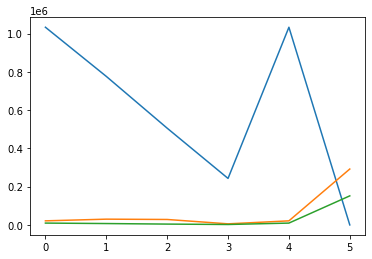

integral_array = [[1032779.76233996   21274.26325658    9570.58326332]
 [ 776023.96187863   30075.5668357     7146.76424506]
 [ 505423.82385871   28420.8024376     4318.95592979]
 [ 242954.47968392    5631.92198402    2208.77079542]
 [1032779.76233996   21274.26325658    9570.58326332]
 [      0.          292033.83919314  151802.00681449]]
objective_val_non_comp = 139492.47526737247
objective_val_comp = 3589961.790101187
objective_total_sum = 4173290.111376193
impure_peak_sum = 443835.8460076336
----- new PARAFAC decomposition with iteration offset 9 -----
new data tensor with boundaries (1413, 1575) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzal

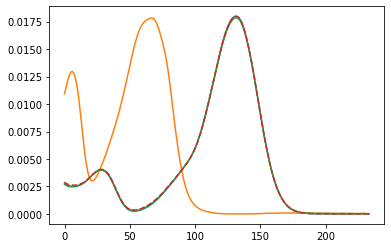

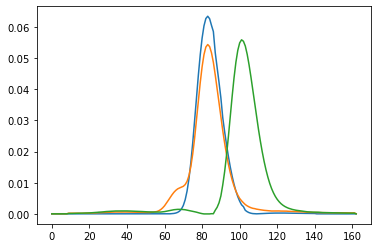

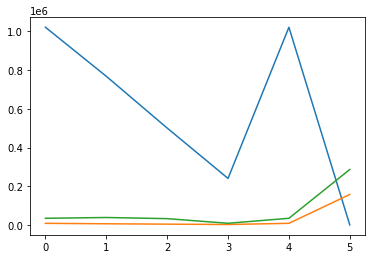

integral_array = [[1021655.36243856    8201.3721606    34255.57510049]
 [ 768215.65755187    5913.3248013    38312.68786798]
 [ 500657.38883023    3971.517804     32402.05236612]
 [ 240346.38950777    2132.43982148    8462.402502  ]
 [1021655.36243856    8201.3721606    34255.57510049]
 [      0.          157331.7440396   286516.39973703]]
objective_val_non_comp = 176108.31968505937
objective_val_comp = 3552530.1607669806
objective_total_sum = 4172486.6242286717
impure_peak_sum = 443848.1437766318
----- new PARAFAC decomposition with iteration offset 10 -----
new data tensor with boundaries (1413, 1576) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminoben

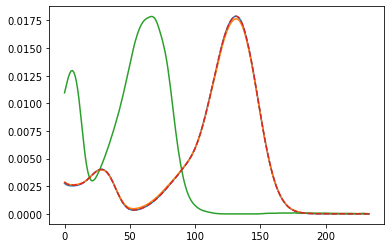

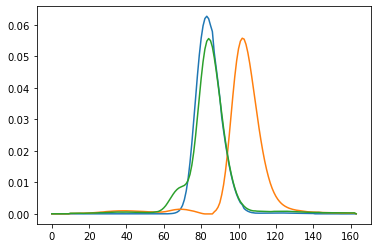

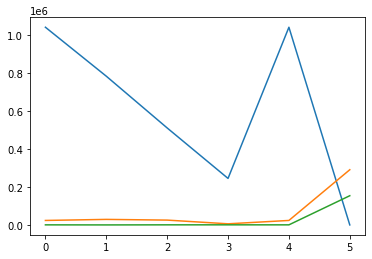

integral_array = [[1.03971782e+06 2.35123577e+04 3.36035119e+02]
 [7.82217392e+05 2.90365781e+04 0.00000000e+00]
 [5.10025765e+05 2.52981039e+04 4.26275079e+02]
 [2.44590386e+05 5.81929729e+03 4.63124564e+02]
 [1.03971782e+06 2.35123577e+04 3.36035119e+02]
 [0.00000000e+00 2.90214745e+05 1.53550947e+05]]
objective_val_non_comp = 108740.16461482285
objective_val_comp = 3616269.192856398
objective_total_sum = 4168775.0488970247
impure_peak_sum = 443765.69142580306
----- new PARAFAC decomposition with iteration offset 11 -----
new data tensor with boundaries (1413, 1577) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

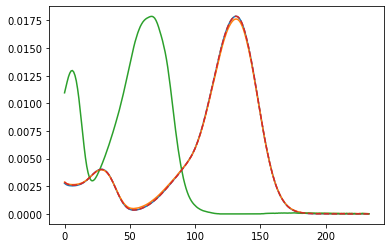

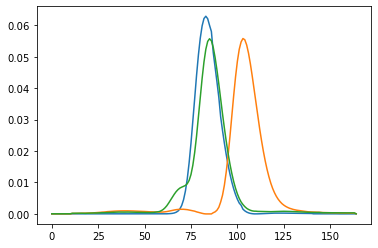

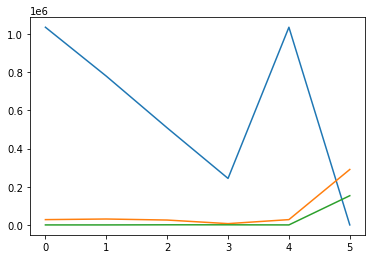

integral_array = [[1.03632038e+06 2.77444384e+04 0.00000000e+00]
 [7.79949170e+05 3.09562997e+04 0.00000000e+00]
 [5.08733568e+05 2.55364390e+04 6.14782150e+02]
 [2.43782576e+05 6.75293233e+03 5.25564882e+02]
 [1.03632038e+06 2.77444384e+04 0.00000000e+00]
 [0.00000000e+00 2.90663566e+05 1.53146617e+05]]
objective_val_non_comp = 119874.89478630664
objective_val_comp = 3605106.0684572123
objective_total_sum = 4168791.1460977406
impure_peak_sum = 443810.1828542227
----- new PARAFAC decomposition with iteration offset 12 -----
new data tensor with boundaries (1413, 1578) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

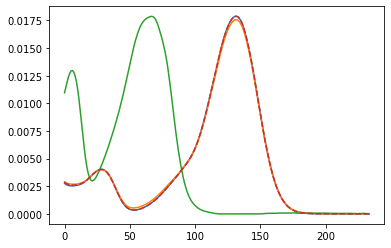

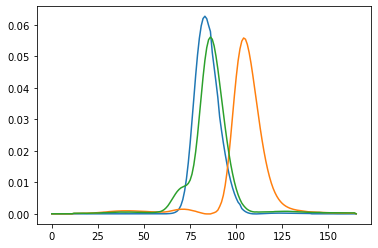

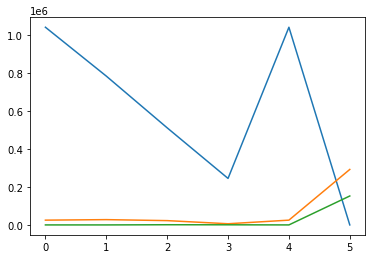

integral_array = [[1.03942317e+06 2.50863127e+04 0.00000000e+00]
 [7.82532888e+05 2.78005122e+04 0.00000000e+00]
 [5.10529307e+05 2.25834285e+04 9.46465232e+02]
 [2.44507492e+05 6.12026779e+03 5.99486728e+02]
 [1.03942317e+06 2.50863127e+04 0.00000000e+00]
 [0.00000000e+00 2.91720387e+05 1.52125936e+05]]
objective_val_non_comp = 108222.78578182122
objective_val_comp = 3616416.027759352
objective_total_sum = 4168485.1368261315
impure_peak_sum = 443846.32328495826
----- new PARAFAC decomposition with iteration offset 13 -----
new data tensor with boundaries (1413, 1579) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

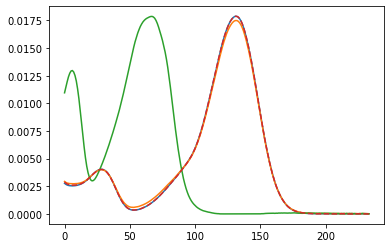

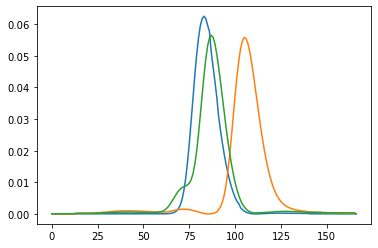

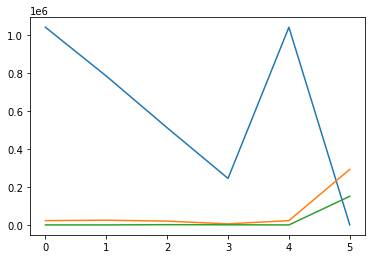

integral_array = [[1.04231337e+06 2.26300049e+04 0.00000000e+00]
 [7.84895231e+05 2.48996974e+04 0.00000000e+00]
 [5.12140006e+05 1.99066338e+04 1.28344845e+03]
 [2.45186284e+05 5.57145690e+03 6.29488477e+02]
 [1.04231337e+06 2.26300049e+04 0.00000000e+00]
 [0.00000000e+00 2.92873073e+05 1.50980511e+05]]
objective_val_non_comp = 97550.73489343813
objective_val_comp = 3626848.2537082834
objective_total_sum = 4168252.5735623296
impure_peak_sum = 443853.58496060886
----- new PARAFAC decomposition with iteration offset 14 -----
new data tensor with boundaries (1413, 1580) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

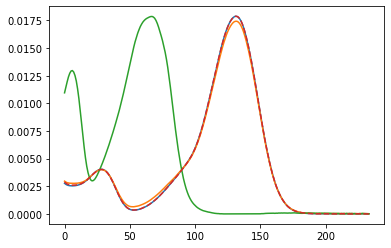

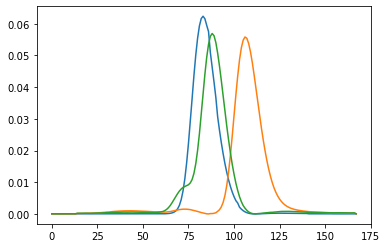

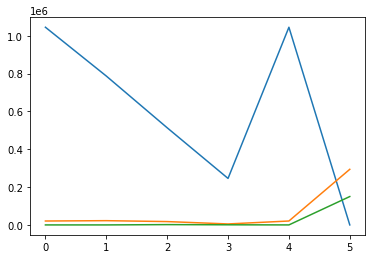

integral_array = [[1.04470555e+06 2.06510931e+04 0.00000000e+00]
 [7.86834534e+05 2.24601064e+04 0.00000000e+00]
 [5.13448073e+05 1.76377394e+04 1.61227268e+03]
 [2.45752638e+05 5.15486531e+03 6.22916087e+02]
 [1.04470555e+06 2.06510931e+04 0.00000000e+00]
 [0.00000000e+00 2.93899258e+05 1.49949871e+05]]
objective_val_non_comp = 88790.08592710349
objective_val_comp = 3635446.3437509337
objective_total_sum = 4168085.558741401
impure_peak_sum = 443849.1290633636
----- new PARAFAC decomposition with iteration offset 15 -----
new data tensor with boundaries (1413, 1581) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_co

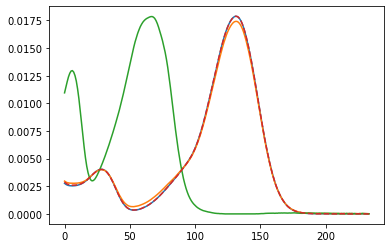

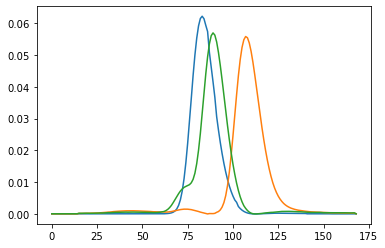

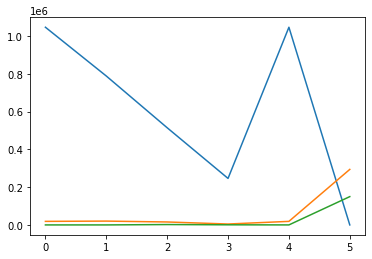

integral_array = [[1.04690571e+06 1.87933124e+04 0.00000000e+00]
 [7.88593449e+05 2.01981744e+04 0.00000000e+00]
 [5.14622980e+05 1.55805221e+04 1.93175709e+03]
 [2.46277141e+05 4.77293434e+03 5.95914249e+02]
 [1.04690571e+06 1.87933124e+04 0.00000000e+00]
 [0.00000000e+00 2.94008826e+05 1.49837664e+05]]
objective_val_non_comp = 80665.9269673379
objective_val_comp = 3643304.9975103466
objective_total_sum = 4167817.4150048536
impure_peak_sum = 443846.4905271692
----- new PARAFAC decomposition with iteration offset 16 -----
new data tensor with boundaries (1413, 1582) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_co

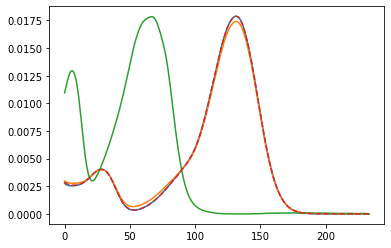

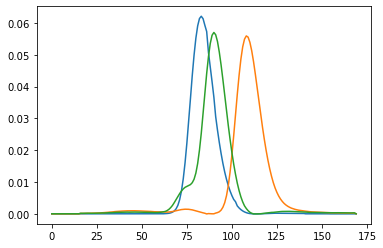

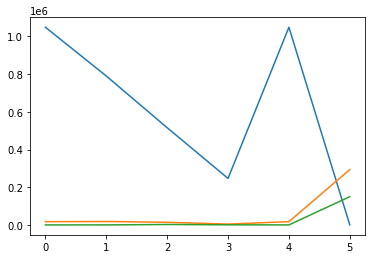

integral_array = [[1.04880619e+06 1.71946464e+04 0.00000000e+00]
 [7.90099183e+05 1.82120648e+04 6.41282721e+01]
 [5.15632469e+05 1.38017262e+04 2.22225267e+03]
 [2.46733521e+05 4.45332737e+03 5.53258414e+02]
 [1.04880619e+06 1.71946464e+04 0.00000000e+00]
 [3.51219996e+02 2.93675800e+05 1.49818270e+05]]
objective_val_non_comp = 73696.05063792666
objective_val_comp = 3650077.5621621367
objective_total_sum = 4167618.902682943
impure_peak_sum = 443845.28988287976
----- new PARAFAC decomposition with iteration offset 17 -----
new data tensor with boundaries (1413, 1583) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

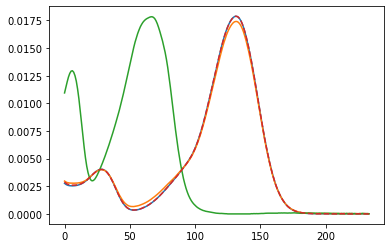

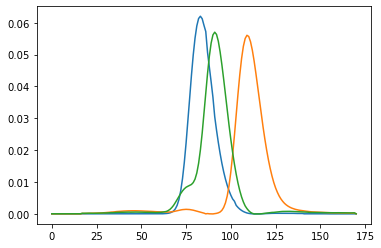

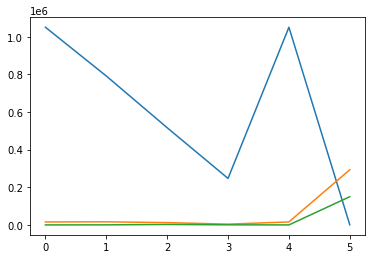

integral_array = [[1.05048298e+06 1.57575386e+04 0.00000000e+00]
 [7.91393988e+05 1.64236723e+04 3.49082945e+02]
 [5.16516315e+05 1.22484472e+04 2.48023111e+03]
 [2.47137774e+05 4.16508704e+03 5.07350052e+02]
 [1.05048298e+06 1.57575386e+04 0.00000000e+00]
 [8.16715759e+02 2.93169614e+05 1.49864486e+05]]
objective_val_non_comp = 67688.9477717347
objective_val_comp = 3656014.033692248
objective_total_sum = 4167553.797554016
impure_peak_sum = 443850.8160900333
----- new PARAFAC decomposition with iteration offset 18 -----
new data tensor with boundaries (1413, 1584) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_comp

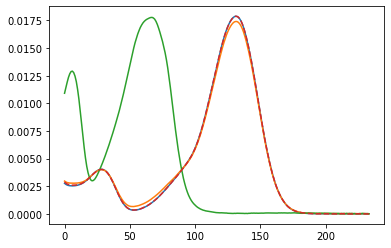

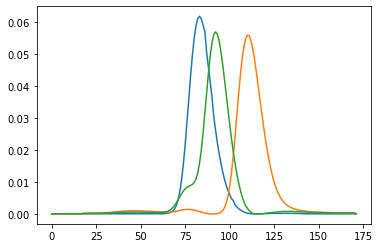

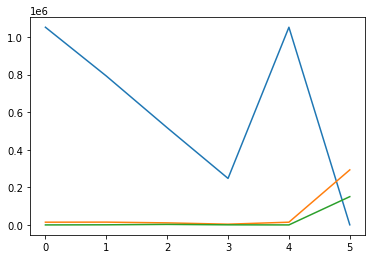

integral_array = [[1.05196353e+06 1.45027405e+04 0.00000000e+00]
 [7.92523159e+05 1.48327768e+04 6.42280514e+02]
 [5.17280946e+05 1.08851065e+04 2.73460358e+03]
 [2.47494177e+05 3.90710549e+03 4.62571943e+02]
 [1.05196353e+06 1.45027405e+04 0.00000000e+00]
 [5.55263589e+02 2.92923452e+05 1.50388953e+05]]
objective_val_non_comp = 62469.92576435551
objective_val_comp = 3661225.3466111524
objective_total_sum = 4167562.941163642
impure_peak_sum = 443867.6687881338
----- new PARAFAC decomposition with iteration offset 19 -----
new data tensor with boundaries (1413, 1585) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_co

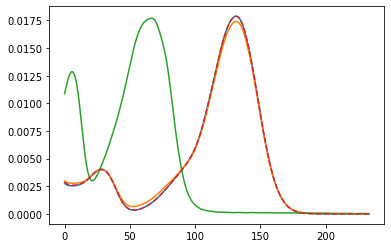

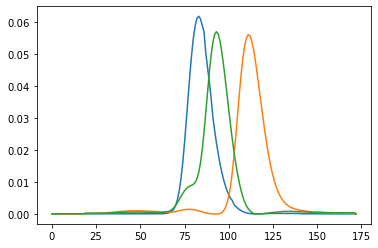

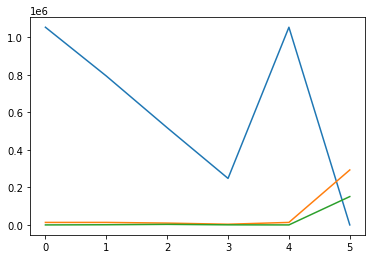

integral_array = [[1.05333462e+06 1.33385018e+04 0.00000000e+00]
 [7.93562881e+05 1.33809517e+04 9.11601488e+02]
 [5.17984398e+05 9.68553708e+03 2.93834329e+03]
 [2.47823724e+05 3.66370885e+03 4.17491228e+02]
 [1.05333462e+06 1.33385018e+04 0.00000000e+00]
 [0.00000000e+00 2.92929580e+05 1.50991053e+05]]
objective_val_non_comp = 57674.63733389282
objective_val_comp = 3666040.2450735318
objective_total_sum = 4167635.515344053
impure_peak_sum = 443920.63293662854
----- new PARAFAC decomposition with iteration offset 20 -----
new data tensor with boundaries (1413, 1586) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

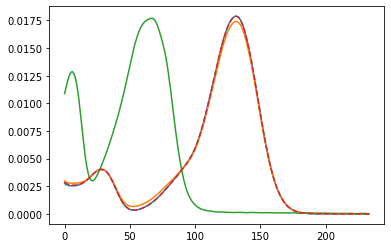

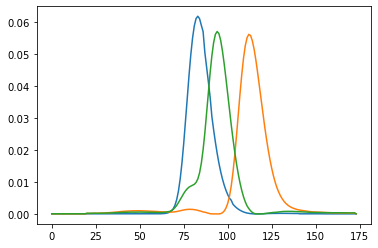

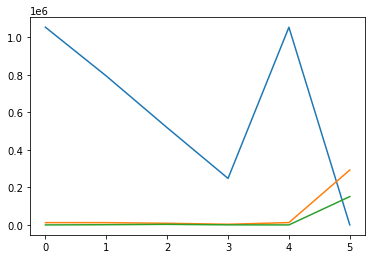

integral_array = [[1.05455990e+06 1.23098750e+04 0.00000000e+00]
 [7.94501603e+05 1.21092936e+04 1.09950417e+03]
 [5.18629292e+05 8.68845013e+03 3.00668221e+03]
 [2.48119209e+05 3.44787280e+03 3.73828840e+02]
 [1.05455990e+06 1.23098750e+04 0.00000000e+00]
 [0.00000000e+00 2.92850740e+05 1.51094358e+05]]
objective_val_non_comp = 53345.381673827
objective_val_comp = 3670369.895895024
objective_total_sum = 4167660.3759611845
impure_peak_sum = 443945.09839233395
----- new PARAFAC decomposition with iteration offset 21 -----
new data tensor with boundaries (1413, 1587) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_com

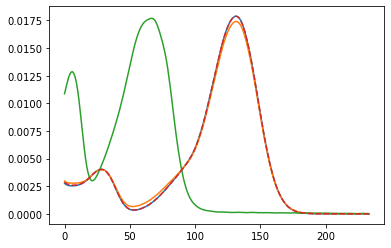

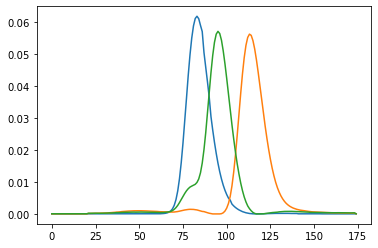

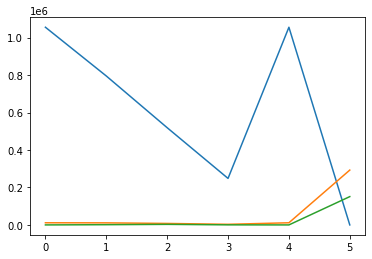

integral_array = [[1.05560898e+06 1.14467839e+04 0.00000000e+00]
 [7.95310399e+05 1.10306738e+04 1.22151682e+03]
 [5.19187863e+05 7.87179858e+03 2.99994607e+03]
 [2.48371631e+05 3.26202798e+03 3.42242295e+02]
 [1.05560898e+06 1.14467839e+04 0.00000000e+00]
 [0.00000000e+00 2.92832538e+05 1.51129473e+05]]
objective_val_non_comp = 49621.77323890326
objective_val_comp = 3674087.855690621
objective_total_sum = 4167671.640257635
impure_peak_sum = 443962.0113281107
----- new PARAFAC decomposition with iteration offset 22 -----
new data tensor with boundaries (1413, 1588) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_com

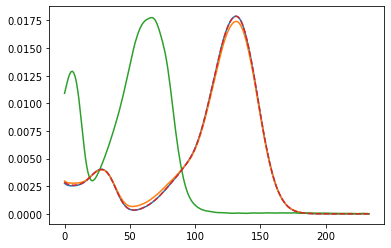

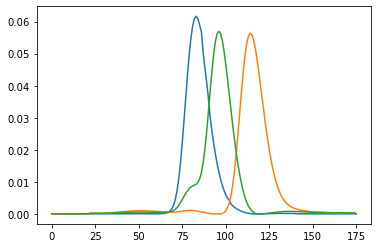

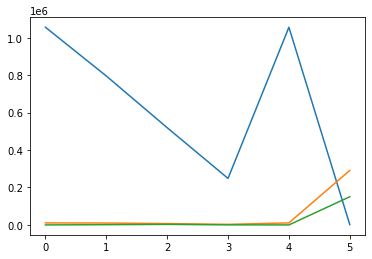

integral_array = [[1.05653613e+06 1.06870187e+04 0.00000000e+00]
 [7.96044415e+05 1.01164506e+04 1.24052433e+03]
 [5.19703449e+05 7.22698522e+03 2.86109345e+03]
 [2.48597252e+05 3.09601541e+03 3.24959521e+02]
 [1.05653613e+06 1.06870187e+04 0.00000000e+00]
 [1.81088221e+03 2.91498698e+05 1.50586892e+05]]
objective_val_non_comp = 46240.06588398242
objective_val_comp = 3677417.3697902905
objective_total_sum = 4167553.907946883
impure_peak_sum = 443896.4722726096
----- new PARAFAC decomposition with iteration offset 23 -----
new data tensor with boundaries (1413, 1589) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_co

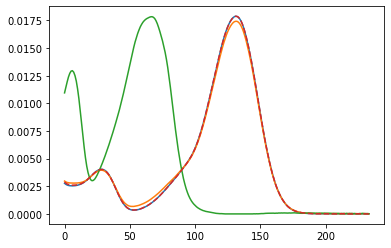

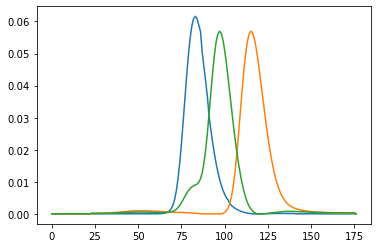

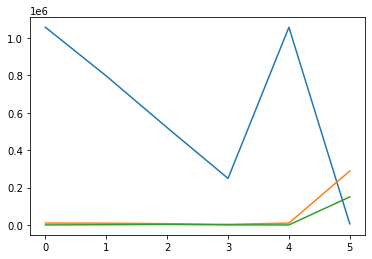

integral_array = [[1.05750626e+06 9.85931581e+03 0.00000000e+00]
 [7.96819736e+05 9.22487618e+03 1.20033303e+03]
 [5.20245536e+05 6.63847443e+03 2.67034589e+03]
 [2.48835459e+05 2.90569383e+03 3.25588366e+02]
 [1.05750626e+06 9.85931581e+03 0.00000000e+00]
 [5.56161936e+03 2.88320160e+05 1.49935125e+05]]
objective_val_non_comp = 42683.94334393658
objective_val_comp = 3680913.244311679
objective_total_sum = 4167414.091703993
impure_peak_sum = 443816.90404837753
----- new PARAFAC decomposition with iteration offset 24 -----
new data tensor with boundaries (1413, 1590) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_co

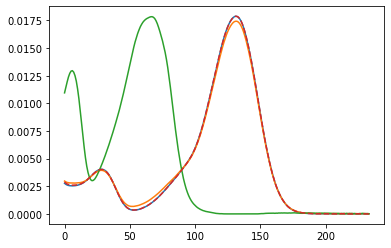

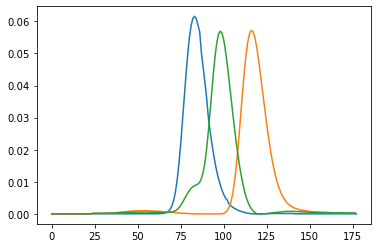

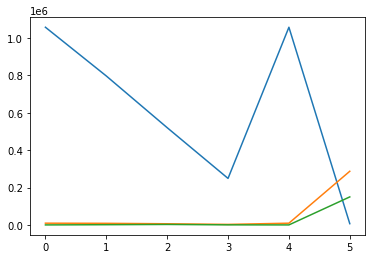

integral_array = [[1.05822815e+06 9.27635939e+03 0.00000000e+00]
 [7.97384796e+05 8.53061150e+03 1.17202596e+03]
 [5.20635951e+05 6.16128645e+03 2.54116898e+03]
 [2.49009136e+05 2.76430220e+03 3.40997355e+02]
 [1.05822815e+06 9.27635939e+03 0.00000000e+00]
 [6.59616798e+03 2.87248905e+05 1.49952280e+05]]
objective_val_non_comp = 40063.11123371729
objective_val_comp = 3683486.174913305
objective_total_sum = 4167346.638791103
impure_peak_sum = 443797.35264408076
----- new PARAFAC decomposition with iteration offset 25 -----
new data tensor with boundaries (1413, 1591) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_co

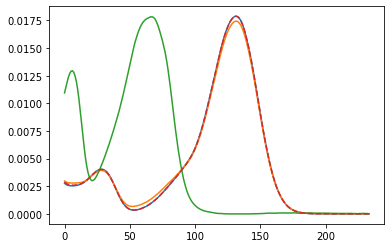

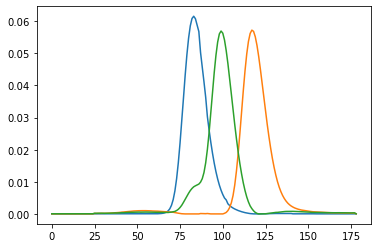

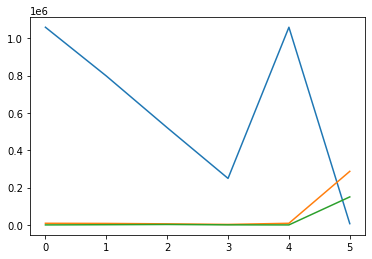

integral_array = [[1.05888114e+06 8.74314298e+03 0.00000000e+00]
 [7.97890956e+05 7.93319005e+03 1.12431793e+03]
 [5.20983285e+05 5.74048252e+03 2.40690629e+03]
 [2.49164208e+05 2.62937087e+03 3.68320172e+02]
 [1.05888114e+06 8.74314298e+03 0.00000000e+00]
 [6.70302417e+03 2.87000077e+05 1.50068655e+05]]
objective_val_non_comp = 37688.873793342194
objective_val_comp = 3685800.7230320587
objective_total_sum = 4167261.353719658
impure_peak_sum = 443771.75689425727
----- new PARAFAC decomposition with iteration offset 26 -----
new data tensor with boundaries (1413, 1592) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

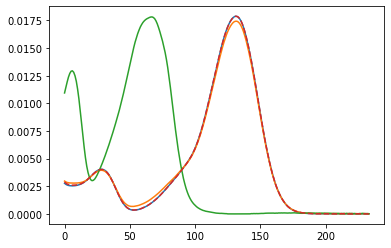

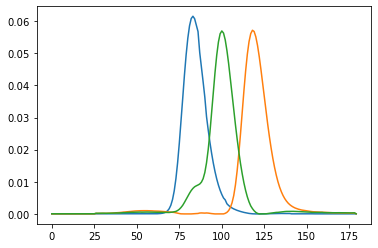

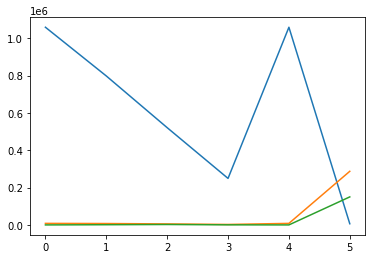

integral_array = [[1.05946566e+06 8.25557338e+03 0.00000000e+00]
 [7.98341507e+05 7.42601761e+03 1.06496327e+03]
 [5.21291047e+05 5.39082661e+03 2.26769032e+03]
 [2.49301854e+05 2.49736722e+03 4.04620560e+02]
 [1.05946566e+06 8.25557338e+03 0.00000000e+00]
 [6.22690358e+03 2.87371365e+05 1.50178398e+05]]
objective_val_non_comp = 35562.63234544165
objective_val_comp = 3687865.7204701826
objective_total_sum = 4167205.0194615573
impure_peak_sum = 443776.6666459328
----- new PARAFAC decomposition with iteration offset 27 -----
new data tensor with boundaries (1413, 1593) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

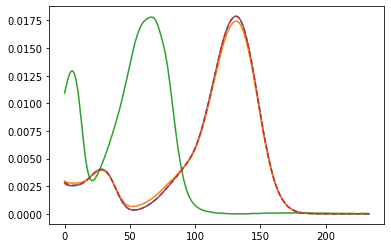

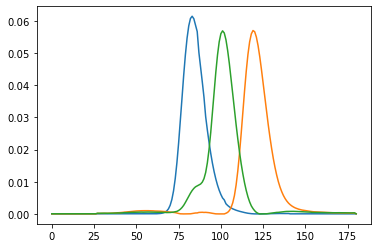

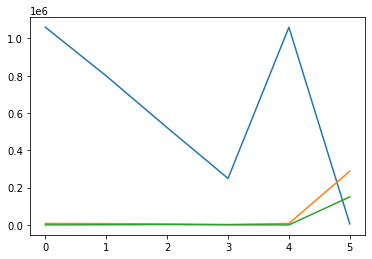

integral_array = [[1.05998609e+06 7.81289336e+03 0.00000000e+00]
 [7.98741574e+05 6.99420030e+03 1.00637336e+03]
 [5.21563574e+05 5.10148690e+03 2.13254068e+03]
 [2.49424143e+05 2.37172000e+03 4.46115155e+02]
 [1.05998609e+06 7.81289336e+03 0.00000000e+00]
 [5.55301057e+03 2.87954465e+05 1.50281644e+05]]
objective_val_non_comp = 33678.223137508096
objective_val_comp = 3689701.4701009705
objective_total_sum = 4167168.8120970163
impure_peak_sum = 443789.11885853723
----- new PARAFAC decomposition with iteration offset 28 -----
new data tensor with boundaries (1413, 1594) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is

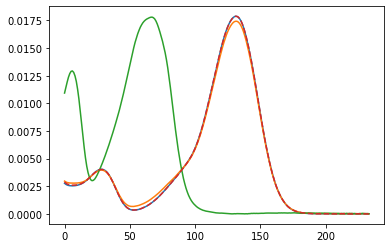

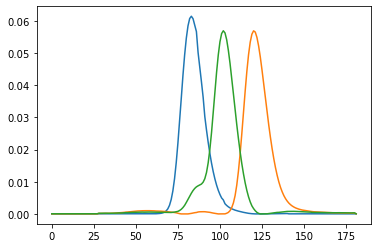

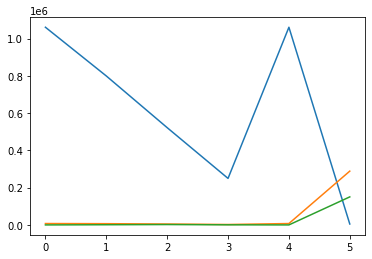

integral_array = [[1.06044197e+06 7.41974054e+03 0.00000000e+00]
 [7.99091486e+05 6.63521673e+03 9.55375537e+02]
 [5.21801816e+05 4.86070846e+03 2.00600515e+03]
 [2.49531585e+05 2.24864060e+03 4.90245886e+02]
 [1.06044197e+06 7.41974054e+03 0.00000000e+00]
 [4.87892366e+03 2.88560493e+05 1.50366573e+05]]
objective_val_non_comp = 32035.67344160169
objective_val_comp = 3691308.8286448745
objective_total_sum = 4167150.4915718343
impure_peak_sum = 443805.98948535835
----- new PARAFAC decomposition with iteration offset 29 -----
new data tensor with boundaries (1413, 1595) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

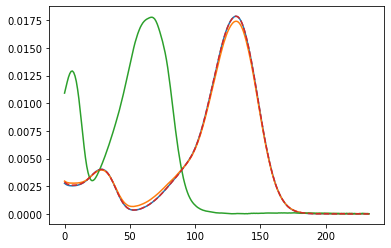

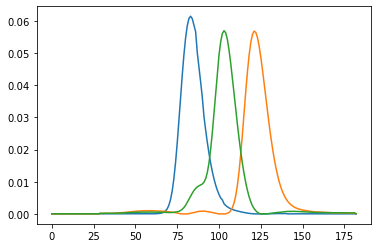

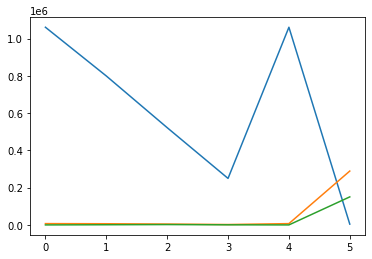

integral_array = [[1.06089066e+06 7.02013335e+03 0.00000000e+00]
 [7.99434517e+05 6.30514101e+03 9.17669311e+02]
 [5.22034365e+05 4.63359685e+03 1.89259031e+03]
 [2.49637854e+05 2.11548670e+03 5.34691669e+02]
 [1.06089066e+06 7.02013335e+03 0.00000000e+00]
 [4.25797329e+03 2.89117600e+05 1.50447281e+05]]
objective_val_non_comp = 30439.442551959324
objective_val_comp = 3692888.0660485663
objective_total_sum = 4167150.3630619063
impure_peak_sum = 443822.85446138046
----- new PARAFAC decomposition with iteration offset 30 -----
new data tensor with boundaries (1413, 1596) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is

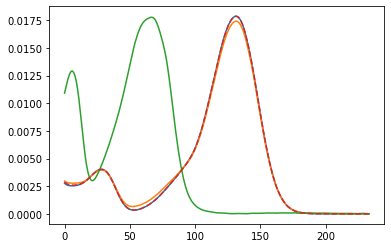

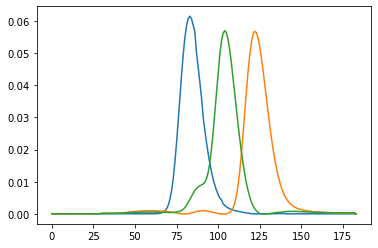

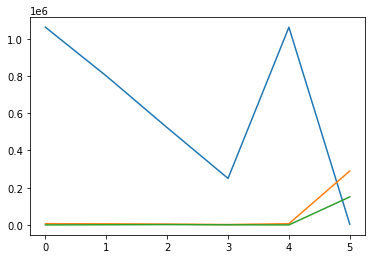

integral_array = [[1.06140465e+06 6.54322104e+03 0.00000000e+00]
 [7.99825838e+05 5.94181306e+03 8.92807695e+02]
 [5.22297721e+05 4.37566525e+03 1.79016521e+03]
 [2.49760205e+05 1.95324918e+03 5.77159945e+02]
 [1.06140465e+06 6.54322104e+03 0.00000000e+00]
 [3.77392544e+03 2.89585191e+05 1.50479512e+05]]
objective_val_non_comp = 28617.302416752118
objective_val_comp = 3694693.0704535474
objective_total_sum = 4167149.002165586
impure_peak_sum = 443838.6292952873
----- new PARAFAC decomposition with iteration offset 31 -----
new data tensor with boundaries (1413, 1597) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

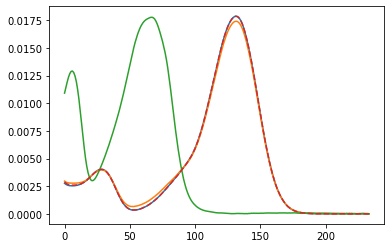

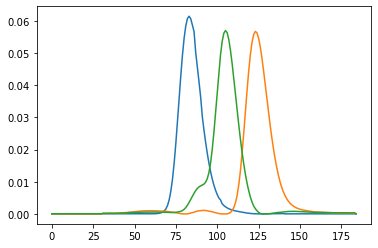

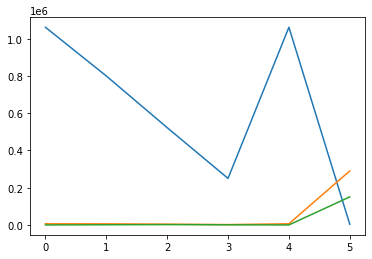

integral_array = [[1.06185558e+06 6.12323078e+03 0.00000000e+00]
 [8.00168877e+05 5.64074186e+03 8.81773181e+02]
 [5.22528849e+05 4.14523262e+03 1.70182796e+03]
 [2.49868300e+05 1.79572372e+03 6.15888265e+02]
 [1.06185558e+06 6.12323078e+03 0.00000000e+00]
 [3.42006297e+03 2.89924687e+05 1.50510852e+05]]
objective_val_non_comp = 27027.649161232515
objective_val_comp = 3696277.1953134974
objective_total_sum = 4167160.446640353
impure_peak_sum = 443855.60216562345
----- new PARAFAC decomposition with iteration offset 32 -----
new data tensor with boundaries (1413, 1598) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

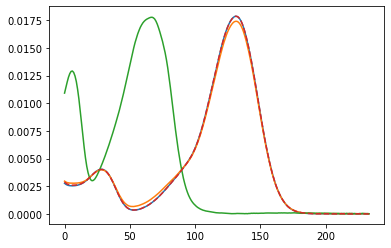

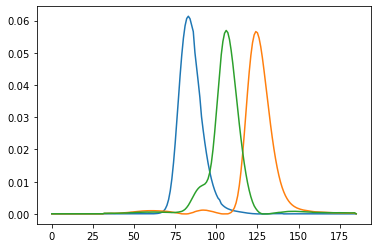

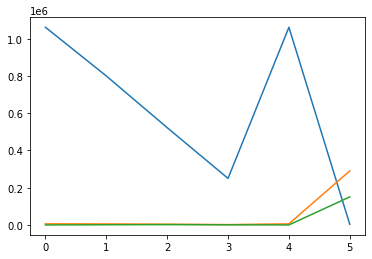

integral_array = [[1.06223289e+06 5.77523540e+03 0.00000000e+00]
 [8.00455872e+05 5.40379953e+03 8.80332298e+02]
 [5.22722697e+05 3.94431655e+03 1.62383562e+03]
 [2.49959437e+05 1.64834265e+03 6.49830727e+02]
 [1.06223289e+06 5.77523540e+03 0.00000000e+00]
 [3.13047268e+03 2.90231965e+05 1.50510486e+05]]
objective_val_non_comp = 25700.928159232906
objective_val_comp = 3697603.7959032543
objective_total_sum = 4167177.647696643
impure_peak_sum = 443872.923634156
----- new PARAFAC decomposition with iteration offset 33 -----
new data tensor with boundaries (1413, 1599) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_co

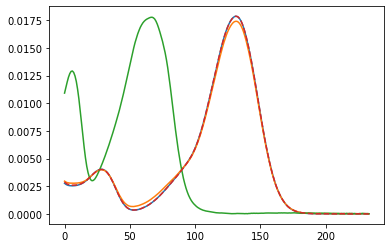

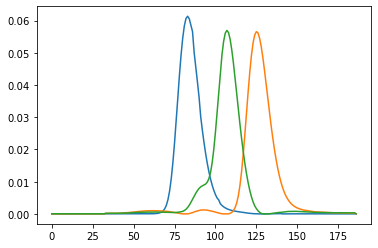

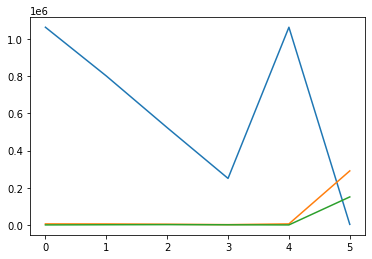

integral_array = [[1.06257154e+06 5.46587908e+03 0.00000000e+00]
 [8.00713457e+05 5.20295180e+03 8.85930727e+02]
 [5.22896754e+05 3.75278163e+03 1.55568162e+03]
 [2.50041748e+05 1.50288491e+03 6.78527616e+02]
 [1.06257154e+06 5.46587908e+03 0.00000000e+00]
 [2.93362759e+03 2.90444542e+05 1.50511820e+05]]
objective_val_non_comp = 24510.51645964996
objective_val_comp = 3698795.0377680156
objective_total_sum = 4167195.5436618114
impure_peak_sum = 443889.98943414586
----- new PARAFAC decomposition with iteration offset 34 -----
new data tensor with boundaries (1413, 1600) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

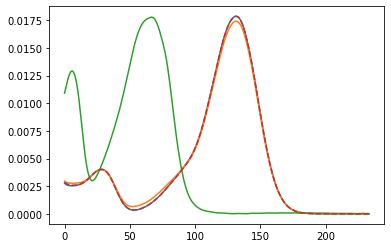

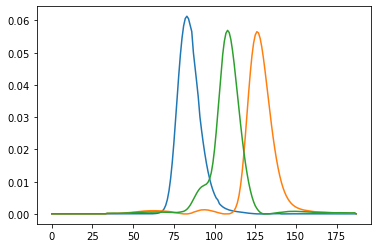

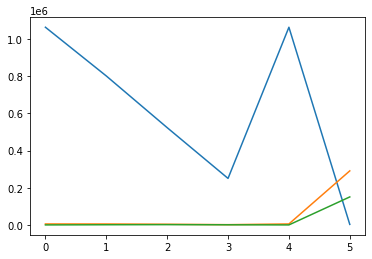

integral_array = [[1.06288118e+06 5.18810181e+03 0.00000000e+00]
 [8.00949014e+05 5.02926126e+03 8.94280126e+02]
 [5.23055851e+05 3.56515707e+03 1.49428570e+03]
 [2.50117340e+05 1.35898350e+03 7.01789744e+02]
 [1.06288118e+06 5.18810181e+03 0.00000000e+00]
 [2.79542466e+03 2.90596711e+05 1.50513395e+05]]
objective_val_non_comp = 23419.961018484955
objective_val_comp = 3699884.5638769753
objective_total_sum = 4167210.055398987
impure_peak_sum = 443905.5305035268
----- new PARAFAC decomposition with iteration offset 35 -----
new data tensor with boundaries (1413, 1601) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

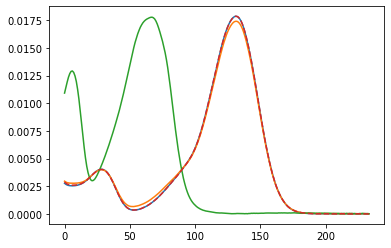

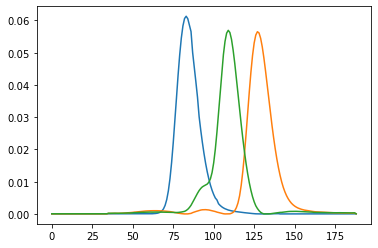

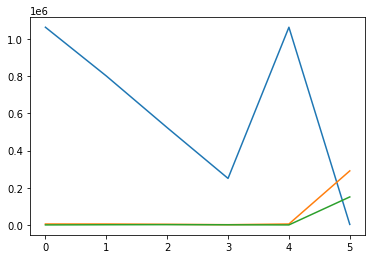

integral_array = [[1.06318036e+06 4.92767342e+03 0.00000000e+00]
 [8.01176625e+05 4.86767610e+03 9.02091505e+02]
 [5.23209214e+05 3.37244181e+03 1.43737334e+03]
 [2.50190446e+05 1.21474623e+03 7.20234929e+02]
 [1.06318036e+06 4.92767342e+03 0.00000000e+00]
 [2.70480507e+03 2.90692520e+05 1.50523678e+05]]
objective_val_non_comp = 22369.91074154873
objective_val_comp = 3700937.0013831444
objective_total_sum = 4167227.9152683555
impure_peak_sum = 443921.0031436627
----- new PARAFAC decomposition with iteration offset 36 -----
new data tensor with boundaries (1413, 1602) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

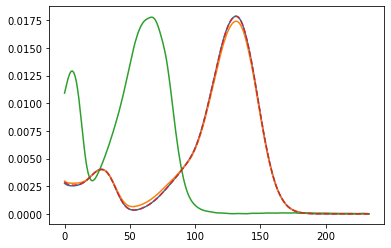

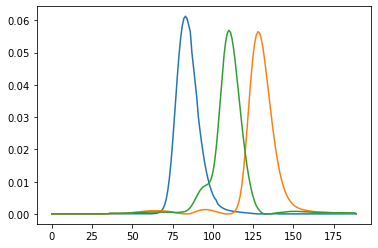

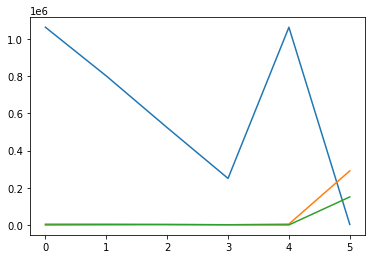

integral_array = [[1.06353321e+06 4.62105821e+03 0.00000000e+00]
 [8.01444737e+05 4.66591207e+03 9.06514195e+02]
 [5.23388523e+05 3.14167440e+03 1.38271464e+03]
 [2.50276048e+05 1.05730257e+03 7.34683121e+02]
 [1.06353321e+06 4.62105821e+03 0.00000000e+00]
 [2.66612267e+03 2.90731334e+05 1.50535487e+05]]
objective_val_non_comp = 21130.91741829139
objective_val_comp = 3702175.7267074008
objective_total_sum = 4167239.5881033624
impure_peak_sum = 443932.9439776697
----- new PARAFAC decomposition with iteration offset 37 -----
new data tensor with boundaries (1413, 1603) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

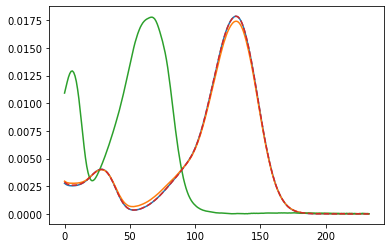

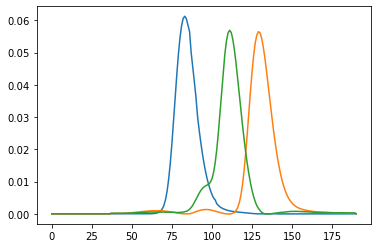

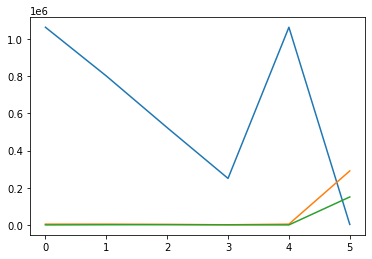

integral_array = [[1.06397329e+06 4.21564123e+03 5.50735562e+01]
 [8.01778967e+05 4.38939907e+03 9.07982242e+02]
 [5.23610536e+05 2.85152596e+03 1.33005732e+03]
 [2.50382161e+05 8.75450353e+02 7.46319532e+02]
 [1.06397329e+06 4.21564123e+03 5.50735562e+01]
 [2.66052839e+03 2.90725278e+05 1.50557280e+05]]
objective_val_non_comp = 19642.16405340002
objective_val_comp = 3703718.2426361875
objective_total_sum = 4167303.4927804563
impure_peak_sum = 443943.0860908684
----- new PARAFAC decomposition with iteration offset 38 -----
new data tensor with boundaries (1413, 1604) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

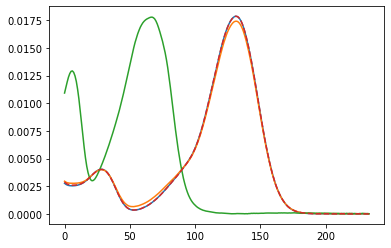

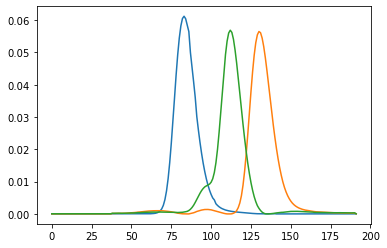

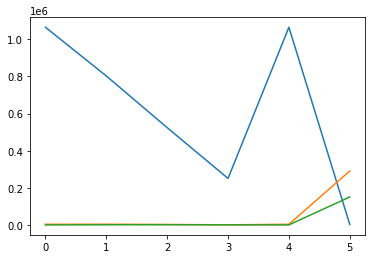

integral_array = [[1.06465683e+06 3.55062634e+03 1.33294545e+02]
 [8.02296652e+05 3.91567332e+03 9.06033718e+02]
 [5.23951941e+05 2.42386975e+03 1.27891073e+03]
 [2.50545294e+05 6.35757757e+02 7.56442558e+02]
 [1.06465683e+06 3.55062634e+03 1.33294545e+02]
 [2.70606852e+03 2.90645763e+05 1.50596467e+05]]
objective_val_non_comp = 17284.52959763558
objective_val_comp = 3706107.5445416425
objective_total_sum = 4167340.3729085736
impure_peak_sum = 443948.29876929533
----- new PARAFAC decomposition with iteration offset 39 -----
new data tensor with boundaries (1413, 1605) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

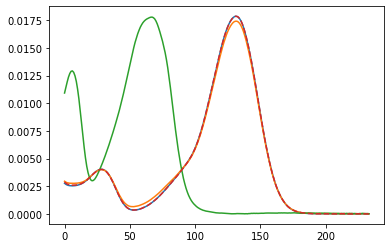

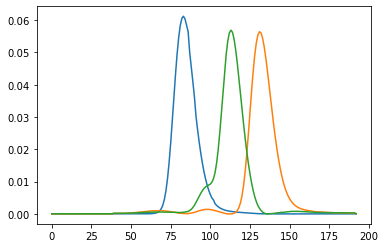

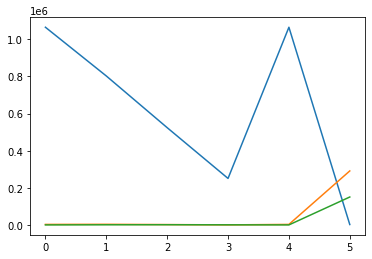

integral_array = [[1.06528085e+06 2.94355745e+03 2.07976262e+02]
 [8.02766830e+05 3.48825654e+03 9.00477110e+02]
 [5.24262409e+05 2.01902364e+03 1.22888221e+03]
 [2.50694560e+05 4.15670669e+02 7.65546468e+02]
 [1.06528085e+06 2.94355745e+03 2.07976262e+02]
 [2.24801049e+03 2.91095666e+05 1.50618849e+05]]
objective_val_non_comp = 15120.924053681989
objective_val_comp = 3708285.4928825945
objective_total_sum = 4167368.9432014544
impure_peak_sum = 443962.52626517776
----- new PARAFAC decomposition with iteration offset 40 -----
new data tensor with boundaries (1413, 1606) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is

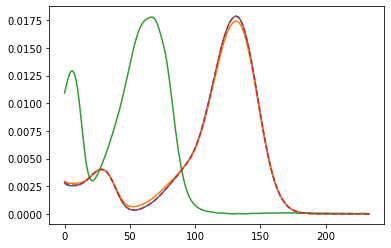

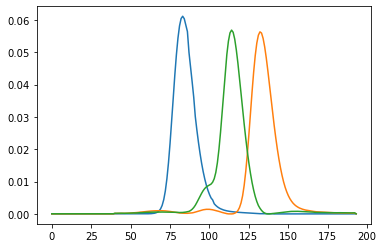

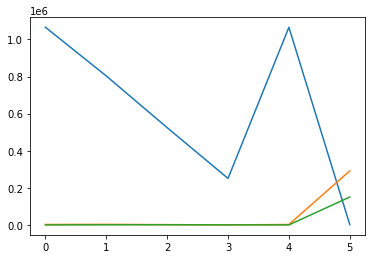

integral_array = [[1.06583894e+06 2.40316944e+03 2.78785114e+02]
 [8.03187310e+05 3.11167398e+03 8.92215610e+02]
 [5.24540407e+05 1.64222852e+03 1.18038403e+03]
 [2.50828109e+05 2.18581917e+02 7.73524482e+02]
 [1.06583894e+06 2.40316944e+03 2.78785114e+02]
 [1.90470340e+03 2.91431661e+05 1.50637728e+05]]
objective_val_non_comp = 13182.517643074632
objective_val_comp = 3710233.70020535
objective_total_sum = 4167390.309566092
impure_peak_sum = 443974.0917176682
----- new PARAFAC decomposition with iteration offset 41 -----
new data tensor with boundaries (1413, 1607) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_com

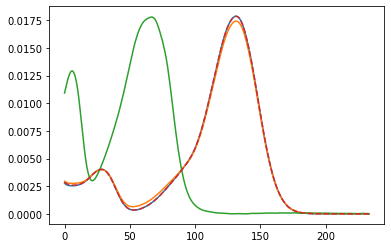

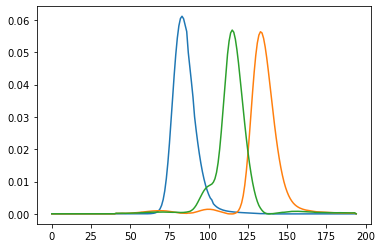

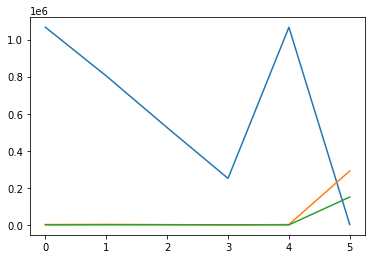

integral_array = [[1.06629608e+06 1.96316397e+03 3.44612240e+02]
 [8.03533032e+05 2.81904980e+03 8.83532866e+02]
 [5.24768911e+05 1.31833926e+03 1.13481185e+03]
 [2.50937125e+05 5.75510914e+01 7.81052085e+02]
 [1.06629608e+06 1.96316397e+03 3.44612240e+02]
 [1.98225700e+03 2.91343767e+05 1.50654733e+05]]
objective_val_non_comp = 11609.889380793977
objective_val_comp = 3711831.222161008
objective_total_sum = 4167421.869338916
impure_peak_sum = 443980.75779711397
----- new PARAFAC decomposition with iteration offset 42 -----
new data tensor with boundaries (1413, 1608) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

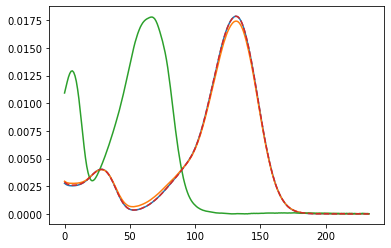

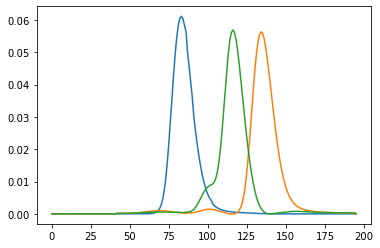

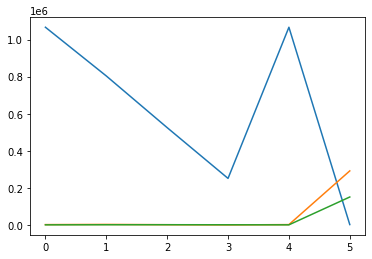

integral_array = [[1.06660901e+06 1.66836698e+03 4.05259376e+02]
 [8.03768495e+05 2.64454162e+03 8.74862263e+02]
 [5.24925693e+05 1.07210493e+03 1.09247825e+03]
 [2.51011490e+05 0.00000000e+00 7.86405546e+02]
 [1.06660901e+06 1.66836698e+03 4.05259376e+02]
 [1.81165444e+03 2.91537132e+05 1.50644714e+05]]
objective_val_non_comp = 10617.645327452452
objective_val_comp = 3712923.7074517068
objective_total_sum = 4167534.8536374685
impure_peak_sum = 443993.5008583092
----- new PARAFAC decomposition with iteration offset 43 -----
new data tensor with boundaries (1413, 1609) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_

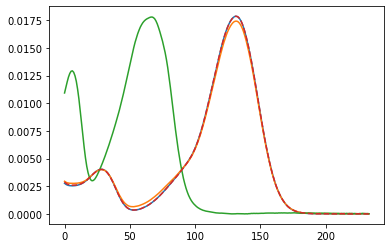

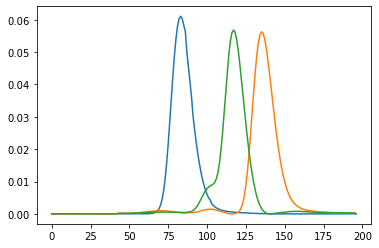

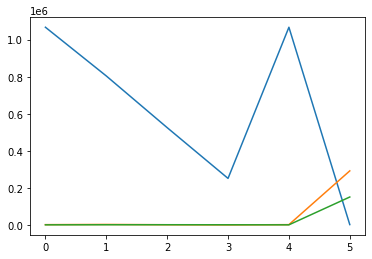

integral_array = [[1.06685208e+06 1.43954975e+03 4.60951535e+02]
 [8.03951089e+05 2.52928481e+03 8.67232451e+02]
 [5.25047758e+05 8.68889579e+02 1.05411008e+03]
 [2.51068612e+05 0.00000000e+00 7.90536501e+02]
 [1.06685208e+06 1.43954975e+03 4.60951535e+02]
 [1.69656587e+03 2.91679907e+05 1.50630078e+05]]
objective_val_non_comp = 9911.05599385247
objective_val_comp = 3713771.627894965
objective_total_sum = 4167689.2355181784
impure_peak_sum = 444006.55162936146
----- new PARAFAC decomposition with iteration offset 44 -----
new data tensor with boundaries (1413, 1610) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_co

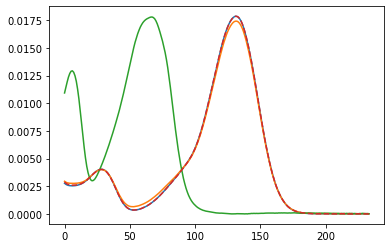

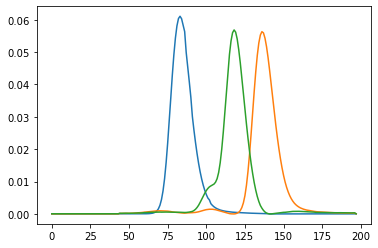

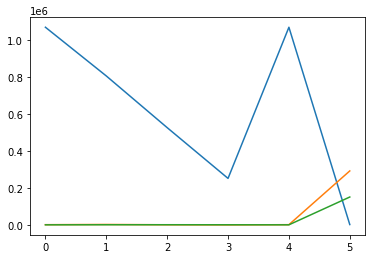

integral_array = [[1.06706804e+06 1.23285251e+03 5.12182467e+02]
 [8.04114638e+05 2.43820484e+03 8.60900738e+02]
 [5.25156183e+05 6.90501280e+02 1.01988658e+03]
 [2.51118937e+05 0.00000000e+00 7.92830102e+02]
 [1.06706804e+06 1.23285251e+03 5.12182467e+02]
 [1.93383547e+03 2.91459993e+05 1.50622269e+05]]
objective_val_non_comp = 9292.393497035306
objective_val_comp = 3714525.839203392
objective_total_sum = 4167834.3300020494
impure_peak_sum = 444016.0973016205
----- new PARAFAC decomposition with iteration offset 45 -----
new data tensor with boundaries (1413, 1611) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_co

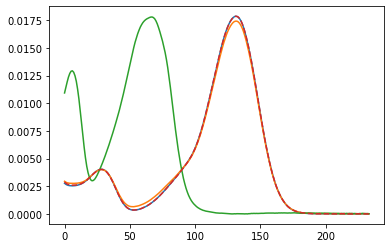

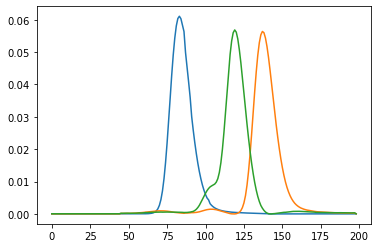

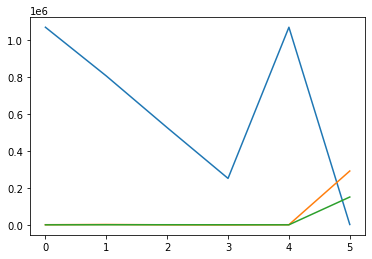

integral_array = [[1.06725609e+06 1.04755703e+03 5.58843668e+02]
 [8.04257230e+05 2.37407668e+03 8.56602439e+02]
 [5.25250295e+05 5.42398480e+02 9.90291783e+02]
 [2.51162690e+05 0.00000000e+00 7.93855666e+02]
 [1.06725609e+06 1.04755703e+03 5.58843668e+02]
 [2.23164433e+03 2.91155291e+05 1.50638335e+05]]
objective_val_non_comp = 8770.026437257122
objective_val_comp = 3715182.3899405613
objective_total_sum = 4167977.686419408
impure_peak_sum = 444025.2700415889
----- new PARAFAC decomposition with iteration offset 46 -----
new data tensor with boundaries (1413, 1612) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_co

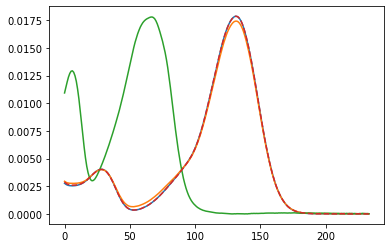

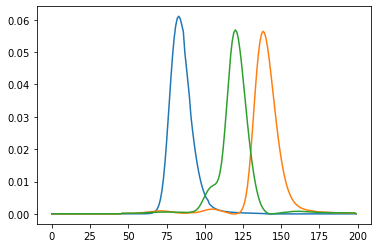

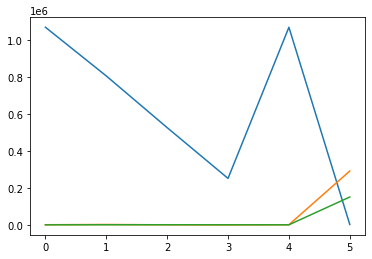

integral_array = [[1.06740919e+06 8.93022766e+02 6.01291626e+02]
 [8.04372600e+05 2.33833840e+03 8.53299577e+02]
 [5.25326719e+05 4.28690660e+02 9.64231780e+02]
 [2.51198428e+05 0.00000000e+00 7.92548019e+02]
 [1.06740919e+06 8.93022766e+02 6.01291626e+02]
 [2.38593790e+03 2.91000608e+05 1.50651209e+05]]
objective_val_non_comp = 8365.737220283701
objective_val_comp = 3715716.1222736607
objective_total_sum = 4168119.614485761
impure_peak_sum = 444037.75499181694
----- new PARAFAC decomposition with iteration offset 47 -----
new data tensor with boundaries (1413, 1613) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

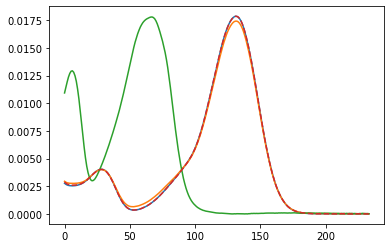

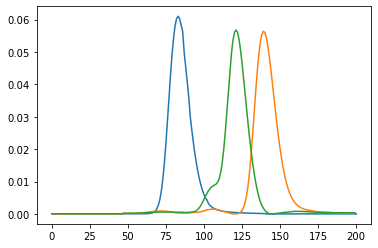

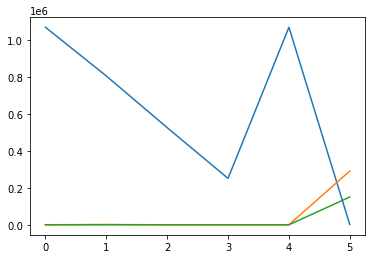

integral_array = [[1.06753329e+06 7.63497315e+02 6.39506754e+02]
 [8.04465984e+05 2.32469935e+03 8.51096072e+02]
 [5.25388443e+05 3.49396168e+02 9.41306352e+02]
 [2.51227402e+05 0.00000000e+00 7.88074640e+02]
 [1.06753329e+06 7.63497315e+02 6.39506754e+02]
 [2.53241591e+03 2.90856843e+05 1.50662369e+05]]
objective_val_non_comp = 8060.580716366503
objective_val_comp = 3716148.3999665435
objective_total_sum = 4168260.6086356374
impure_peak_sum = 444051.6279527275
----- new PARAFAC decomposition with iteration offset 48 -----
new data tensor with boundaries (1413, 1614) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_c

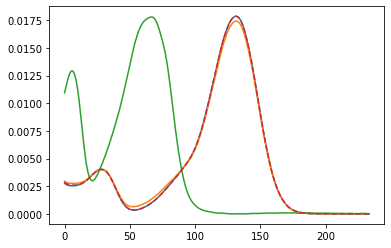

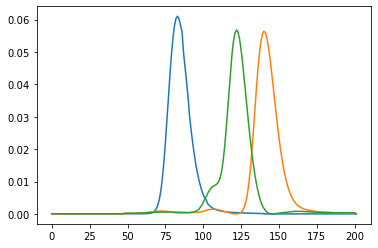

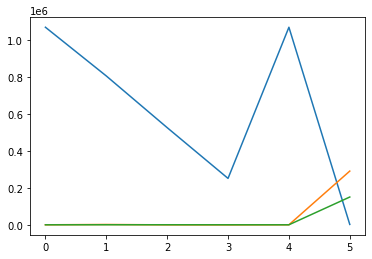

integral_array = [[1.06763494e+06 6.53419678e+02 6.73636432e+02]
 [8.04541918e+05 2.32602712e+03 8.49669571e+02]
 [5.25438742e+05 3.02670698e+02 9.20735624e+02]
 [2.51251185e+05 0.00000000e+00 7.79837348e+02]
 [1.06763494e+06 6.53419678e+02 6.73636432e+02]
 [2.59407292e+03 2.90803378e+05 1.50670118e+05]]
objective_val_non_comp = 7833.05258113763
objective_val_comp = 3716501.734031954
objective_total_sum = 4168402.355476511
impure_peak_sum = 444067.5688634194
----- new PARAFAC decomposition with iteration offset 49 -----
new data tensor with boundaries (1413, 1615) and shape(5,) built from QualiComponent(compound_id='4-dimethylaminobenzaldehyde', left=1471, right=1553, maximum=1496, offset=0, spectrum=<class 'list'>, created_from=[ProcessedPeak(left=1462, right=1544, maximum=1487, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=1, saturation=False, pure=True, integral=1062012.9415375574, istd=[], compound_id='4-dimethylaminobenzaldehyde', concentration=0.982, is_comp

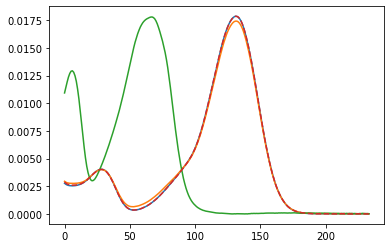

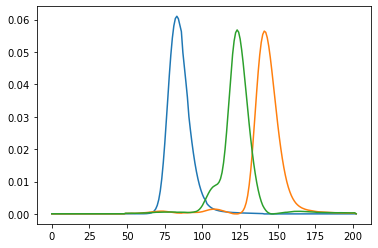

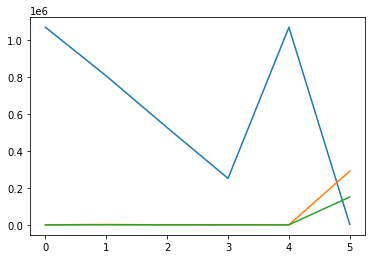

integral_array = [[1.06771543e+06 5.63246008e+02 7.03892013e+02]
 [8.04602372e+05 2.33630289e+03 8.48577964e+02]
 [5.25478283e+05 2.87290470e+02 9.01592289e+02]
 [2.51269993e+05 0.00000000e+00 7.67427424e+02]
 [1.06771543e+06 5.63246008e+02 7.03892013e+02]
 [2.72038146e+03 2.90685536e+05 1.50677574e+05]]
objective_val_non_comp = 7675.467077149117
objective_val_comp = 3716781.504835118
objective_total_sum = 4168540.4628774626
impure_peak_sum = 444083.49096519494


In [18]:
show_parafac_analytics = True
non_comp_sums = []
comp_sums = []
total_integral_sums = []
impure_peak_sums = []
offsets = [i - 50 for i in list(range(100))]
for iter_offset in offsets:
    parafac_factors, boundaries, comp_tensor_shape, y_offset =\
        parafac(impure_peak, knoev_campaign_2.quali_comp_db, iter_offset, show_parafac_analytics)
    non_comp_sum = get_all_non_comp_sum(parafac_factors, comp_tensor_shape, show_parafac_analytics)
    non_comp_sums.append(non_comp_sum)

    comp_sum = get_all_comp_sum(parafac_factors, comp_tensor_shape, show_parafac_analytics)
    comp_sums.append(comp_sum)

    total_integral_sum = get_total_integral_sum(parafac_factors, show_parafac_analytics)
    total_integral_sums.append(total_integral_sum)
    
    impure_peak_sum = get_impure_integral_sum(parafac_factors, show_parafac_analytics)
    impure_peak_sums.append(impure_peak_sum)

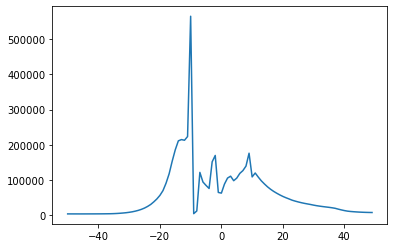

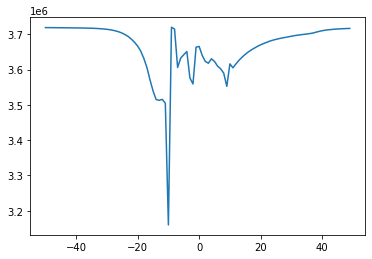

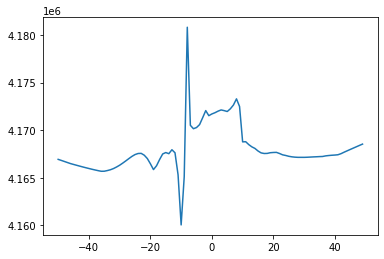

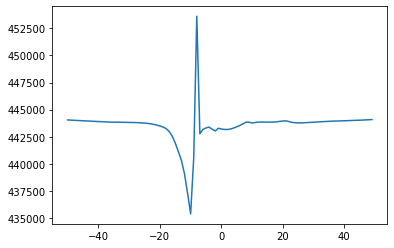

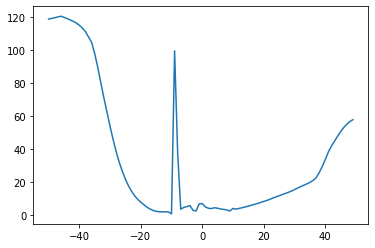

In [24]:
plt.plot(offsets, non_comp_sums)
plt.show()
plt.plot(offsets, comp_sums)
plt.show()
plt.plot(offsets, total_integral_sums)
plt.show()
plt.plot(offsets, impure_peak_sums)
plt.show()
plt.plot(offsets, [i / j for i, j in zip(impure_peak_sums, non_comp_sums)])
plt.show()

In [97]:
from scipy import optimize

In [ ]:
def objective_function(offset):
    parafac_factors, boundaries, comp_tensor_shape, y_offset =\
        parafac(impure_peak, knoev_campaign.quali_comp_db, offset, show_parafac_analytics)
    impure_peak_sum = get_impure_integral_sum(parafac_factors, show_parafac_analytics)
    return -impure_peak_sum
    

In [90]:
parafac_factors[2][-1, :]

array([114770.31018277,  51295.70536387,  27329.22637611])

In [49]:
import os

def countlines(start, lines=0, header=True, begin_start=None):
    if header:
        print('{:>10} |{:>10} | {:<20}'.format('ADDED', 'TOTAL', 'FILE'))
        print('{:->11}|{:->11}|{:->20}'.format('', '', ''))

    for thing in os.listdir(start):
        thing = os.path.join(start, thing)
        if os.path.isfile(thing):
            if thing.endswith('.py'):
                with open(thing, 'r') as f:
                    newlines = f.readlines()
                    newlines = list(filter(lambda l : not l.startswith("#"), newlines))
                    newlines = list(filter(lambda l : l.replace(" ", "")  not in ['\n', '\r\n'], newlines))
                    newlines = len(newlines)
                    lines += newlines

                    if begin_start is not None:
                        reldir_of_thing = '.' + thing.replace(begin_start, '')
                    else:
                        reldir_of_thing = '.' + thing.replace(start, '')

                    print('{:>10} |{:>10} | {:<20}'.format(
                            newlines, lines, reldir_of_thing))


    for thing in os.listdir(start):
        thing = os.path.join(start, thing)
        if os.path.isdir(thing):
            lines = countlines(thing, lines, header=False, begin_start=start)

    return lines

In [50]:
countlines(r'/Users/haascp/Documents/GitHub/mocca/src/mocca')

     ADDED |     TOTAL | FILE                
-----------|-----------|--------------------
        14 |        14 | ./__init__.py       
        85 |        99 | ./visualization/parafac_plots.py
         0 |        99 | ./visualization/__init__.py
       111 |       210 | ./visualization/basic_plots.py
        12 |       222 | ./visualization/utils.py
        66 |       288 | ./visualization/results_plot.py
        79 |       367 | ./visualization/calibration_plots.py
       106 |       473 | ./dad_data/models.py
         0 |       473 | ./dad_data/__init__.py
        78 |       551 | ./dad_data/utils.py 
        64 |       615 | ./dad_data/process_gradientdata.py
       117 |       732 | ./dad_data/process_funcs.py
         0 |       732 | ./apis/__init__.py  
        51 |       783 | ./apis/chemstation_api.py
        47 |       830 | ./apis/labsolutions_api.py
       124 |       954 | ./chromatogram/correct.py
         0 |       954 | ./chromatogram/__init__.py
        58 |      1012

3852

In [38]:
import numpy as np
a = np.ndarray([[[1,2,3,4,5], [2,2,3,4,5], [3,2,3,4,5]], [[4,2,3,4,5], [5,2,3,4,5], [6,2,3,4,5]]])
a[:, 2]

TypeError: 'list' object cannot be interpreted as an integer

In [19]:
template_peak = campaign.chroms[0].peaks[1]

In [20]:
peak = CorrectedPeak(left=template_peak.left,
                         right=template_peak.right,
                         maximum=template_peak.maximum,
                         dataset=template_peak.dataset,
                         idx=template_peak.idx,
                         saturation=template_peak.saturation,
                         pure=template_peak.pure,
                         integral=template_peak.integral,
                         offset=template_peak.offset,
                         istd=template_peak.istd)

In [21]:
peak

CorrectedPeak(left=737, right=780, maximum=751, dataset=CompoundData(hplc_system_tag='labsolutions', experiment=Experiment(path='/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_4.txt', compound=None, istd=[InternalStandard(key='tetralin', conc=0.06094)], gradient=False, processed=True), path='/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_4.txt', data=array([[0.60540834, 0.60062571, 0.56764307, ..., 0.11308614, 0.10714952,
        0.0958129 ],
       [0.53313182, 0.5290444 , 0.49815698, ..., 0.13909139, 0.13275872,
        0.12262604],
       [0.46866425, 0.46518778, 0.43811131, ..., 0.16722611, 0.15765711,
        0.14848811],
       ...,
       [0.00985935, 0.00982639, 0.00819342, ..., 0.00556906, 0.00459204,
        0.00421501],
       [0.00773878, 0.00772346, 0.00750815, ..., 0.00479489, 0.00421391,
        0.00543293],
       [0.        , 0.     

In [19]:
def overlap(peak, component):
        return component.left <= peak.left <= component.right \
            or peak.left <= component.left <= peak.right

In [20]:
for comp in campaign.quali_comp_db:
    print(comp.compound_id, comp.left, comp.right)
    print(overlap(peak, comp))

tetralin 1394 1459
False
2-chlorotuluene 1283 1326
True
o-tolunitrile 994 1091
False


In [22]:
parafac_peaks = get_parafac_peaks(peak, campaign.quali_comp_db, show_parafac_analytics = True)

In [39]:
import numpy as np
from mocca.peak.utils import get_peak_data

In [40]:
left = parafac_peaks[0].left
right = parafac_peaks[0].right

In [42]:
np.max(get_peak_data(parafac_peaks[0]))

57.22552730058658

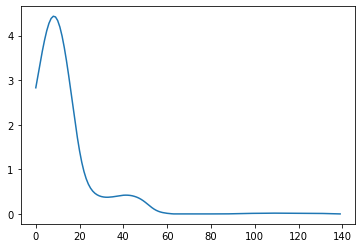

In [52]:
plt.plot(get_peak_data(parafac_peaks[0])[:, 50])

In [23]:
peak.idx

2

In [24]:
parafac_peaks[0].idx

-2

In [231]:
parafac_tensor = (test[0], test[1], test[2])

[autoreload of mocca.peak.resolve_impure failed: Traceback (most recent call last):
  File "/Users/haascp/opt/anaconda3/envs/mocca-dev/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/Users/haascp/opt/anaconda3/envs/mocca-dev/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 394, in superreload
    module = reload(module)
  File "/Users/haascp/opt/anaconda3/envs/mocca-dev/lib/python3.9/imp.py", line 314, in reload
    return importlib.reload(module)
  File "/Users/haascp/opt/anaconda3/envs/mocca-dev/lib/python3.9/importlib/__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 613, in _exec
  File "<frozen importlib._bootstrap_external>", line 846, in exec_module
  File "<frozen importlib._bootstrap_external>", line 983, in get_code
  File "<frozen importlib._bootstrap_external>", line 913, in source_to_code
  File "<frozen 

In [233]:
parafac_comp_tensors = []
for i in range(2):
    parafac_comp_tensor = (parafac_tensor[0][:, i],
                           parafac_tensor[1][:, i],
                           parafac_tensor[2][:, i])
    parafac_comp_tensors.append(parafac_comp_tensor)

In [248]:
parafac_comp_tensors[0][0].size

140

In [80]:
for peak in campaign.chroms[0].peaks:
    display(peak.maximum)
    display(peak.compound_id)
    display(peak.integral)
    display(peak.concentration)

376

'unknown_1'

206550.8402845089

None

751

'unknown_2'

16187.308089379052

None

1007

None

108227.6753674092

None

1294

'2-chlorotuluene'

15995.194547856316

0.03258938909374124

1351

'unknown_3'

310478.6081232501

None

1406

'tetralin'

45524.56221006884

0.030565292181505214

In [35]:
for chrom in campaign.compound_chroms:
    display(chrom.dataset.path)
    for peak in chrom.peaks:
        display(peak.compound_id)
        display(peak.integral)
        #display(peak.concentration)
        display(peak.istd)

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_96.txt'

'2-chlorotuluene'

10618.060848096951

[]

'tetralin'

90765.2642286953

[]

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_88.txt'

'2-chlorotuluene'

29082.561621718694

[IstdPeak(maximum=1407, integral=37415.788129257555, offset=1, compound_id='tetralin', concentration=0.06094)]

'tetralin'

37415.788129257555

[IstdPeak(maximum=1407, integral=37415.788129257555, offset=1, compound_id='tetralin', concentration=0.06094)]

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_89.txt'

'2-chlorotuluene'

22403.533720771888

[IstdPeak(maximum=1406, integral=40018.91508806365, offset=0, compound_id='tetralin', concentration=0.06094)]

'tetralin'

40018.91508806365

[IstdPeak(maximum=1406, integral=40018.91508806365, offset=0, compound_id='tetralin', concentration=0.06094)]

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_92.txt'

'o-tolunitrile'

203579.565272476

[IstdPeak(maximum=1406, integral=39027.10437635546, offset=0, compound_id='tetralin', concentration=0.06094)]

'tetralin'

39027.10437635546

[IstdPeak(maximum=1406, integral=39027.10437635546, offset=0, compound_id='tetralin', concentration=0.06094)]

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_93.txt'

'o-tolunitrile'

123388.0305363853

[IstdPeak(maximum=1408, integral=32509.528803783243, offset=2, compound_id='tetralin', concentration=0.06094)]

'tetralin'

32509.528803783243

[IstdPeak(maximum=1408, integral=32509.528803783243, offset=2, compound_id='tetralin', concentration=0.06094)]

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_94.txt'

'o-tolunitrile'

101291.93802706029

[IstdPeak(maximum=1405, integral=39231.976970444244, offset=-1, compound_id='tetralin', concentration=0.06094)]

'tetralin'

39231.976970444244

[IstdPeak(maximum=1405, integral=39231.976970444244, offset=-1, compound_id='tetralin', concentration=0.06094)]

In [177]:
for comp in campaign.quali_comp_db.items:
    display(comp.compound_id)
    display(comp.maximum)
    display(len(comp.created_from))


'tetralin'

1406

7

'2-chlorotuluene'

1295

3

'o-tolunitrile'

1007

3

In [48]:
for comp in campaign.quant_comp_db.items:
    display(comp.compound_id)
    display(comp.calib_factors)
    display(comp.calib_data)
    display(comp.calib_scores)
    display(len(comp.created_from))

'tetralin'

{'absolute': 1489420.15472096}

{'absolute': [(0.06094, 90765.2642286953)]}

{'absolute': nan}

1

'2-chlorotuluene'

{'absolute': 490809.8921967266, 'tetralin': 0.7806230737067894}

{'absolute': [(0.0603, 29082.561621718694), (0.04422, 22403.533720771888)],
 'tetralin': [(0.0603, 0.04736747223137285), (0.04422, 0.03411565110996862)]}

{'absolute': 0.9662250880730451, 'tetralin': 0.9971485738520937}

2

'o-tolunitrile'

{'absolute': 3237864.687574665, 'tetralin': 5.318045099264461}

{'absolute': [(0.05955, 203579.565272476),
  (0.04367, 123388.0305363853),
  (0.029775, 101291.93802706029)],
 'tetralin': [(0.05955, 0.3178851955827124),
  (0.04367, 0.23129423456953574),
  (0.029775, 0.15733927219674235)]}

{'absolute': 0.9199017630682809, 'tetralin': 0.9997418952808681}

3

In [65]:
for chrom in campaign.bad_chroms:
    display(chrom.dataset.path)

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_90.txt'

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_91.txt'

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_95.txt'

In [25]:
test = ((1, 2), (2, 4), (3, 6), (4, 8))

In [26]:
for i in zip(*test):
    print(i)

(1, 2, 3, 4)
(2, 4, 6, 8)


In [27]:
reaction_folders[81]

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_85.txt'

In [22]:
stats = campaign.quant_comp_db.items[2].calib_scores
max(stats, key=lambda key: stats[key])

'tetralin'

In [24]:
"a" is 'a'

<>:1: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:1: SyntaxWarning: "is" with a literal. Did you mean "=="?
/var/folders/c_/gt8zcwrn18s1dhd756dg2srw0000gn/T/ipykernel_1926/4094855256.py:1: SyntaxWarning: "is" with a literal. Did you mean "=="?
  "a" is 'a'


True

In [64]:
reaction_folders[0]

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_4.txt'

In [24]:
class Vehicle:
    pass

class Truck(Vehicle):
    pass

In [26]:
isinstance(Truck(), Vehicle)    # returns True

True

In [ ]:
 # check if it gets better in positive direction
    if impure_sum_new > impure_sum_cur:
        iter_max = relative_distance_thresh * len(impure_peak.dataset.time)\
            - impure_peak.offset
        # find local minimum
        while (non_comp_sum_new < non_comp_sum_cur and
               comp_sum_new > comp_sum_cur and iter_offset_new < iter_max):
            non_comp_sum_cur = non_comp_sum_new
            comp_sum_cur = comp_sum_new
            parafac_factors_cur = parafac_factors_new
            boundaries_cur = boundaries_new
            iter_offset_cur = iter_offset_new
            iter_offset_new += 1
            parafac_factors_new, boundaries_new, *_ = parafac(impure_peak,
                                                              quali_comp_db,
                                                              iter_offset_new,
                                                              show_parafac_analytics)
            non_comp_sum_new = get_all_non_comp_sum(parafac_factors_new,
                                                    comp_tensor_shape,
                                                    show_parafac_analytics)
            comp_sum_new = get_all_comp_sum(parafac_factors_new,
                                            comp_tensor_shape,
                                            show_parafac_analytics)
    
    # if positive was wrong direction, let's go negative
    else:
        iter_offset_new = iter_offset_cur - 1
        parafac_factors_new, boundaries_new, *_ = parafac(impure_peak,
                                                         quali_comp_db,
                                                         iter_offset_new,
                                                         show_parafac_analytics)
        non_comp_sum_new = get_all_non_comp_sum(parafac_factors_new,
                                                comp_tensor_shape,
                                                show_parafac_analytics)
        comp_sum_new = get_all_comp_sum(parafac_factors_new,
                                        comp_tensor_shape,
                                        show_parafac_analytics)
        
        # check if it gets better in negative direction
        if non_comp_sum_new < non_comp_sum_cur and comp_sum_new > comp_sum_cur:
            iter_min = -int(math.floor(0.05 * parafac_factors_new[1].shape[0])) + iter_offset_cur
            # find local minimum
            while (non_comp_sum_new < non_comp_sum_cur and
                   comp_sum_new > comp_sum_cur and iter_offset_new > iter_min):
                non_comp_sum_cur = non_comp_sum_new
                comp_sum_cur = comp_sum_new
                parafac_factors_cur = parafac_factors_new
                boundaries_cur = boundaries_new
                iter_offset_cur = iter_offset_new
                iter_offset_new -= 1
                
                parafac_factors_new, boundaries_new, *_ = parafac(impure_peak,
                                                                 quali_comp_db,
                                                                 iter_offset_new,
                                                                 show_parafac_analytics)
                non_comp_sum_new = get_all_non_comp_sum(parafac_factors_new,
                                                        comp_tensor_shape,
                                                        show_parafac_analytics)
                comp_sum_new = get_all_comp_sum(parafac_factors_new,
                                                comp_tensor_shape,
                                                show_parafac_analytics)
        
        # if negative also does not give progress, start point is minimum
    return parafac_factors_cur, boundaries_cur, iter_offset_cur, y_offset


In [1]:
import numpy as np
from time import time

# Prepare data
np.random.RandomState(100)
arr = np.random.randint(0, 10, size=[200000, 5])
data = arr.tolist()
data[:10]

[[4, 4, 7, 7, 6],
 [1, 0, 2, 7, 5],
 [4, 9, 1, 6, 0],
 [3, 5, 6, 3, 1],
 [2, 4, 5, 0, 1],
 [2, 8, 8, 5, 4],
 [9, 8, 4, 8, 3],
 [3, 1, 2, 5, 9],
 [4, 2, 4, 3, 6],
 [6, 9, 1, 0, 9]]

In [8]:
from test import howmany_within_range, howmany_within_range_rowonly

In [9]:
%%time
results = []
for row in data:
    results.append(howmany_within_range(row, minimum=4, maximum=8))

print(results[:10])

[5, 2, 2, 2, 2, 4, 3, 1, 3, 1]
CPU times: user 117 ms, sys: 19.2 ms, total: 136 ms
Wall time: 135 ms


In [10]:
# Parallelizing using Pool.apply()

import multiprocessing as mp

In [11]:
%%time
# Step 1: Init multiprocessing.Pool()
pool = mp.Pool(mp.cpu_count())

# Step 2: `pool.apply` the `howmany_within_range()`
results = [pool.apply(howmany_within_range, args=(row, 4, 8)) for row in data]

# Step 3: Don't forget to close
pool.close()    

print(results[:10])

Process SpawnPoolWorker-220:
Process SpawnPoolWorker-224:
Process SpawnPoolWorker-216:
Process SpawnPoolWorker-219:
Process SpawnPoolWorker-218:
Process SpawnPoolWorker-215:
Process SpawnPoolWorker-214:
Process SpawnPoolWorker-221:
Process SpawnPoolWorker-212:
Process SpawnPoolWorker-211:
Process SpawnPoolWorker-213:
Process SpawnPoolWorker-209:
Process SpawnPoolWorker-210:
Process SpawnPoolWorker-223:
Process SpawnPoolWorker-222:
Process SpawnPoolWorker-217:
Process SpawnPoolWorker-179:
Process SpawnPoolWorker-178:
Process SpawnPoolWorker-177:
Process SpawnPoolWorker-181:
Process SpawnPoolWorker-180:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/Users/haascp/opt/anaconda3/envs/mocca-dev/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/haascp/opt/anaconda3/envs/mocca-d

KeyboardInterrupt: 

In [12]:
%%time
pool = mp.Pool(mp.cpu_count())

results = pool.map(howmany_within_range_rowonly, [row for row in data])

pool.close()

print(results[:10])

[5, 2, 2, 2, 2, 4, 3, 1, 3, 1]
CPU times: user 98.7 ms, sys: 98.2 ms, total: 197 ms
Wall time: 202 ms


In [14]:
%%time
pool = mp.Pool(mp.cpu_count())

results = pool.starmap(howmany_within_range, [(row, 4, 8) for row in data])

pool.close()

print(results[:10])

[5, 2, 2, 2, 2, 4, 3, 1, 3, 1]
CPU times: user 280 ms, sys: 106 ms, total: 386 ms
Wall time: 384 ms
